# Modelo predictivo de pozo de agua

El propósito de este trabajo es llevar a cabo la modelización predictiva del mantenimiento relacionado con los pozos de agua. Utilizaremos una base de datos obtenida de la plataforma Driven Data (https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/25/). El enfoque del estudio se centrará en la modelización supervisada utilizando Machine Learning, con la variable objetivo "status_group". Para lograr esto, realizaremos un preprocesamiento de los datos y probaremos diversos algoritmos de modelado.

## Importamos librerías y dataset

In [1]:
import pandas as pd
import numpy as np
from datetime import datetime

#Estadística
import scipy.stats as stats

#Visualización
import matplotlib.pyplot as plt
import seaborn as sns

#Preprocesado
from sklearn.impute import KNNImputer
from sklearn.preprocessing import LabelEncoder

#Modelos de selección.
from sklearn.model_selection import train_test_split

#Modelización.
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
import xgboost
from sklearn.ensemble import VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import ExtraTreesClassifier
import pycaret
from pycaret.classification import *

#Hiperparámetros
from sklearn.model_selection import GridSearchCV

#Balanceo de datos
from imblearn.over_sampling import SMOTE

#Métricas
from sklearn.metrics import accuracy_score, auc, confusion_matrix, f1_score, precision_score, recall_score, roc_curve, classification_report

In [2]:
#Casilla opcional para ver la totalidad de filas y columnas.
#pd.set_option('display.max_columns', None)
#pd.set_option('display.max_rows', None)

##### Leemos los archivos

El df_1 le emplearemos para testear el modelo. Realizaremos la predicción en base a estos datos del modelo que realicemos y lo subiremos a la plataforma.

In [3]:
# Lectura de datos
df_1 = pd.read_csv(r'Test_set_values.csv')
df_1.head(1)

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,50785,0.0,2013-02-04,Dmdd,1996,DMDD,35.290799,-4.059696,Dinamu Secondary School,0,...,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,other,other


In [4]:
df_1.shape

(14850, 40)

df_2 y df_3 representan nuestros datos de entrenamiento. df_2 como la variable objetivo y df_3 con las etiquetas y variables.

In [5]:
# Lectura de datos
df_2 = pd.read_csv(r'Training_set_labels.csv')
df_2.head(1)

,id,status_group
0,69572,functional


In [6]:
df_2.shape

(59400, 2)

In [7]:
# Lectura de datos
df_3 = pd.read_csv(r'Training_set_values.csv')
df_3.head(1)

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,...,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe


In [8]:
df_3.shape

(59400, 40)

Generamos el Dataframe general donde combinamos las columnas descriptivas y objetivo con el fin de modelizar.

##### Unificamos los dos dataframes de train en uno único

In [9]:
print('Clientes en training presentes en labels\n', df_2['id'].isin(df_3['id']).value_counts())
print('Clientes en labels presentes en training\n', df_3['id'].isin(df_2['id']).value_counts())

Clientes en training presentes en labels
 id
True    59400
Name: count, dtype: int64
Clientes en labels presentes en training
 id
True    59400
Name: count, dtype: int64


In [10]:
print(df_2['id'].duplicated().value_counts())
print(df_3['id'].duplicated().value_counts())

id
False    59400
Name: count, dtype: int64
id
False    59400
Name: count, dtype: int64


Todos los id están presentes en ambas tablas, y tampoco hay valores duplicados de ids en ambos dataframes, por lo que podemos hacer el join inner sin problemas.

In [11]:
df = pd.merge(df_2,df_3, on = 'id', how='inner')

In [12]:
df.head(3)

,id,status_group,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,...,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,69572,functional,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,...,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
1,8776,functional,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,...,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe
2,34310,functional,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,...,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe


In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 41 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     59400 non-null  int64  
 1   status_group           59400 non-null  object 
 2   amount_tsh             59400 non-null  float64
 3   date_recorded          59400 non-null  object 
 4   funder                 55763 non-null  object 
 5   gps_height             59400 non-null  int64  
 6   installer              55745 non-null  object 
 7   longitude              59400 non-null  float64
 8   latitude               59400 non-null  float64
 9   wpt_name               59398 non-null  object 
 10  num_private            59400 non-null  int64  
 11  basin                  59400 non-null  object 
 12  subvillage             59029 non-null  object 
 13  region                 59400 non-null  object 
 14  region_code            59400 non-null  int64  
 15  di

In [14]:
df.describe()

,id,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year
count,59400.000000,59400.000000,59400.000000,59400.000000,5.940000e+04,59400.000000,59400.000000,59400.000000,59400.000000,59400.000000
mean,37115.131768,317.650385,668.297239,34.077427,-5.706033e+00,0.474141,15.297003,5.629747,179.909983,1300.652475
std,21453.128371,2997.574558,693.116350,6.567432,2.946019e+00,12.236230,17.587406,9.633649,471.482176,951.620547
min,0.000000,0.000000,-90.000000,0.000000,-1.164944e+01,0.000000,1.000000,0.000000,0.000000,0.000000
25%,18519.750000,0.000000,0.000000,33.090347,-8.540621e+00,0.000000,5.000000,2.000000,0.000000,0.000000
50%,37061.500000,0.000000,369.000000,34.908743,-5.021597e+00,0.000000,12.000000,3.000000,25.000000,1986.000000
75%,55656.500000,20.000000,1319.250000,37.178387,-3.326156e+00,0.000000,17.000000,5.000000,215.000000,2004.000000
max,74247.000000,350000.000000,2770.000000,40.345193,-2.000000e-08,1776.000000,99.000000,80.000000,30500.000000,2013.000000


In [15]:
df.describe(exclude=np.number)

,status_group,date_recorded,funder,installer,wpt_name,basin,subvillage,region,lga,ward,...,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
count,59400,59400,55763,55745,59398,59400,59029,59400,59400,59400,...,59400,59400,59400,59400,59400,59400,59400,59400,59400,59400
unique,3,356,1896,2145,37399,9,19287,21,125,2092,...,7,8,6,5,5,10,7,3,7,6
top,functional,2011-03-15,Government Of Tanzania,DWE,none,Lake Victoria,Madukani,Iringa,Njombe,Igosi,...,never pay,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
freq,32259,572,9084,17402,3563,10248,508,5294,2503,307,...,25348,50818,50818,33186,33186,17021,17021,45794,28522,34625


A primer golpe de vista podemos observar que ciertas variables tienen valores nulos, así como diferentes tipos de datos, de tipo float, int y objeto. En posteriores pasos preprocesaremos los datos, tanto para imputar los valores nulos, como para tramificar las diferentes variables y, paralelamente, convertir los valores string a numéricos.Tendremos que ver, detalladamente, qué hacer en cada uno de los casos.

Nuestra columna objetivo será status_group.

## Preprocesado

Como un primer paso, la variable id no nos aporta nada de información en nuestro dataset, simplemente es un identificador, por lo que vamos a colocarla como índice de nuestro dataset y retirar una columna de este modo.

In [16]:
df.set_index('id',inplace=True)

### Variable objetivo

Con el fin de poder contextualizar y conocer un poco más a nuestra variable objetivo vamos a visualizarla y ver cómo está distribuido en nuestros datos de entrenamiento.

Cantidad de valores totales: 59400 
Distribuidos de la siguiente manera: status_group
functional                 32259
non functional             22824
functional needs repair     4317
Name: count, dtype: int64 
Con una distribución de % de : status_group
functional                 54.31
non functional             38.42
functional needs repair     7.27
Name: count, dtype: float64


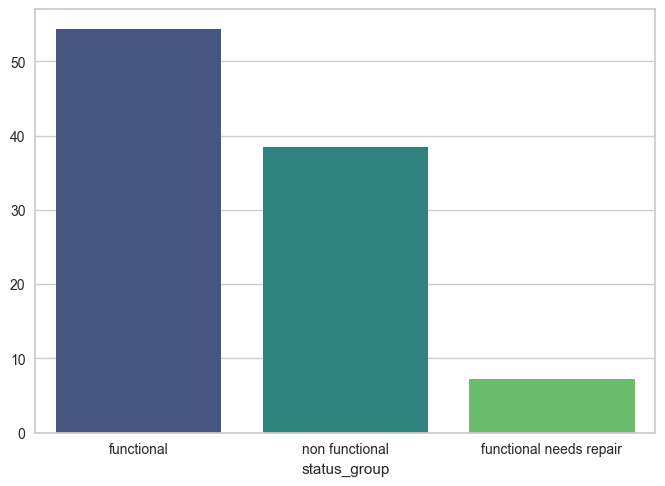

In [17]:
value_obj = df['status_group'].value_counts()

print('Cantidad de valores totales:', value_obj.sum(),'\nDistribuidos de la siguiente manera:', value_obj, '\nCon una distribución de % de :', round(value_obj*100/value_obj.sum(),2))

sns.barplot(x = value_obj.index,y = (value_obj.values/value_obj.sum())*100,palette ='viridis')
plt.show()

El 54 % de nuestros pozos están en funcionamiento, un 38% no y, tan solo un 7 % necesitan reparación. Este 7 % de los datos puede producirnos una peor modelización de esta categoría por tener un % muy inferior al resto de categorías, por ello, en futuras modelizaciones nos plantearemos el balanceo de datos para aportar certidumbre en esta categoría.

### Transformación de las variables de tiempo

Para poder tener en consideración los datos y evaluarlos, lo primero de todo que haremos es parametrizar nuestras columnas con factor tiempo. Estas son:
- date_recorded: Fecha de registro de la fila.
- construction_year: Año de construcción del pozo.

A primera vista no vemos una relación entre nuestras dos variables de tiempo.

In [18]:
df[['date_recorded','construction_year']].sort_values(by='construction_year')

,date_recorded,construction_year
id,,
37883,2011-04-13,0
40570,2011-07-22,0
47667,2013-03-01,0
49497,2011-08-02,0
72564,2013-01-29,0
...,...,...
21599,2013-03-25,2013
21796,2013-09-03,2013
48706,2013-05-02,2013


Vamos a pasar la columna date_recorded a una variable antiguedad de registro en días, para ello tomamos el último día de registro y lo restamos al resto de datos.

In [19]:
df['date_recorded'] = pd.to_datetime(df['date_recorded']).sort_values(ascending = False)
df['record_duration'] = (pd.to_datetime('2013-12-03')-df['date_recorded']).dt.days

In [20]:
df.head(1)

,status_group,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,record_duration
id,,,,,,,,,,,,,,,,,,,,,
69572,functional,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,...,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,995


Como ya hemos tratado la variable date_recorded y transformado en días a la variable record_duration, procedemos a eliminar la variable original.

In [21]:
df.drop('date_recorded',axis = 1, inplace = True)

### Missing values

Para poder evaluar nuestro modelo, su preprocesado y posterior modelización, deberemos evalaur qué porcentaje de valores nulos tenemos y cómo realizaremos la imputación en cada uno de los casos. En cualquiera de los casos no vamos a optar por la eliminación de registros con valores nulos, ya que esto nos implicaría la pérdida de un número muy elevado de registros y, con ello, de información.

In [22]:
miss_perc = df.apply(lambda x: x.isna().sum()/df.shape[0]*100)
miss_perc.sort_values(ascending=False).head(10)

scheme_name          48.501684
scheme_management     6.528620
installer             6.153199
funder                6.122896
public_meeting        5.612795
permit                5.144781
subvillage            0.624579
wpt_name              0.003367
water_quality         0.000000
management            0.000000
dtype: float64

In [23]:
df[['scheme_name','scheme_management','installer','funder','public_meeting','permit','subvillage','wpt_name']]

,scheme_name,scheme_management,installer,funder,public_meeting,permit,subvillage,wpt_name
id,,,,,,,,
69572,Roman,VWC,Roman,Roman,True,False,Mnyusi B,none
8776,NaN,Other,GRUMETI,Grumeti,NaN,True,Nyamara,Zahanati
34310,Nyumba ya mungu pipe scheme,VWC,World vision,Lottery Club,True,True,Majengo,Kwa Mahundi
67743,NaN,VWC,UNICEF,Unicef,True,True,Mahakamani,Zahanati Ya Nanyumbu
19728,NaN,NaN,Artisan,Action In A,True,True,Kyanyamisa,Shuleni
...,...,...,...,...,...,...,...,...
60739,Losaa Kia water supply,Water Board,CES,Germany Republi,True,True,Kiduruni,Area Three Namba 27
27263,Ikondo electrical water sch,VWC,Cefa,Cefa-njombe,True,True,Igumbilo,Kwa Yahona Kuvala
37057,NaN,VWC,NaN,NaN,True,False,Madungulu,Mashine


##### Variables booleanas

Ambas variables booleanas en  nuestro dataset tiene valores perdidos, con unos % bastante similares, 6,12 y 5,61 %. Las imputamos con la moda.

In [24]:
lista_bool = ['public_meeting','permit']

In [25]:
for i in lista_bool:
    print(df[i].value_counts(normalize = True))

public_meeting
True     0.909838
False    0.090162
Name: proportion, dtype: float64
permit
True     0.68955
False    0.31045
Name: proportion, dtype: float64


Claramente ambas columnas están balanceadas hacia True, en ambos casos la proporción de True es mucho más elevada que de False, por ello podemos imputar mediante el valor de la moda, ya que no hará cambiar la distribución de nuestras variables.

In [26]:
for i in lista_bool:
    df[i] = df[i].fillna(df[i].mode()[0])

##### Variables discretas

En el caso de las discretas, no podemos asumir su valor, asique, vamos a generar una nueva categoría con los valores vacíos llamada unknown, ya que las variables representan cuestiones como quién coloco la bomba, la impresa que la instaló, la empresa que la opera, localización o el nombre del punto del agua.

In [27]:
imp_nulo_unknown = ['scheme_name','scheme_management','installer','funder','subvillage','wpt_name']
for i in imp_nulo_unknown:
    df[i] = df[i].fillna('unknown')

Con esta último apartado hemos eliminado la totalidad de valores nulos de nuestro dataset.

Vamos a someter los datos de entrenamiento a diferentes tratamientos, por ello, a medida que vayamos avanzando en este tratamiento genereraremos diferentes funciones que nos servirán para aplicar porteriormente en los datos de testeo y subirlo posteriormente a la plataforma.


In [28]:
def preprocesado(data):
    data.drop('id', axis = 1, inplace = True) 
    data['date_recorded'] = pd.to_datetime(data['date_recorded']).sort_values(ascending = False)
    data['record_duration'] = (pd.to_datetime('2013-12-03')-data['date_recorded']).dt.days
    for i in lista_bool:
        data[i] = data[i].fillna(data[i].mode()[0])
    for i in imp_nulo_unknown:
        data[i] = data[i].fillna('unknown')
    data.drop('date_recorded',axis = 1, inplace = True)
    return data

### Conversión a datos numéricos

Para poder hacer una primera aproximación a nuestro modelo, vamos a pasar todos los datos a numérico y lanzar una primera aproximación con pycaret.

In [29]:
#Hacemos una copia de nuestro dataset para no pisar posteriormente los cambios que realicemos.
df_pycaret = df.copy()

**Variables booleanas**

Para identificar cuáles son estas variables, tomaremos aquellas columnas cuyo unique values sea == 2. En este caso vemos que las variables tendrán valores de True or False.

In [30]:
#Modificamos los string a numérico.
for i in lista_bool:
    df_pycaret[i] = df_pycaret[i].astype(int)

**Variables discretas**

Dentro de estas variables podemos hacerlo de varias maneras, definiremos como variables discretas aquellas que no sean numéricas ni booleanas.

In [31]:
#Excluimos los valolores contínuos
lista_cat = df.select_dtypes(exclude = np.number).columns
#Excluimos las columnas booleanas
lista_cat = [x for x in lista_cat if x not in lista_bool]
#Convertimos a lista
lista_cat = list(lista_cat)

In [32]:
for i in lista_cat:
    print(df_pycaret[i].value_counts())

status_group
functional                 32259
non functional             22824
functional needs repair     4317
Name: count, dtype: int64
funder
Government Of Tanzania    9084
unknown                   3637
Danida                    3114
Hesawa                    2202
Rwssp                     1374
                          ... 
Rarymond Ekura               1
Justine Marwa                1
Municipal Council            1
Afdp                         1
Samlo                        1
Name: count, Length: 1897, dtype: int64
installer
DWE             17402
unknown          3656
Government       1825
RWE              1206
Commu            1060
                ...  
Nu                  1
CCP                 1
Upendo Group        1
WA                  1
SELEPTA             1
Name: count, Length: 2145, dtype: int64
wpt_name
none                       3563
Shuleni                    1748
Zahanati                    830
Msikitini                   535
Kanisani                    323
             

Transformamos todos los valores a numéricos mediante LabelEnconder:

In [33]:
for i in lista_cat:
    le = LabelEncoder()
    df_pycaret[i] = le.fit_transform(df_pycaret[i])

In [34]:
df_pycaret.head(2)

,status_group,amount_tsh,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,...,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,record_duration
id,,,,,,,,,,,,,,,,,,,,,
69572,0,6000.0,1368,1390,1518,34.938093,-9.856322,37398,0,1,...,6,2,1,1,8,6,0,1,1,995
8776,0,0.0,469,1399,545,34.698766,-2.147466,37194,0,4,...,6,2,2,2,5,3,1,1,1,272


Para poder hacer una primera aproximación a nuestro modelo, vamos a pasar todos los datos a numérico y lanzar una primera aproximación con pycaret.

In [35]:
#Definimos la lista de variables categóricas de nuestro data set( las mismas variables que el dataset de entrenamiento a excepción de status_group( variable a predecir))
#Necesitaremos esta lista cuando pasemos a numérico nuestro dataset df_1 de testeo.
lista_cat_test = ['funder','installer','wpt_name','basin','subvillage','region','lga','ward','recorded_by','scheme_management',
             'scheme_name','extraction_type','extraction_type_group','extraction_type_class','management','management_group','payment',
             'payment_type','water_quality','quality_group','quantity','quantity_group','source','source_type','source_class','waterpoint_type','waterpoint_type_group']

In [36]:
#Generamos una función para codificar futuros datos.
def numerico(data):
    for i in lista_bool:
        data[i] = data[i].astype(int)
    for i in lista_cat_test:
        le = LabelEncoder()
        data[i] = le.fit_transform(data[i])
    return data

## Modelización 1

### Pycaret: Primera aproximación a la modelización

Como primera fase, y para poder evaluar qué tipo de modelado puede ser más conveniente para nuestros datos y qué podemos esperar de una manera aproximada e intuitiva  de nuestro modelo vamos a emplear pycaret.

In [37]:
model_setup = setup(data=df_pycaret, target='status_group', session_id=1)

,Description,Value
0,Session id,1
1,Target,status_group
2,Target type,Multiclass
3,Original data shape,"(59400, 40)"
4,Transformed data shape,"(59400, 40)"
5,Transformed train set shape,"(41580, 40)"
6,Transformed test set shape,"(17820, 40)"
7,Numeric features,39
8,Preprocess,True
9,Imputation type,simple


In [38]:
best_models = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.8062,0.9068,0.8062,0.8005,0.7996,0.6372,0.6407,3.2110
xgboost,Extreme Gradient Boosting,0.7978,0.9014,0.7978,0.7938,0.7872,0.6155,0.6230,1.3730
et,Extra Trees Classifier,0.7952,0.8969,0.7952,0.7895,0.7909,0.6211,0.6225,2.7120
lightgbm,Light Gradient Boosting Machine,0.7921,0.8951,0.7921,0.7927,0.7787,0.6004,0.6127,1.5130
gbc,Gradient Boosting Classifier,0.7531,0.8581,0.7531,0.7576,0.7323,0.5170,0.5375,16.8530
dt,Decision Tree Classifier,0.7404,0.7707,0.7404,0.7421,0.7412,0.5314,0.5315,0.3460
ada,Ada Boost Classifier,0.7236,0.8097,0.7236,0.7167,0.6980,0.4572,0.4757,1.4710
ridge,Ridge Classifier,0.6408,0.0000,0.6408,0.5951,0.6075,0.2871,0.3018,0.0860
lda,Linear Discriminant Analysis,0.6356,0.7066,0.6356,0.6195,0.6132,0.2895,0.3011,0.1780
lr,Logistic Regression,0.5661,0.6225,0.5661,0.5176,0.5065,0.1076,0.1289,4.1360


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

Nos es muy útil para poder sacar unas primeras conclusiones. En principio, el modelo que mejor rendimiento nos da es el RandomForest, y de cara a modelos ensemble sería interesante plantearnos implementar un xgboost.

In [39]:
model_rf = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8151,0.9119,0.8151,0.8083,0.8076,0.6532,0.6565
1,0.7992,0.9015,0.7992,0.7949,0.7950,0.6272,0.6293
2,0.8030,0.9000,0.8030,0.7992,0.7961,0.6294,0.6350
3,0.8095,0.9081,0.8095,0.8043,0.8017,0.6413,0.6461
4,0.7982,0.9034,0.7982,0.7926,0.7920,0.6226,0.6257
5,0.8105,0.9092,0.8105,0.8047,0.8047,0.6463,0.6489
6,0.7968,0.9037,0.7968,0.7889,0.7894,0.6194,0.6227
7,0.8093,0.9103,0.8093,0.8043,0.8031,0.6429,0.6467
8,0.8093,0.9118,0.8093,0.8013,0.8021,0.6435,0.6462


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

Evaluamos cuáles son las variables que cobran mayor grado de importancia para nuestra modelización. 

In [40]:
tune_model_rf = tune_model(model_rf)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7222,0.8266,0.7222,0.6988,0.6839,0.4387,0.4839
1,0.7181,0.8139,0.7181,0.7051,0.6774,0.4269,0.4826
2,0.7109,0.8036,0.7109,0.6990,0.6684,0.4109,0.4688
3,0.7140,0.8162,0.7140,0.6984,0.6735,0.4191,0.4721
4,0.7150,0.8142,0.7150,0.7023,0.6733,0.4199,0.4768
5,0.7092,0.8186,0.7092,0.6884,0.6691,0.4107,0.4585
6,0.7107,0.8111,0.7107,0.6959,0.6688,0.4113,0.4662
7,0.7253,0.8200,0.7253,0.7077,0.6861,0.4434,0.4948
8,0.7222,0.8165,0.7222,0.6990,0.6838,0.4388,0.4844


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


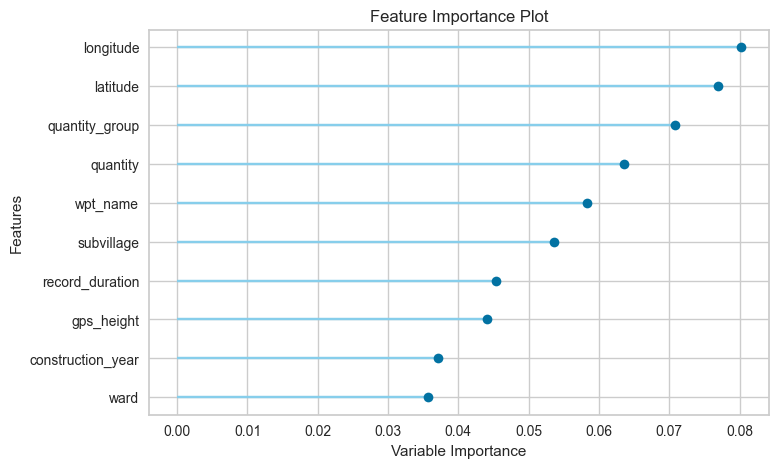

In [41]:
plot_model(tune_model_rf,plot='feature')

Como variables de importancia, tomamos longitude y latitude, seguida a nivel categórico de quantity y quantity_group.

### RandomForestClassifier, xgbooster y DecisionTreeClasiffier

Una vez observado mediante pycaret cuáles son los modelos más adecuados para nuestros datos, vamos a realizar tres primeras modelizaciones. El objetivo es poder obtener un primer resultado, e ir viendo el impacto que tiene las modificaciones y tramificaciones que haremos en nuestras variables posterioremente. También lo subiremos a la plataforma para ver el impacto que van teniendo las medidas que tomamos.

#### Partición de los datos

In [42]:
# Generamos una función para realizar la partición de los datos
def particion_datos(data,obj,test_size,random_state):
    X_train, X_test, y_train, y_test = train_test_split (data.drop(obj, axis=1), 
                                                     data[obj],
                                                     test_size = test_size,
                                                     random_state = random_state,
                                                     stratify = data[obj])
    return X_train,X_test,y_train,y_test

In [43]:
#Generamos una función que nos sacarán las métricas de nuestro modelo.
def saca_metricas(y_test,y_predict):
    num_classes = 3
    plt.figure(figsize=(3, 2))
    sns.set(font_scale=0.8)
    sns.heatmap(confusion_matrix(y_test, y_predict), annot=True, fmt='d', cmap='Blues', xticklabels=np.arange(num_classes), yticklabels=np.arange(num_classes))
    plt.xlabel('Etiqueta Predicha')
    plt.ylabel('Etiqueta Verdadera')
    plt.title('Matriz de Confusión')
    plt.show()
    print('ACCURACY')
    print('Accuracy promedio: ')
    print(accuracy_score(y_test,y_predict))
    print('PRECISION')
    print('Precisión por cada clase: ')
    print(precision_score(y_test,y_predict, average=None))
    print('Precisión promedio del modelo: ')
    print(precision_score(y_test,y_predict, average='micro'))
    print('RECALL')
    print('Recall por cada clase: ')
    print(recall_score(y_test,y_predict, average=None))
    print('Recall promedio del modelo: ')
    print(recall_score(y_test,y_predict, average='micro'))
    print('F1')
    print('F1 por cada clase: ')
    print(f1_score(y_test,y_predict, average=None))
    print('F1 promedio del modelo: ')
    print(f1_score(y_test,y_predict, average='micro'))
        # Curva ROC y AUC por clase
    fpr = {}
    tpr = {}
    roc_auc = {}
    n_classes = len(np.unique(y_test))
    for i in range(n_classes):
        y_true_bin = np.where(y_test == i, 1, 0)
        y_pred_bin = np.where(y_predict == i, 1, 0)
        fpr[i], tpr[i], _ = roc_curve(y_true_bin, y_pred_bin)
        roc_auc[i] = auc(fpr[i], tpr[i])
    
    # Graficar la curva ROC para cada clase
    plt.figure()
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f'Clase {i} (AUC = {roc_auc[i]:0.2f})')
    plt.plot([0, 1], [0, 1], 'r--')
    plt.xlabel('Tasa de Falsos Positivos')
    plt.ylabel('Tasa de Verdaderos Positivos')
    plt.title('Curva ROC por Clase')
    plt.legend()
    plt.show()

#### RandomForestClassifier

Basado en árboles de decisión, combina múltiples árboles de decisión aleatorios entrenados de forma independiente, eligiendo como final la clase más votada.

In [44]:
X_train_1, X_test_1, y_train_1, y_test_1 = particion_datos(df_pycaret,'status_group',0.2,None)

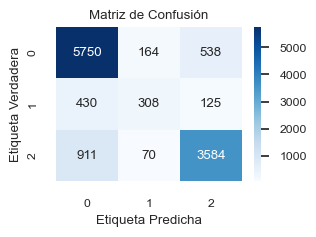

ACCURACY
Accuracy promedio: 
0.8116161616161616
PRECISION
Precisión por cada clase: 
[0.81088704 0.56826568 0.8438898 ]
Precisión promedio del modelo: 
0.8116161616161616
RECALL
Recall por cada clase: 
[0.89119653 0.35689455 0.78510405]
Recall promedio del modelo: 
0.8116161616161616
F1
F1 por cada clase: 
[0.84914716 0.43843416 0.81343622]
F1 promedio del modelo: 
0.8116161616161616


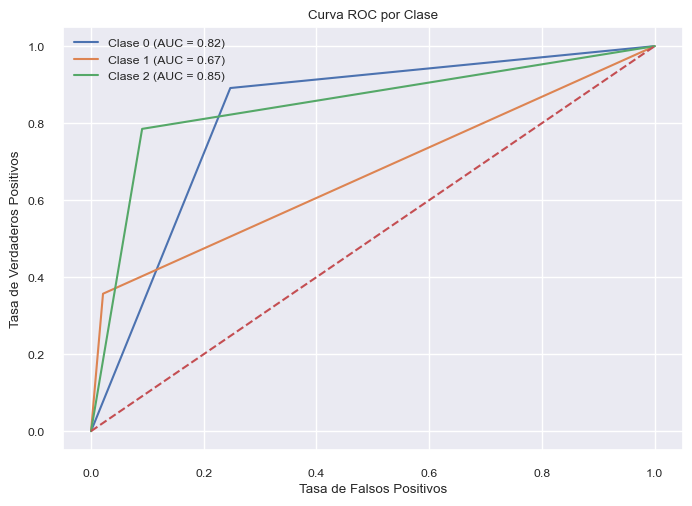

In [45]:
#RandomForest con el DataFrame sin tratar.
model_1_random = RandomForestClassifier()
model_1_random.fit(X_train_1,y_train_1)
random_predict_1 = model_1_random.predict(X_test_1)

saca_metricas(y_test_1, random_predict_1)

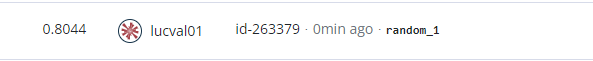

Al ser nuestro primer modelo, vamos a explicar campo a campo qué significa cada una de las métricas y qué nos dicen de nuestro modelo.

**Matriz de confusión**

La matriz de cofusión representa cuántos valores acertó nuestra predicción y cuántos predijo erróneamente. Por ejemplo, en la clase 0 el modelo predijo correctamente 5750 valores, 164 los predijo como clase 1, aunque eran clase 0, y 538 los predijo como clase 2, cuando eran clase 0.

Veamos las métricas:

**Accuracy**

Recordamos que accuracy representa el % de predicciones correctas respecto al total de predicciones. Con un Accuracy de 81,16 % general, es el % de predicciones que realizó correctamente nuestro modelo.

**Precisión**

Mide la proporción de instancias positivas identificadas correctamente por el modelo entre todas las instancias que el modelo clasificó como positivas, es deciir, de todas las instancias positivas, ¿ cuántas eran realmente positivas?. Si observamos las clases, vemos claramenre que el grupo 1 [0.81088704 0.56826568 0.8438898 ] está muy desbalanceado. Esto es lógico, ya que es el grupo con menor cantidad de valores, por lo que el modelo no se ha podido " entrenar" al mismo nivel que con las otras 2 clases.

De todas las positivas que detectó nuestro modelo el 80,16 % eran realmente positivas.

**Recall**

La sensibilidad mide la instancias identificadas como positivas frente a la realmente positivas, es decir, de todas las positivas reales, ¿ cuántas fueron identificadas correctamente como positivas?

Recall muy alto para clase 0, pero muy bajo para la clase 1, esto nos indica lo que ya intuíamos por el desbalanceo entre grupos, la clase 1 nos baja las métricas del modelo general, ya que el modelo solamente predice un 36% de los valores positivos de esta clase.

**F1**

Esta métrica nos indica el equilibrio entre precisión y recall. 81,16 a modo general, el cual es una buena métrica, pero nos ocurre lo mismo que con las anteriores métricas, baja en la clase 1 [0.84914716 0.43843416 0.81343622]

#### xgbooster

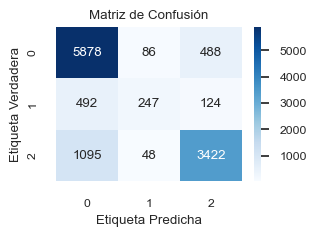

ACCURACY
Accuracy promedio: 
0.8036195286195286
PRECISION
Precisión por cada clase: 
[0.7874079  0.64829396 0.84828954]
Precisión promedio del modelo: 
0.8036195286195286
RECALL
Recall por cada clase: 
[0.91103534 0.28621089 0.74961665]
Recall promedio del modelo: 
0.8036195286195286
F1
F1 por cada clase: 
[0.84472228 0.39710611 0.7959065 ]
F1 promedio del modelo: 
0.8036195286195286


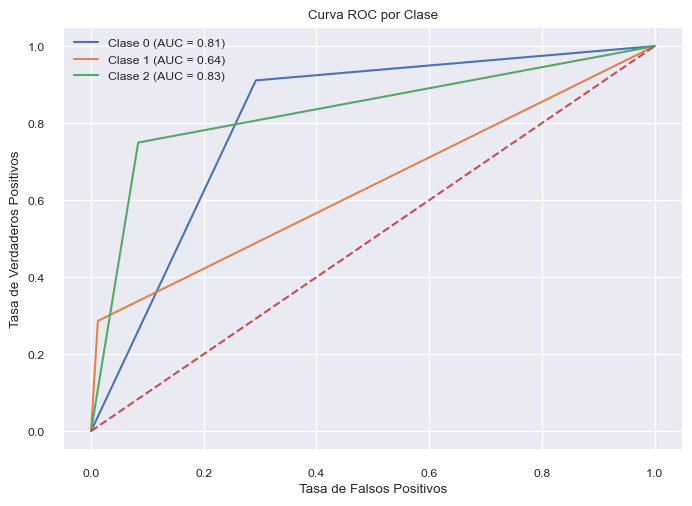

In [46]:
model_1_xgb = XGBClassifier().fit(X_train_1, y_train_1)
y_pred_xgb_1 = model_1_xgb.predict(X_test_1)
saca_metricas(y_test_1,y_pred_xgb_1)

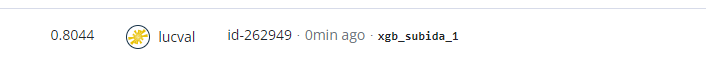

El segundo modelo más adecuado según pycaret. Vemos que baja ligeramente  de 0.8116 a 0.804 en nuestros datos de entrenamiento, aunque en el test de la plataforma obtenemos el mismo resultado que en el Random Forest. 

#### DecissionTreeClasiffier

Basado en árboles de decisión, este algoritmo divide repetidamente el conjunto de datos en subconjuntos más pequeños y homogéneos basándose en las características de entreada. 

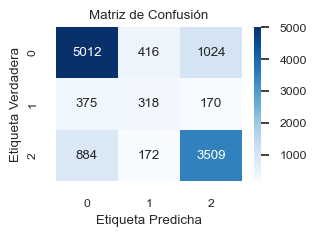

ACCURACY
Accuracy promedio: 
0.744023569023569
PRECISION
Precisión por cada clase: 
[0.79923457 0.35099338 0.7461195 ]
Precisión promedio del modelo: 
0.744023569023569
RECALL
Recall por cada clase: 
[0.77681339 0.36848204 0.7686747 ]
Recall promedio del modelo: 
0.744023569023569
F1
F1 por cada clase: 
[0.7878645  0.35952516 0.75722918]
F1 promedio del modelo: 
0.744023569023569


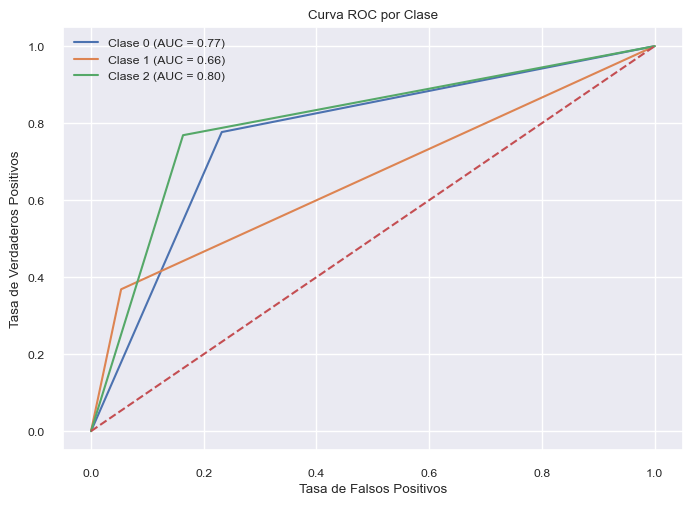

In [47]:
tree_mod_1 = DecisionTreeClassifier(criterion="gini").fit(X_train_1, y_train_1)
tree_pred_1 = tree_mod_1.predict(X_test_1)

saca_metricas(y_test_1,tree_pred_1)

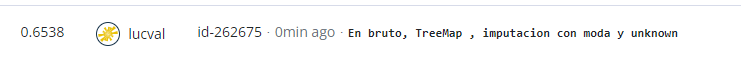

Algoritmo basado en árboles de decisión, clásico en la modelización, en pycaret está en la sexta posición, podemos observar como el rendimiento del modelo baja notablemente, tanto en las métricas generales de entrenamiento como en el testeo.

Por ello, descartaremos este algoritmo para futuras modelizaciones.

#### Exportamos los datos al formato para subirlo a la plataforma.

Tendremos que sometes a los datos de test a los mismos pasos que hemos sometido los datos de entrenamiento.

##### Imputamos los valores nulos:

Para ello empleamos la función generada anteriormente preprocesado.

In [48]:
df_test_1 =df_1.copy()

In [49]:
df_test_1 = preprocesado(df_test_1)

##### Modificamos los valores a numéricos

In [50]:
df_test_1 = numerico(df_test_1)

##### Relizamos la predicción

*Los datos obtenidos en la plataforma están en la parte superior, debajo de cada modelo*

In [51]:
random_predict_test_1 = model_1_random.predict(df_test_1)
random_predict_test_1

array([2, 0, 0, ..., 0, 0, 2])

In [52]:
xgb_predict_test_1 = model_1_random.predict(df_test_1)
xgb_predict_test_1

array([2, 0, 0, ..., 0, 0, 2])

In [53]:
tree_pred_test_1 = tree_mod_1.predict(df_test_1)
tree_pred_test_1

array([2, 0, 0, ..., 2, 0, 2])

##### Exportamos a CSV

In [54]:
df_envio = pd.concat([df_1['id'],pd.Series(random_predict_test_1)], axis = 1)
#Cambiamos el nombre de la columna a status_group
df_envio.columns.values[1] = "status_group"
# Reemplazar los valores en la primera columna usando iloc
df_envio.iloc[:, 1] = df_envio.iloc[:, 1].replace({0:'functional', 1:'functional needs repair', 2: 'non functional'})
df_envio.to_csv('subida_random_1',index=False)

In [55]:
df_envio = pd.concat([df_1['id'],pd.Series(xgb_predict_test_1)], axis = 1)
#Cambiamos el nombre de la columna a status_group
df_envio.columns.values[1] = "status_group"
# Reemplazar los valores en la primera columna usando iloc
df_envio.iloc[:, 1] = df_envio.iloc[:, 1].replace({0:'functional', 1:'functional needs repair', 2: 'non functional'})
df_envio.to_csv('subida_xgb_1',index=False)

In [56]:
df_envio = pd.concat([df_1['id'],pd.Series(tree_pred_test_1)], axis = 1)
#Cambiamos el nombre de la columna a status_group
df_envio.columns.values[1] = "status_group"
# Reemplazar los valores en la primera columna usando iloc
df_envio.iloc[:, 1] = df_envio.iloc[:, 1].replace({0:'functional', 1:'functional needs repair', 2: 'non functional'})
df_envio.to_csv('subida_012',index=False)

## Mejora del modelo: transformación y tramificación de variables

En este apartado analizaremos en detalle cada una de las variables, con el fin de poder evaluar mejorar su rendimiento y clasificarlas de cara a la mejora del rendimiento del modelo.

Nos intereserá ver qué cantidad de datos y clases tenemos, para ello vamos a hacer un value_counts genérico. 
Tenemos muchas variables con muchas categorías en ellas. Una de las características que estamos observando es que algunas ( funder, installer, wpt_name, subvillage, ward...) de ellas tienen varios valores como 1, lo que ya nos indica que nos podría interesar hacer una subclase de estos valores. 

In [57]:
for i in df.columns:
    print(i)
    print(df[i].value_counts())

status_group
status_group
functional                 32259
non functional             22824
functional needs repair     4317
Name: count, dtype: int64
amount_tsh
amount_tsh
0.0         41639
500.0        3102
50.0         2472
1000.0       1488
20.0         1463
            ...  
6300.0          1
120000.0        1
138000.0        1
350000.0        1
59.0            1
Name: count, Length: 98, dtype: int64
funder
funder
Government Of Tanzania    9084
unknown                   3637
Danida                    3114
Hesawa                    2202
Rwssp                     1374
                          ... 
Rarymond Ekura               1
Justine Marwa                1
Municipal Council            1
Afdp                         1
Samlo                        1
Name: count, Length: 1897, dtype: int64
gps_height
gps_height
 0       20438
-15         60
-16         55
-13         55
 1290       52
         ...  
 2378        1
-54          1
 2057        1
 2332        1
 2366        1
Name: cou

Vamos a seguir el criterio de Solegalli y agruparemos las categorías consideradas como raras. Para ello, hemos tenido en cuenta la siguiente bibliografía:
https://github.com/PacktPublishing/Python-Feature-Engineering-Cookbook-Second-Edition/blob/main/ch02-categorical-encoding/Recipe-08-Grouping-rare-categories.ipynb

Vamos a comenzar a analizar las variables vamos a establecer prioridades en las variables, para ello calcularemos la V de Cramer.

### V de Cramer
Definimos nuestra variable objetivo y la retiramos de nuestro dataset.

In [58]:
varObjCat = df_pycaret.status_group
imputdf = df_pycaret.drop(['status_group'],axis=1)
varObjCat.describe()

count    59400.000000
mean         0.841162
std          0.949794
min          0.000000
25%          0.000000
50%          0.000000
75%          2.000000
max          2.000000
Name: status_group, dtype: float64

In [59]:
imputdf['aleatorio'] = np.random.uniform(0,1,size=df.shape[0])
imputdf['aleatorio2'] = np.random.uniform(0,1,size=df.shape[0])

Con el objetivo de ver cómo se comportan nuestras variables vamos a generar dos variables aleatorias. Con ellos queremos comprobar posibles asociaciones espurias, es decir, es una forma de medir si hay variables que tienen una menor asociación con nuestra objetivo que una generada de forma aleatoria. 

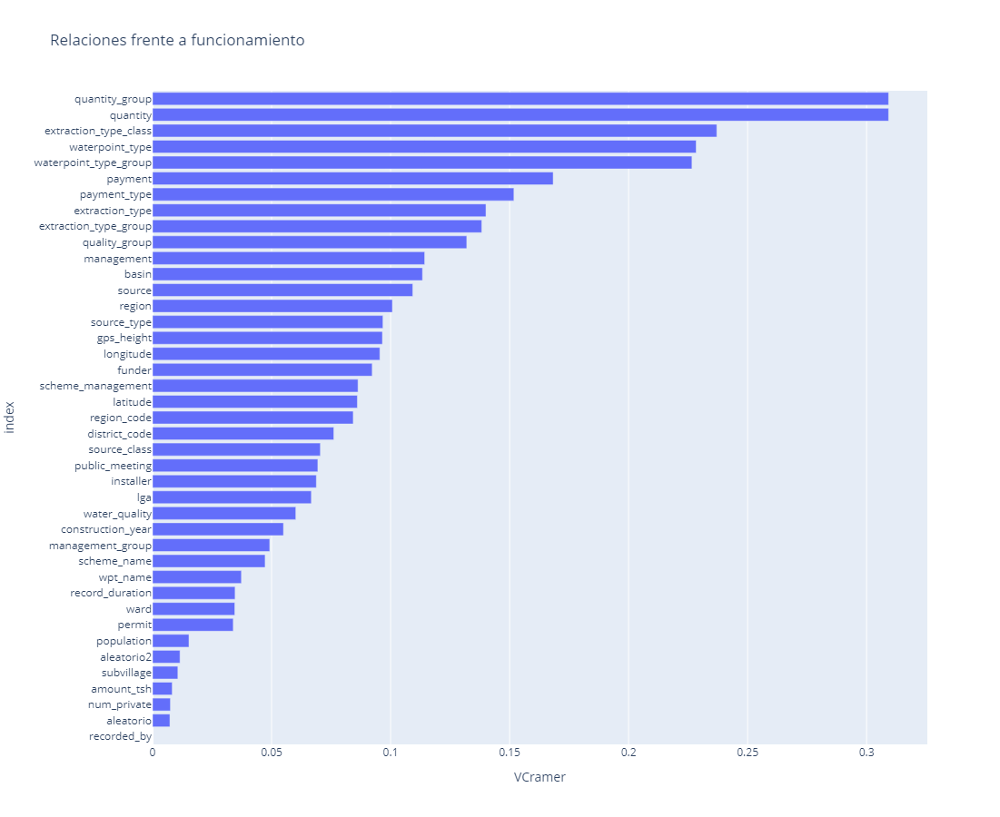

In [60]:
# Función para calcular VCramer
def cramers_v(var1, varObj):
    
    if not var1.dtypes.name == 'category':
        #bins = min(5,var1.value_counts().count())
        var1 = pd.cut(var1, bins = 5)
    if not varObj.dtypes == 'category': #np.issubdtype(varObj, np.number):
        #bins = min(5,varObj.value_counts().count())
        varObj = pd.cut(varObj, bins = 5)
        
    data = pd.crosstab(var1, varObj).values
    vCramer = stats.contingency.association(data, method = 'cramer')
    return vCramer


# Aplicar la función al input completo contra la objetivo
tablaCramer = pd.DataFrame(imputdf.apply(lambda x: cramers_v(x,varObjCat)),columns=['VCramer'])

# Obtener el gráfico de importancia de las variables frente a la objetivo continua según vcramer
import plotly.express as px
fig = px.bar(tablaCramer,x=tablaCramer.VCramer,title='Relaciones frente a funcionamiento').update_yaxes(categoryorder="total ascending")

# Ajustar el tamaño de la figura
fig.update_layout(
    width=1200,
    height=900,
)

# Mostrar el gráfico
fig.show()

De la V de Cramer podemos concluir que quantity_group y quantity, así como extraction_type_class, waterpoint_type y waterpoint_type_group son variables influyentes para nuestra objetivo. Del modo contrario, subvillage, amount_tsh, num_private y recorded_by tienen un menor grado de relación que las aleatorias previamente generadas, por lo que, son variables espurias y no influyentes para nuestra objetivo.

Con estas conclusiones tiene un elevado sentido que empleemos más esfuerzo en analizar las variables por orden de importancia a nuestra varible objetivo.

## Feature engineering

In [61]:
#Generamos una copia del dataset, será el que posteriormente modifiquemos y veamos las correlaciones..
df_mod_1 = df_pycaret.copy()

##### quantity + quantity_group

In [62]:
df_mod_1[['quantity_group','quantity']]

,quantity_group,quantity
id,,
69572,1,1
8776,2,2
34310,1,1
67743,0,0
19728,3,3
...,...,...
60739,1,1
27263,1,1
37057,1,1


In [63]:
print('Datos de quantity presentes en quantity_group\n', df_mod_1['quantity'].isin(df_mod_1['quantity_group']).value_counts())

Datos de quantity presentes en quantity_group
 quantity
True    59400
Name: count, dtype: int64


Según observamos, se trata exactamente de la misma columna duplicada. Vamos a eliminar una de ellas, en este caso quantity_group.

In [64]:
df_mod_1.drop('quantity_group',axis=1,inplace=True)

Con únicamente una de las columnas, vamos a evaluar la distribución de nuestra variable quantity:

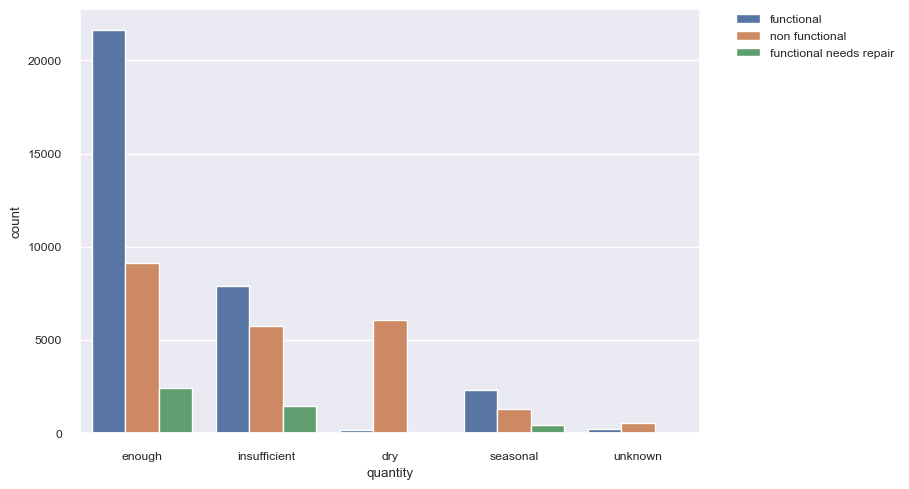

In [65]:
sns.countplot(data=df,x='quantity',hue='status_group')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

Parece que todas siguen la misma distribución, a excepción de dry y unknown (0 y 4 en codificación), vamos a agrupar en una única clase dry + unknown. Veremos la correlación antes y después.

quantity
1    55.868687
2    25.469697
0    10.515152
3     6.818182
4     1.328283
Name: proportion, dtype: float64


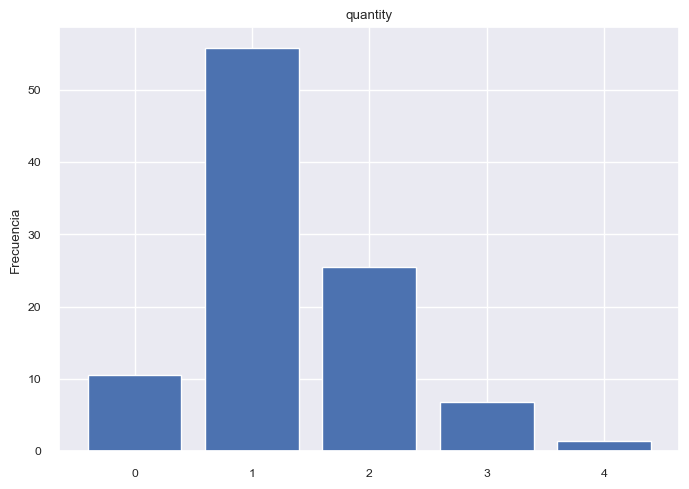

In [66]:
def vis_var(data,obj):
    perc_quantity = data[obj].value_counts(normalize=True) * 100
    perc_quantity = perc_quantity.sort_values(ascending=False)
    print(perc_quantity)
    plt.bar(perc_quantity.index, perc_quantity.values)
    plt.title(obj)
    plt.ylabel('Frecuencia')
    plt.show()

vis_var(df_mod_1,'quantity')

In [67]:
df_mod_1['quantity_new']=df_mod_1['quantity'].apply(lambda x: 1 if x==1 else (2 if x==2 else (3 if x==3 else 0)))
corr = abs(df_mod_1.corr())
print(corr[['status_group']].sort_values(by= 'status_group',ascending = False))

                       status_group
status_group               1.000000
waterpoint_type            0.206507
waterpoint_type_group      0.206431
quantity_new               0.184209
extraction_type_class      0.175338
quality_group              0.153163
quantity                   0.131425
gps_height                 0.114029
extraction_type_group      0.111497
region_code                0.108640
extraction_type            0.107827
source                     0.097617
region                     0.091252
source_type                0.079656
payment                    0.076992
public_meeting             0.067965
district_code              0.065687
lga                        0.065302
management                 0.060587
funder                     0.056960
payment_type               0.055772
amount_tsh                 0.053702
scheme_name                0.044843
basin                      0.043413
construction_year          0.043342
installer                  0.037621
permit                     0

Hemos mejorado la correlación de quantity de 0.13 a 0.18 en relación a nuestra variable status_group.

##### waterpoint_type + waterpoint_type_class

In [68]:
df[['waterpoint_type','waterpoint_type_group']]

,waterpoint_type,waterpoint_type_group
id,,
69572,communal standpipe,communal standpipe
8776,communal standpipe,communal standpipe
34310,communal standpipe multiple,communal standpipe
67743,communal standpipe multiple,communal standpipe
19728,communal standpipe,communal standpipe
...,...,...
60739,communal standpipe,communal standpipe
27263,communal standpipe,communal standpipe
37057,hand pump,hand pump


In [69]:
print('Datos de quantity presentes en quantity_group\n', df_mod_1['waterpoint_type'].isin(df_mod_1['waterpoint_type_group']).value_counts())

Datos de quantity presentes en quantity_group
 waterpoint_type
True     53020
False     6380
Name: count, dtype: int64


In [70]:
new_class = df['waterpoint_type']!=df['waterpoint_type_group']
df_filtrado = df[new_class]
print(df_filtrado['waterpoint_type'].value_counts())
print(df_filtrado['waterpoint_type_group'].value_counts())

waterpoint_type
communal standpipe multiple    6103
Name: count, dtype: int64
waterpoint_type_group
communal standpipe    6103
Name: count, dtype: int64


Las variables waterpoint_type y waterpoint_type_group tienen muchos valores en común, a excepción de lod 6103 valores como múltiple, que nos aporta algo de información. Vamos a aplicar en waterpoint_type la tramificación.

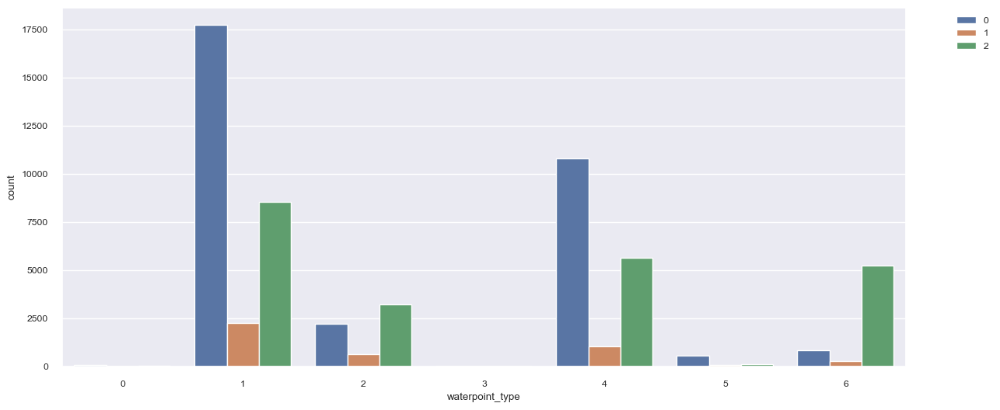

In [71]:
plt.figure(figsize=(14,6))
sns.countplot(data=df_mod_1,x='waterpoint_type',hue='status_group')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

Vamos a juntar las categorías 0 + 3 + 5 en una única sola, añadiéndola a la clasificación 4.

waterpoint_type
1    48.016835
4    29.441077
6    10.740741
2    10.274411
5     1.319865
0     0.195286
3     0.011785
Name: proportion, dtype: float64


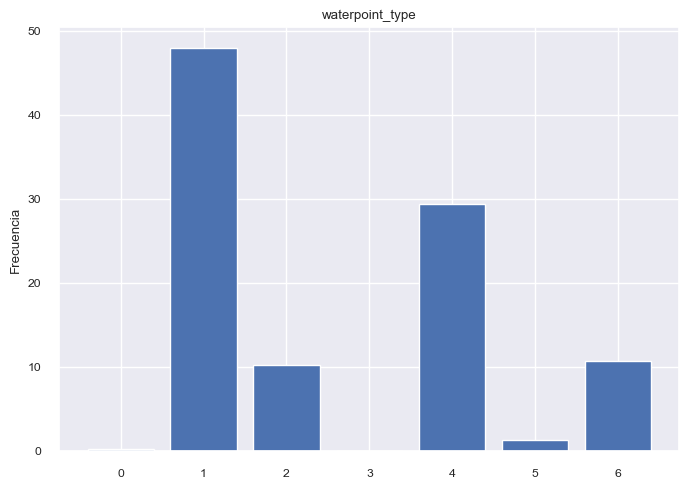

In [72]:
vis_var(df_mod_1,'waterpoint_type')

In [73]:
df_mod_1['waterpoint_type_new']=df_mod_1['waterpoint_type'].apply(lambda x: 1 if x==1 else (2 if x==2 else (6 if x==6 else 4)))
corr = abs(df_mod_1.corr())
corr[['status_group']].sort_values(by= 'status_group',ascending = False).head(10)

,status_group
status_group,1.000000
waterpoint_type_new,0.210044
waterpoint_type,0.206507
waterpoint_type_group,0.206431
quantity_new,0.184209
extraction_type_class,0.175338
quality_group,0.153163
quantity,0.131425
gps_height,0.114029
extraction_type_group,0.111497


Con esta modificación mejoramos ligeramente la correlación de la variable waterpoint_type en 0.005.

##### extraction_type

extraction_type
3     45.084175
8     13.727273
9     10.824916
14     8.020202
15     6.178451
7      4.823232
4      4.040404
0      2.979798
6      2.382155
12     0.759259
13     0.385522
17     0.196970
5      0.164983
1      0.151515
11     0.143098
16     0.080808
2      0.053872
10     0.003367
Name: proportion, dtype: float64


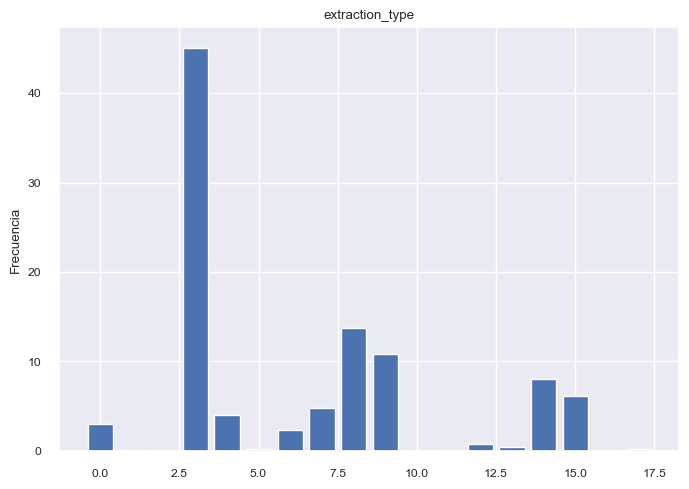

In [74]:
vis_var(df_mod_1,'extraction_type')

Tenemos una gran cantidad de clases, con valores bajos en relación al % total, vamos a agrupar las clases minoritarias en una. 

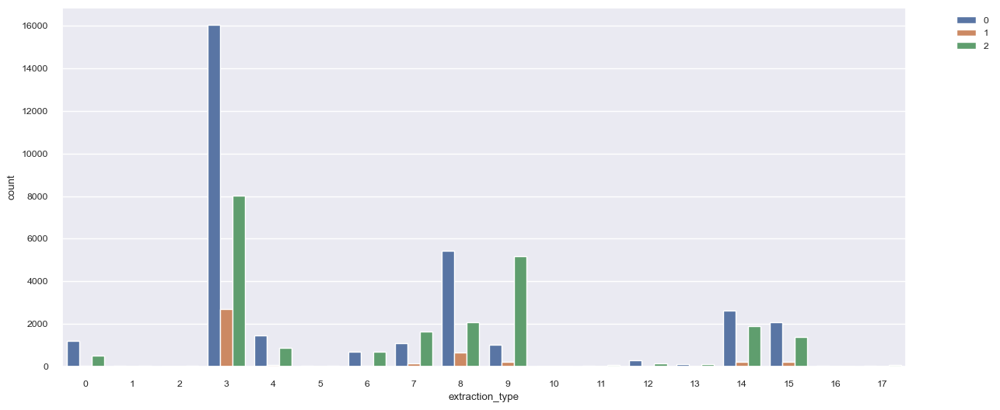

In [75]:
plt.figure(figsize=(14,6))
sns.countplot(data=df_mod_1,x='extraction_type',hue='status_group')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

Todos aquellas variables que no tengan una representatividad igual o superior al 4 % la vamos a agrupar en una única variable.

https://github.com/PacktPublishing/Python-Feature-Engineering-Cookbook-Second-Edition/blob/main/ch02-categorical-encoding/Recipe-08-Grouping-rare-categories.ipynb

In [76]:
freqs = df_mod_1['extraction_type'].value_counts(normalize=True)

frequent_ext = [x for x in freqs.loc[freqs >= 0.04].index.values]

In [77]:
[x for x in df_mod_1['extraction_type'].unique() if x not in frequent_ext]
df_mod_1['extraction_type_new'] = np.where(df_mod_1['extraction_type'].isin(frequent_ext), df_mod_1['extraction_type'],20)

In [78]:
corr = abs(df_mod_1.corr())
corr[['status_group']].sort_values(by= 'status_group',ascending = False).head(25)

,status_group
status_group,1.000000
waterpoint_type_new,0.210044
waterpoint_type,0.206507
waterpoint_type_group,0.206431
quantity_new,0.184209
extraction_type_class,0.175338
quality_group,0.153163
quantity,0.131425
gps_height,0.114029
extraction_type_group,0.111497


Esta última modificación no nos aporta demasiado en términos de autocorrelación, ya que la variable extraction_type tiene una correlación de 0.11 y la columna generada 0.07.

##### Extraction_type_class

extraction_type_class
0    45.084175
1    27.703704
3    10.824916
5    10.402357
2     5.028620
4     0.759259
6     0.196970
Name: proportion, dtype: float64


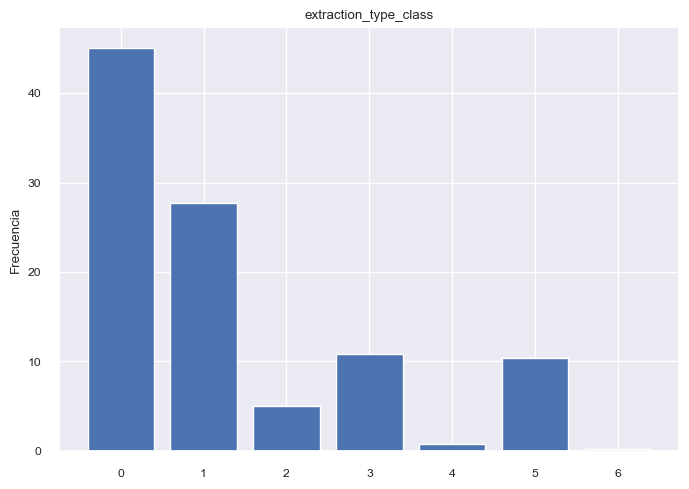

In [79]:
vis_var(df_mod_1,'extraction_type_class')

Agrupamos las clases 2,4,5 y 6 en una única clase.

In [80]:
df_mod_1['extraction_type_class_new']=df_mod_1['extraction_type_class'].apply(lambda x: 0 if x==0 else (1 if x==1 else (3 if x ==3 else 4)))
corr = abs(df_mod_1.corr())
corr[['status_group']].sort_values(by= 'status_group',ascending = False).head(10)

,status_group
status_group,1.000000
waterpoint_type_new,0.210044
extraction_type_class_new,0.209448
waterpoint_type,0.206507
waterpoint_type_group,0.206431
quantity_new,0.184209
extraction_type_class,0.175338
quality_group,0.153163
quantity,0.131425
gps_height,0.114029


##### waterpoint_type_group

waterpoint_type_group
1    58.291246
3    29.441077
5    10.740741
4     1.319865
0     0.195286
2     0.011785
Name: proportion, dtype: float64


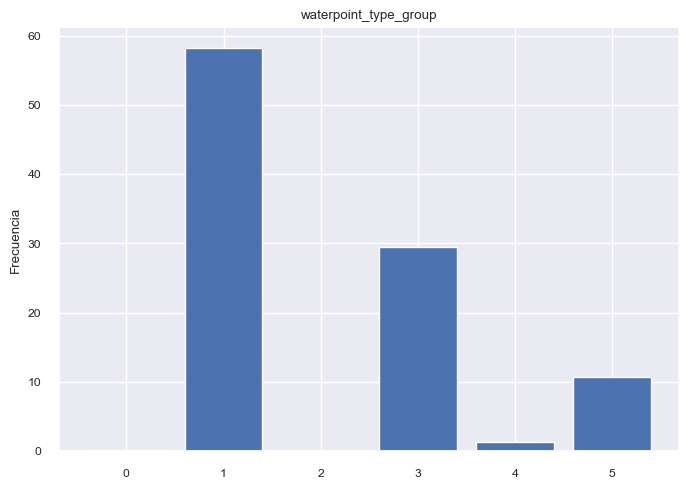

In [81]:
vis_var(df_mod_1,'waterpoint_type_group')

Agrupamos las clases 0,2,4 y 5 en una única clase.

In [82]:
df_mod_1['waterpoint_type_group_new']=df_mod_1['waterpoint_type_group'].apply(lambda x: 1 if x==1 else (3 if x==3 else 5))
corr = abs(df_mod_1.corr())
corr[['status_group']].sort_values(by= 'status_group',ascending = False).head(12)

,status_group
status_group,1.000000
waterpoint_type_new,0.210044
extraction_type_class_new,0.209448
waterpoint_type,0.206507
waterpoint_type_group,0.206431
waterpoint_type_group_new,0.196340
quantity_new,0.184209
extraction_type_class,0.175338
quality_group,0.153163
quantity,0.131425


Esta última tramificación no aporta en términos de correlación, la nueva variable generada tiene menos correlación que la de origen con un 0.01.

##### payment

payment
0    42.673401
4    15.126263
3    13.973064
6    13.732323
5     6.589226
2     6.131313
1     1.774411
Name: proportion, dtype: float64


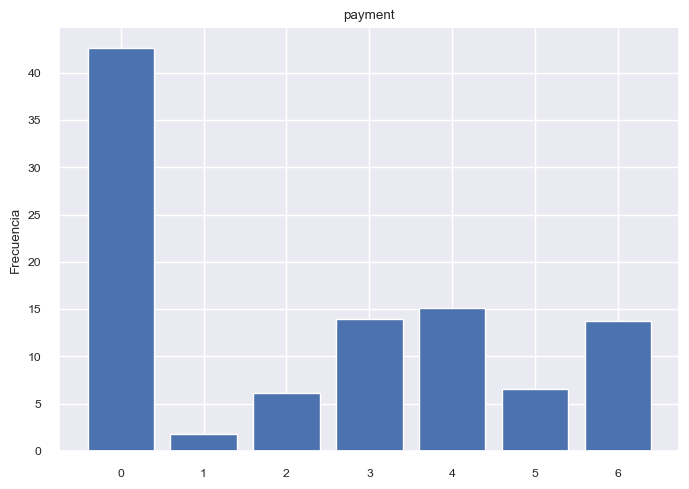

In [83]:
vis_var(df_mod_1,'payment')

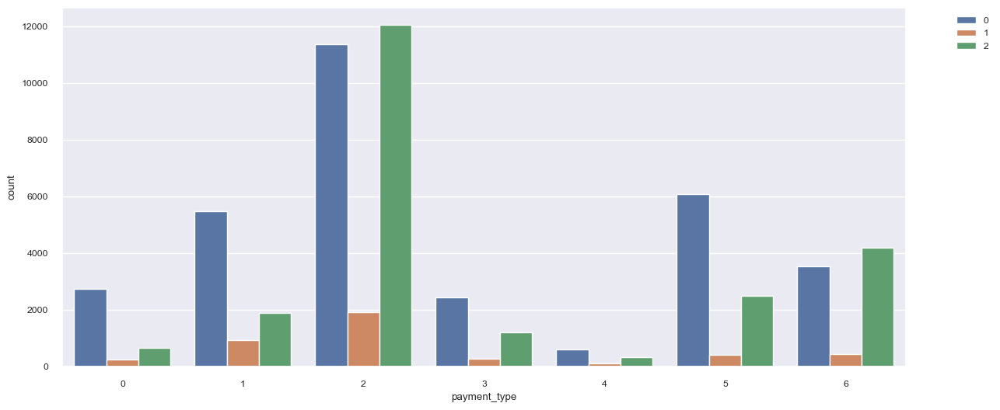

In [84]:
plt.figure(figsize=(14,6))
sns.countplot(data=df_mod_1,x='payment_type',hue='status_group')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

In [85]:
df_mod_1['payment_new']=df_mod_1['payment'].apply(lambda x: 0 if x==0 else (4 if x==4 else (3 if x ==3 else 6)))
corr = abs(df_mod_1.corr())
corr[['status_group']].sort_values(by= 'status_group',ascending = False).head(20)

,status_group
status_group,1.000000
waterpoint_type_new,0.210044
extraction_type_class_new,0.209448
waterpoint_type,0.206507
waterpoint_type_group,0.206431
waterpoint_type_group_new,0.196340
quantity_new,0.184209
extraction_type_class,0.175338
quality_group,0.153163
quantity,0.131425


payment_new es 0.04 superior en correlación a su variable de origen.

##### recorded_by

Esta variable nos ha llamado especialmente la atención, porque hemos visto que no tiene ningún tipo de relación con nuestra variable objetivo status. Veremos qué compone esta variable.

In [86]:
df['recorded_by'].value_counts()

recorded_by
GeoData Consultants Ltd    59400
Name: count, dtype: int64

Únicamente tenemos un tipo de variable, por lo que, si lo perdemos no perderemos ninguna información, así que vamos a borrar esta variable.

In [87]:
df_mod_1.drop('recorded_by',axis = 1, inplace = True)

Generamos la función que, posteriormente, aplicaremos en nuestros datos de testeo.

In [88]:
#Definimos la función que emplearemos posteriormente en el el DataFrame de test.
def feature_engineering(data):
    data.drop('quantity_group',axis=1,inplace=True)
    data['quantity_new']=data['quantity'].apply(lambda x: 1 if x==1 else (2 if x==2 else (3 if x==3 else 0)))
    data['waterpoint_type_new']=data['waterpoint_type'].apply(lambda x: 1 if x==1 else (2 if x==2 else (6 if x==6 else 4)))
    data['extraction_type_new'] = np.where(data['extraction_type'].isin(frequent_ext), data['extraction_type'],20)
    data['extraction_type_class_new']=data['extraction_type_class'].apply(lambda x: 0 if x==0 else (1 if x==1 else (3 if x ==3 else 4)))
    data['waterpoint_type_group_new']=data['waterpoint_type_group'].apply(lambda x: 1 if x==1 else (3 if x==3 else 5))
    data['payment_new']=data['payment'].apply(lambda x: 0 if x==0 else (4 if x==4 else (3 if x ==3 else 6)))
    data.drop('recorded_by',axis = 1, inplace = True)
    return data

## Veamos cómo impacta en nuestro modelado estas modificaciones realizadas.

In [89]:
X_train_2,X_test_2,y_train_2,y_test_2 = particion_datos(df_mod_1,'status_group',0.2,None)

#### RandomForest

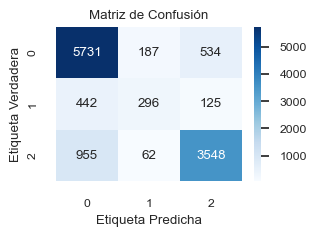

ACCURACY
Accuracy promedio: 
0.805976430976431
PRECISION
Precisión por cada clase: 
[0.80401235 0.54311927 0.84335631]
Precisión promedio del modelo: 
0.805976430976431
RECALL
Recall por cada clase: 
[0.8882517  0.34298957 0.77721796]
Recall promedio del modelo: 
0.805976430976431
F1
F1 por cada clase: 
[0.84403535 0.42045455 0.80893753]
F1 promedio del modelo: 
0.805976430976431


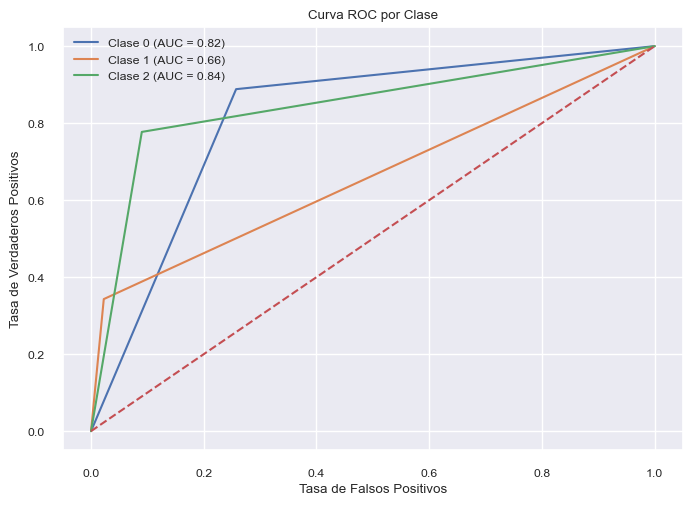

In [90]:
model_2_random = RandomForestClassifier()
model_2_random.fit(X_train_2,y_train_2)
random_predict_2 = model_2_random.predict(X_test_2)

saca_metricas(y_test_2, random_predict_2)

Las métricas han bajado ligeramente, vamos a probar a subirlo a la plataforma, para ver si las métricas dentro del testeo mejoran.

In [91]:
df_test_2 = df_1.copy()
df_test_2 = preprocesado(df_test_2)
df_test_2 = numerico(df_test_2)
df_test_2 = feature_engineering(df_test_2)
random_predict_test_2 = model_2_random.predict(df_test_2)
df_envio = pd.concat([df_1['id'],pd.Series(random_predict_test_2)], axis = 1)
#Cambiamos el nombre de la columna a status_group
df_envio.columns.values[1] = "status_group"
# Reemplazar los valores en la primera columna usando iloc
df_envio.iloc[:, 1] = df_envio.iloc[:, 1].replace({0:'functional', 1:'functional needs repair', 2: 'non functional'})
df_envio.to_csv('subida_random_2',index=False)

En los datos de test ha surtido efecto, hemos ascendido en 0.04.
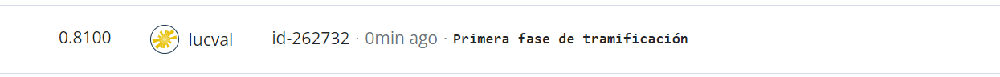

#### Hiperparámetros

Con el fin de poder mejorar nuestro modelo vamos a evaluar los diferentes hiperparámetros que podamos tener, principalmente estimos interesados en saber cuántos árboles deseamos (n_estimators) y el grado de profundidad de nuestro árbol.

Para ello, vamos a usar la librería GridSearchCV.

In [92]:
grid_param = {
    'n_estimators': [10, 50, 100, 120],
    'max_depth': [8, 12, 16, 22]
}

In [93]:
model_grid = GridSearchCV(estimator=model_2_random,
                     param_grid=grid_param,
                     scoring='f1_micro',
                     cv=5,
                     n_jobs=-1)

In [94]:
# Convertimos a DataFrame
y_train_2 = y_train_2.to_frame()

# Reenombramos la columna
y_train_2.columns = ["status_group"]

model_grid.fit(X_train_2, y_train_2['status_group'])

GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='sqrt',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              monotonic_cst=None,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                                              warm_start=False),
             n_jobs=-1,
             param_grid={'max_depth': [8, 12, 16, 22],
                         'n_estimators': [10, 50, 100, 120]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='f1_micro', verbose=0)

In [95]:
print(model_grid.best_params_)
print(model_grid.best_score_)

{'max_depth': 22, 'n_estimators': 120}
0.8100378787878789


Los hiperparámetros más adecuados para nuestro modelos son una profundidad de 22 y 120 estimadores modelo. Lo aplicamos y vemos si mejora nuestro modelo.

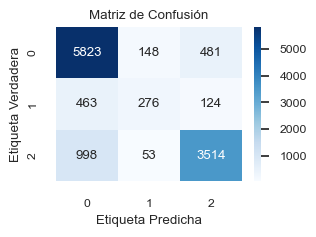

ACCURACY
Accuracy promedio: 
0.8091750841750842
PRECISION
Precisión por cada clase: 
[0.79942339 0.57861635 0.85311969]
Precisión promedio del modelo: 
0.8091750841750842
RECALL
Recall por cada clase: 
[0.90251085 0.3198146  0.76976999]
Recall promedio del modelo: 
0.8091750841750842
F1
F1 por cada clase: 
[0.84784508 0.4119403  0.80930447]
F1 promedio del modelo: 
0.8091750841750842


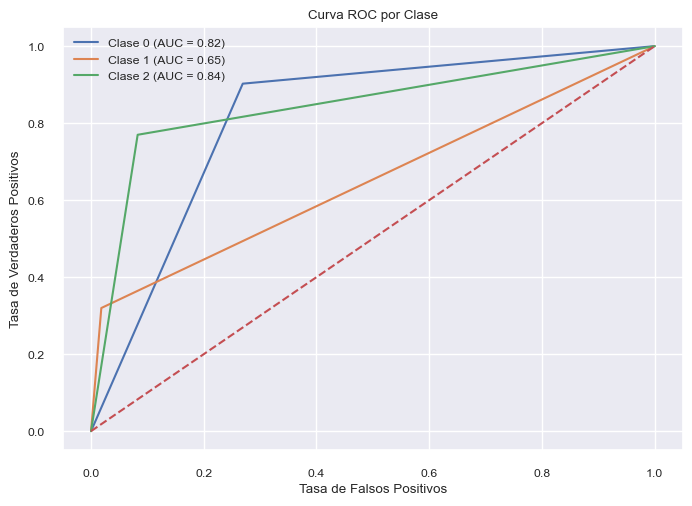

In [96]:
model_3_random = RandomForestClassifier(max_depth=22, n_estimators=120)
model_3_random.fit(X_train_2,y_train_2)
random_predict_3 = model_3_random.predict(X_test_2)

saca_metricas(y_test_2, random_predict_3)

Sube en 0.03 nuestro modelo, probaremos a subirlo a la plataforma.

In [97]:
random_predict_test_3 = model_3_random.predict(df_test_2)
df_envio = pd.concat([df_1['id'],pd.Series(random_predict_test_3)], axis = 1)
#Cambiamos el nombre de la columna a status_group
df_envio.columns.values[1] = "status_group"
# Reemplazar los valores en la primera columna usando iloc
df_envio.iloc[:, 1] = df_envio.iloc[:, 1].replace({0:'functional', 1:'functional needs repair', 2: 'non functional'})
df_envio.to_csv('subida_3_random',index=False)

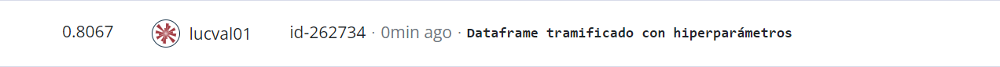

### Modelos ensemble

Los modelos ensemble combinan diferentes modelos individuales para mejorar el rendimiento general. xgboost busca minimizar el error y voting establece como resultado la predicción más votada entre los modelos que le indiquemos.

#### xgboost

Con estas transformadas, vamos a probar qué resultado nos da con el segundo modelo que, según pycaret, nos daba mejor resultado, en este caso xgboost	Extreme Gradient Boosting.

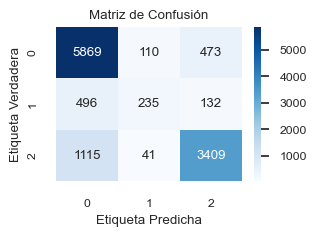

ACCURACY
Accuracy promedio: 
0.8007575757575758
PRECISION
Precisión por cada clase: 
[0.78462567 0.60880829 0.84927753]
Precisión promedio del modelo: 
0.8007575757575758
RECALL
Recall por cada clase: 
[0.90964042 0.27230591 0.74676889]
Recall promedio del modelo: 
0.8007575757575758
F1
F1 por cada clase: 
[0.84252082 0.37630104 0.79473132]
F1 promedio del modelo: 
0.8007575757575758


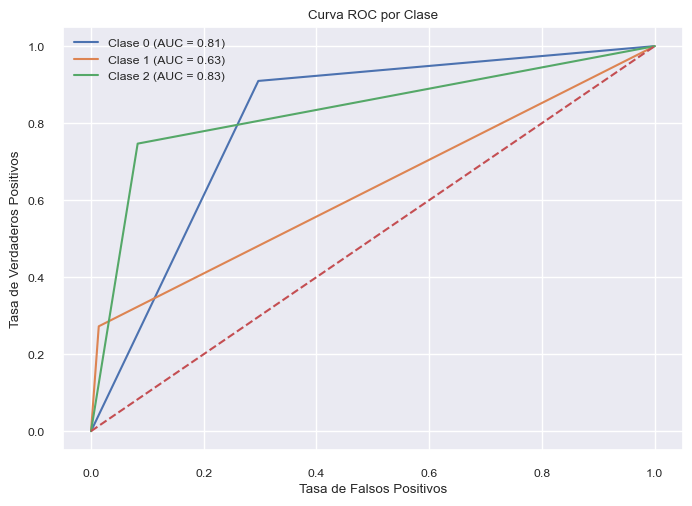

In [98]:
model4 = XGBClassifier().fit(X_train_2, y_train_2)
y_pred = model4.predict(X_test_2)
saca_metricas(y_test_2, y_pred)

Como podíamos haber intuido con pycaret, siendo xgboost el segundo modelo con mejores scores, ha bajado el accuraccy del modelo general.
Vamos a subirlo a la plataforma, para ver qué resultados nos da.

In [99]:
predict_test_4 = model4.predict(df_test_2)
df_envio = pd.concat([df_1['id'],pd.Series(predict_test_4)], axis = 1)
#Cambiamos el nombre de la columna a status_group
df_envio.columns.values[1] = "status_group"
# Reemplazar los valores en la primera columna usando iloc
df_envio.iloc[:, 1] = df_envio.iloc[:, 1].replace({0:'functional', 1:'functional needs repair', 2: 'non functional'})
df_envio.to_csv('subida_2_xgb',index=False)

Baja en 0.04 la puntuación, no nos ha dado peor resultado que RandomForest.
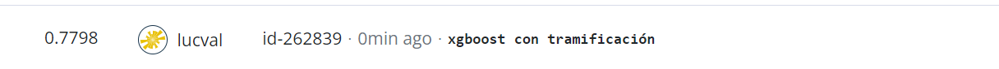

#### voting

Este tipo de modelos ensemble es empleado para mejorar el rendimiento predicitvo. Cada modelo realiza su predicción, y la predicción más votada es la predicción final.

Tomaremos los tres modelos con mejores resultados mostrados en pycaret vomo referencia.

In [100]:
#Definimos los clasificadores
clf1 = ExtraTreesClassifier(n_estimators=250, random_state=42)
clf2 = RandomForestClassifier(n_estimators=250, random_state=42)
clf3 = XGBClassifier()

voting_clf = VotingClassifier(
    estimators=[('lr', clf1), ('rf', clf2), ('dt', clf3)],
    voting='soft'  # Voto suave (voto ponderado por las probabilidades de clase)
)

voting_clf.fit(X_train_2, y_train_2)

# Evaluamos el rendimiento
y_pred_2 = voting_clf.predict(X_test_2)

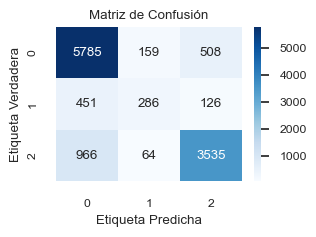

ACCURACY
Accuracy promedio: 
0.8085858585858586
PRECISION
Precisión por cada clase: 
[0.8032491  0.56188605 0.84792516]
Precisión promedio del modelo: 
0.8085858585858586
RECALL
Recall por cada clase: 
[0.8966212  0.33140209 0.77437021]
Recall promedio del modelo: 
0.8085858585858586
F1
F1 por cada clase: 
[0.84737073 0.41690962 0.80948019]
F1 promedio del modelo: 
0.8085858585858586


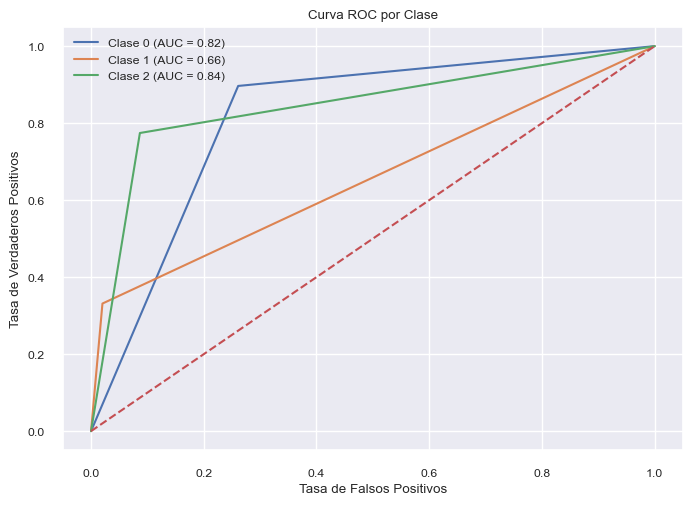

In [101]:
saca_metricas(y_test_2,y_pred_2)

Métricas similares a las obtenidas con RandomForerst y superiores a las obtenidas con xgboost. Vamos a probar a subir el modelo a la plataforma.

In [102]:
predict_test_5 = voting_clf.predict(df_test_2)
df_envio = pd.concat([df_1['id'],pd.Series(predict_test_5)], axis = 1)
#Cambiamos el nombre de la columna a status_group
df_envio.columns.values[1] = "status_group"
# Reemplazar los valores en la primera columna usando iloc
df_envio.iloc[:, 1] = df_envio.iloc[:, 1].replace({0:'functional', 1:'functional needs repair', 2: 'non functional'})
df_envio.to_csv('subida_1_voting',index=False)

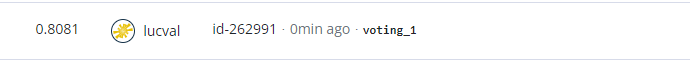

Resultado inferior en 0.02 al obtenido con RandomForest simplemente. Para poder avanzar con el modelo, vamos a probar a tramificar y transformar más variables y continuar con el Feature_Engineering.

## Feature_engineering 2

Continuamos con la tramificación, para ello vamos a ver cuáles son las variables de mayor importancia en nuestro modelo RandomForest, que es en el que mejor resultado hemos obtenido previamente.

In [103]:
feature_importance = model_2_random.feature_importances_

Importancia de las características:
1. longitude: 0.08092258112127892
2. latitude: 0.07695180585519454
3. quantity_new: 0.07172776854349713
4. quantity: 0.05941597852171753
5. wpt_name: 0.05765881478517484
6. subvillage: 0.05310878380440273
7. record_duration: 0.044575227476164415
8. gps_height: 0.043435712729503466
9. construction_year: 0.03608982723004023
10. ward: 0.03468302765438637
11. population: 0.030897872446775308
12. funder: 0.030891386136522637
13. installer: 0.025024061330021167
14. waterpoint_type_new: 0.024892953695807567
15. waterpoint_type: 0.022145412575410008
16. lga: 0.021338413910792213
17. scheme_name: 0.020905174407305747
18. amount_tsh: 0.017185941222763918
19. waterpoint_type_group: 0.01615679849369922
20. district_code: 0.014648282920435692
21. extraction_type_class_new: 0.01455065937401012
22. region: 0.013963491238682665
23. region_code: 0.013152220491981113
24. payment: 0.013150746024876417
25. waterpoint_type_group_new: 0.012376082178623241
26. management: 

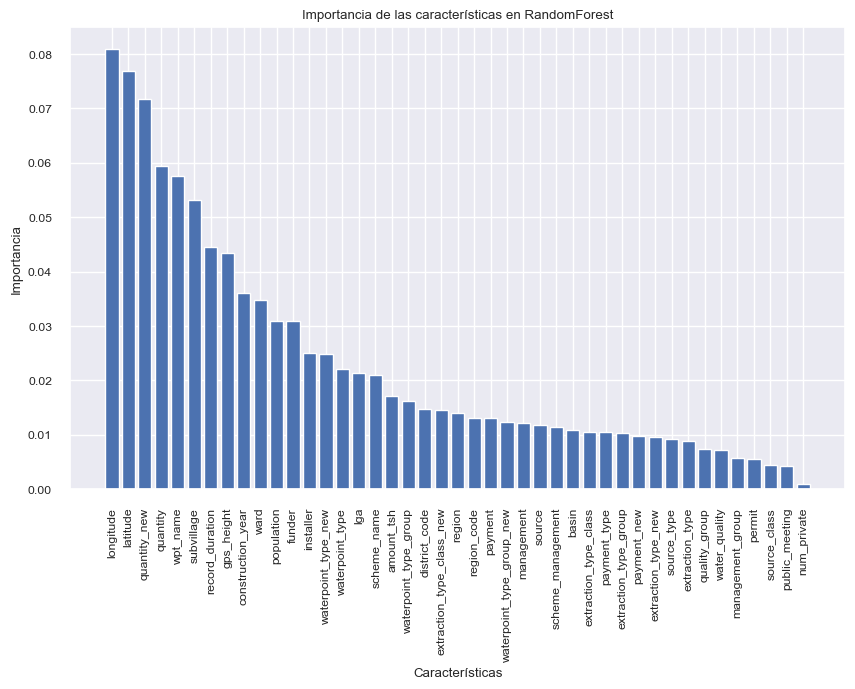

In [104]:
sorted_indices = feature_importance.argsort()[::-1]

# Imprime la importancia de las características
print("Importancia de las características:")
for i, idx in enumerate(sorted_indices):
    print(f"{i+1}. {X_train_2.columns[idx]}: {feature_importance[idx]}")

# Grafica la importancia de las características
plt.figure(figsize=(10, 6))
plt.bar(range(X_train_2.shape[1]), feature_importance[sorted_indices], align="center")
plt.xticks(range(X_train_2.shape[1]), X_train_2.columns[sorted_indices], rotation=90)
plt.xlabel("Características")
plt.ylabel("Importancia")
plt.title("Importancia de las características en RandomForest")
plt.show()

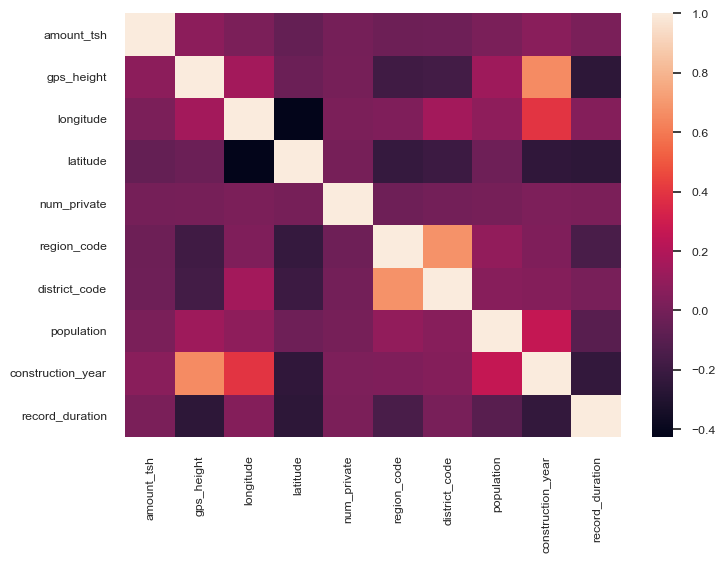

In [105]:
lista_num = list(df.select_dtypes(include =np.number))
df_correlacion = df[lista_num]
correlation_mat = df_correlacion.corr()
sns.heatmap(correlation_mat)
plt.show()


Es interesante observar como longitude, que es una variable importante para nuestro modelo, correlaciona con construction_year o district_code. Por otro lado district_code y region_code correlacionan , lo cual tiene bastante sentido.

Merece la pena evaluar las variables numéricas, por ello haremos un análisis general de las mismas y tramificaremos.

In [106]:
#Genereamos una copia de nuestro último dataset con transformaciones 
df_mod_2 = df_mod_1.copy()

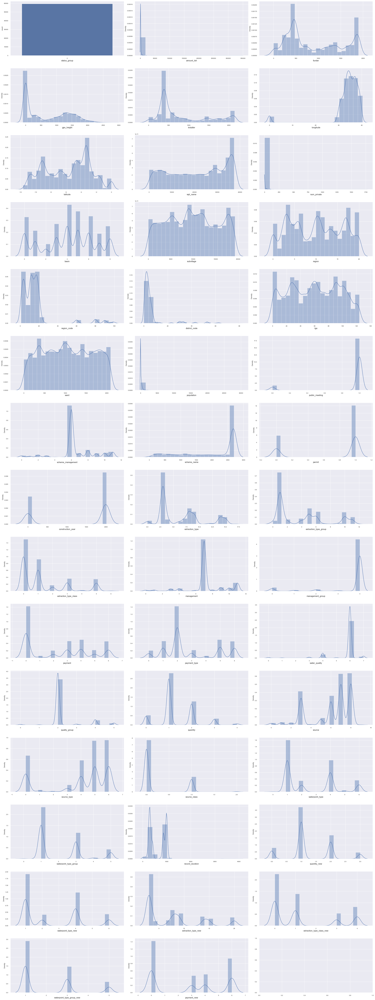

In [107]:
#Variables numéricas
lista_num = list(df_mod_2.select_dtypes(include =np.number))
fig, axs = plt.subplots(ncols=3, nrows=15, figsize=(30, 80))
axs = axs.flatten() # 

index = 0
for k,v in df_mod_2[lista_num].items(): 
    if  (k == 'status_group'):
        sns.countplot(v, ax=axs[index])
    else:
        sns.distplot(v, bins=20, ax=axs[index])
    axs[index].set_xlabel(k, fontsize=12) 
    index += 1

plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=3.0)

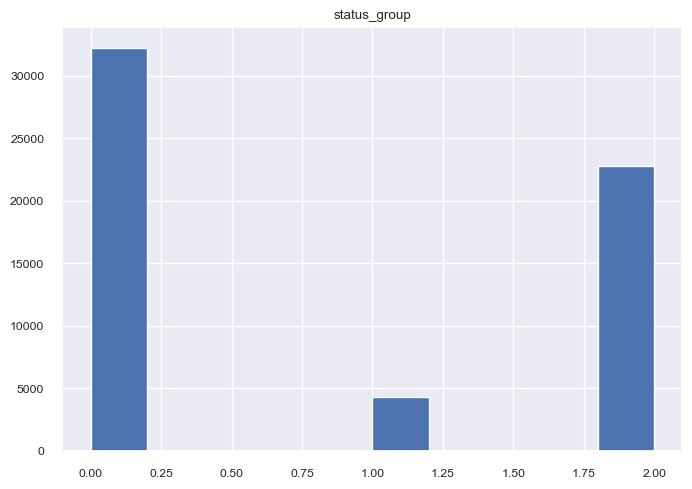

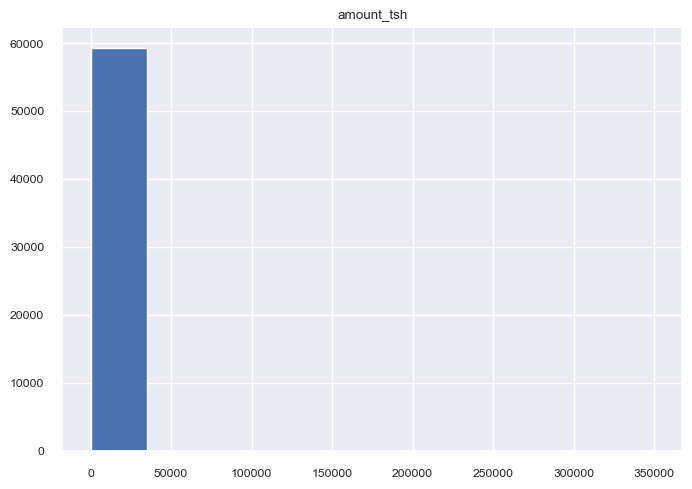

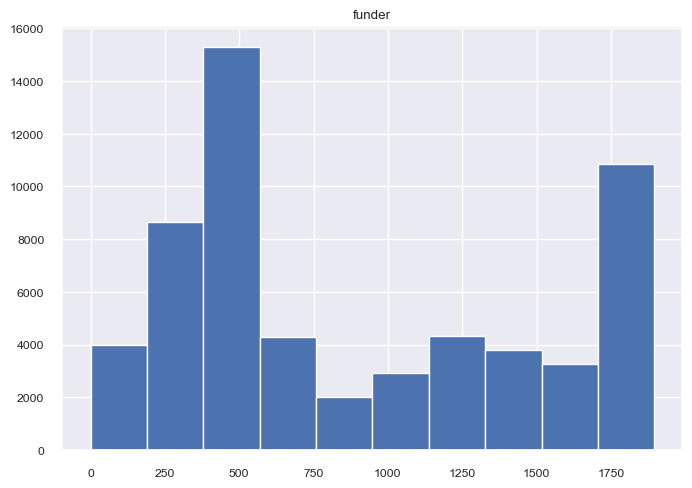

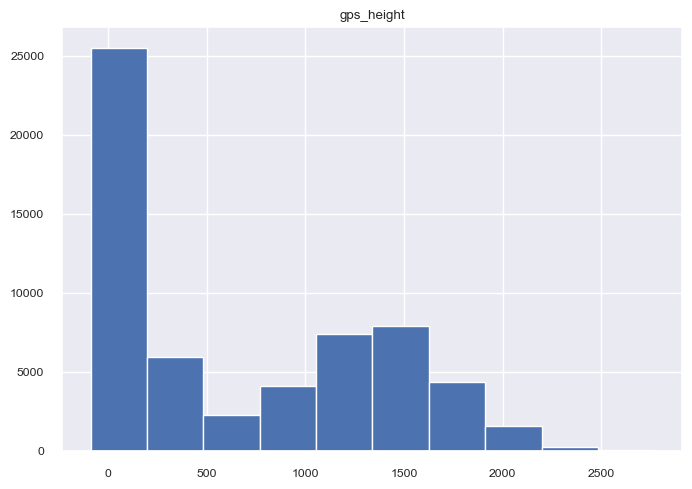

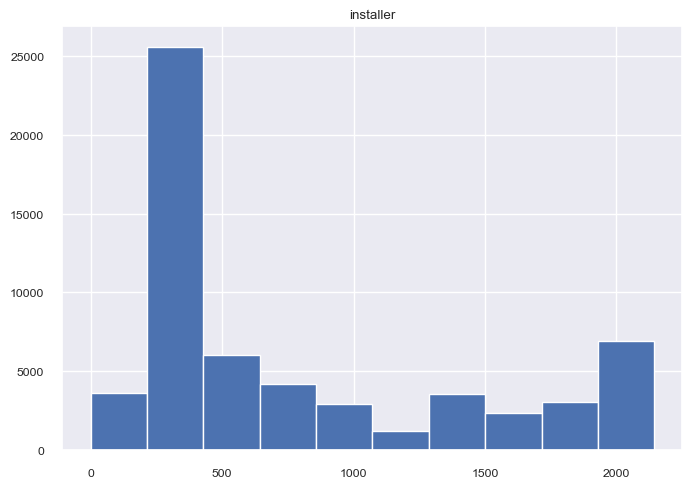

...

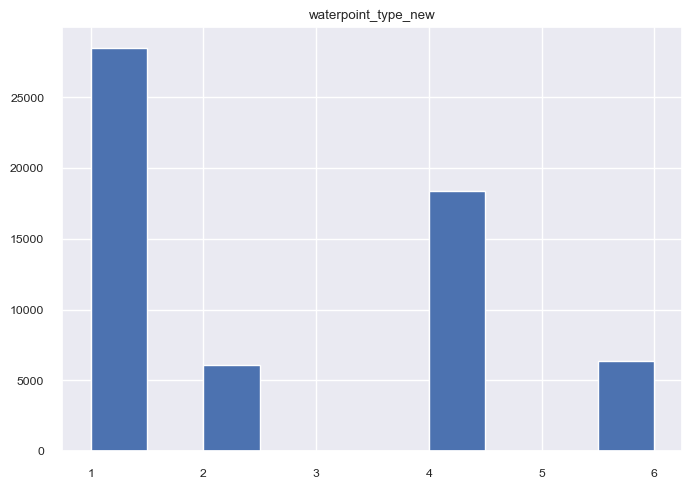

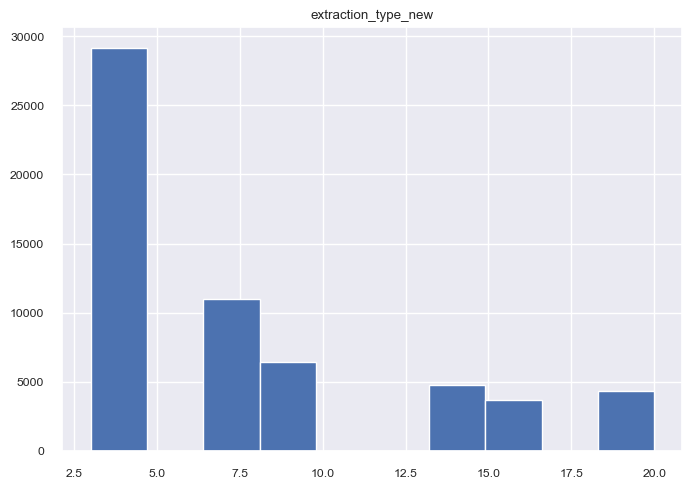

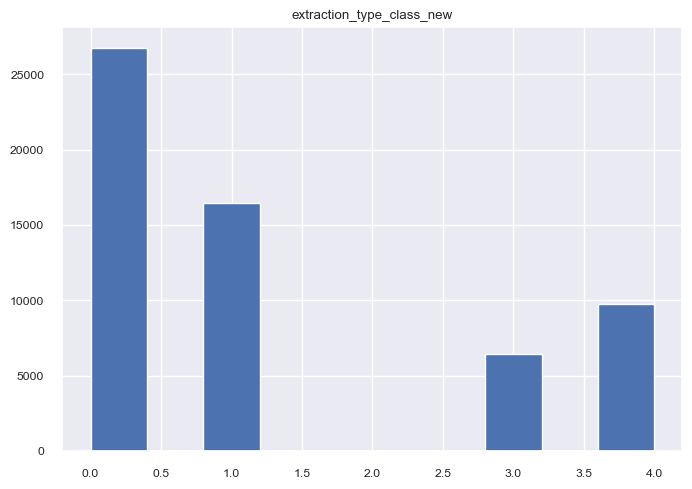

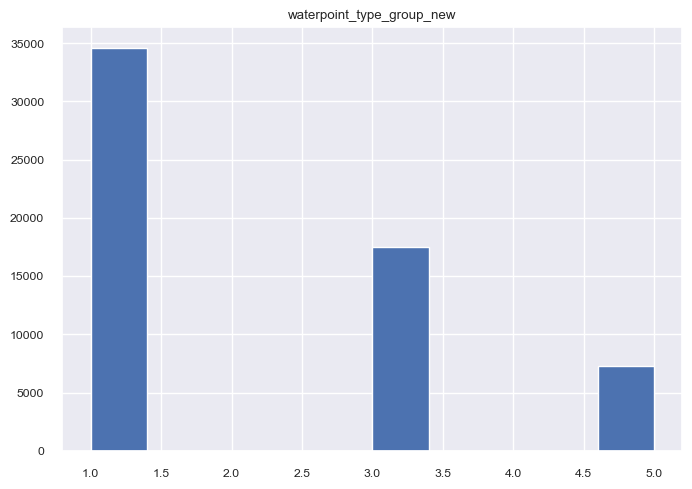

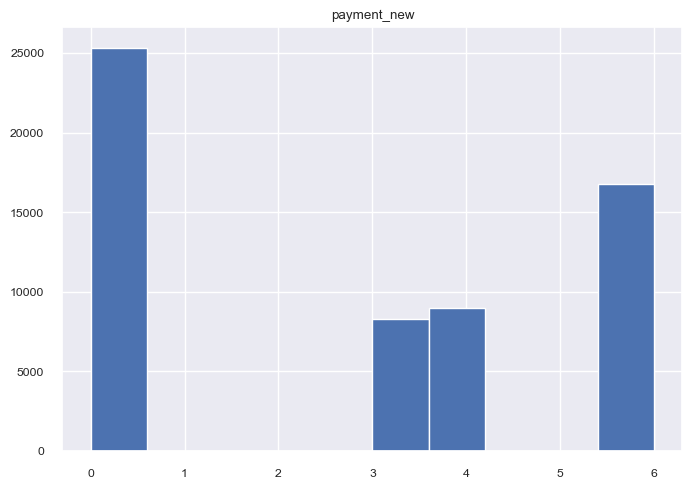

In [108]:
figsize=(8, 4)
for i in lista_num:
    df_mod_2[i].describe()
    plt.hist(df_mod_2[i])
    plt.title(i)
    plt.show()

Gran cantidad de datos agrupados en 0, en especial variables como construction_year, longitude, population, payment.

Comenzamos analizando por orden de importancia en el modelo

In [109]:
#Función de visualización 
def histogram_boxplot(data, xlabel = None, title = None, font_scale=2, figsize=(9,8), bins = None):
    
    # Definir tamaño letra
    sns.set(font_scale=font_scale)
    # Crear ventana para los subgráficos
    f2, (ax_box2, ax_hist2) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)}, figsize=figsize)
    # Crear boxplot
    sns.boxplot(x=data, ax=ax_box2)
    # Crear histograma
    sns.histplot(x=data, ax=ax_hist2, bins=bins) if bins else sns.histplot(x=data, ax=ax_hist2)
    # Pintar una línea con la media
    ax_hist2.axvline(np.mean(data),color='g',linestyle='-')
    # Pintar una línea con la mediana
    ax_hist2.axvline(np.median(data),color='y',linestyle='--')
    # Asignar título y nombre de eje si tal
    if xlabel: ax_hist2.set(xlabel=xlabel)
    if title: ax_box2.set(title=title, xlabel="")
    # Mostrar gráfico
    plt.show()

##### longitude

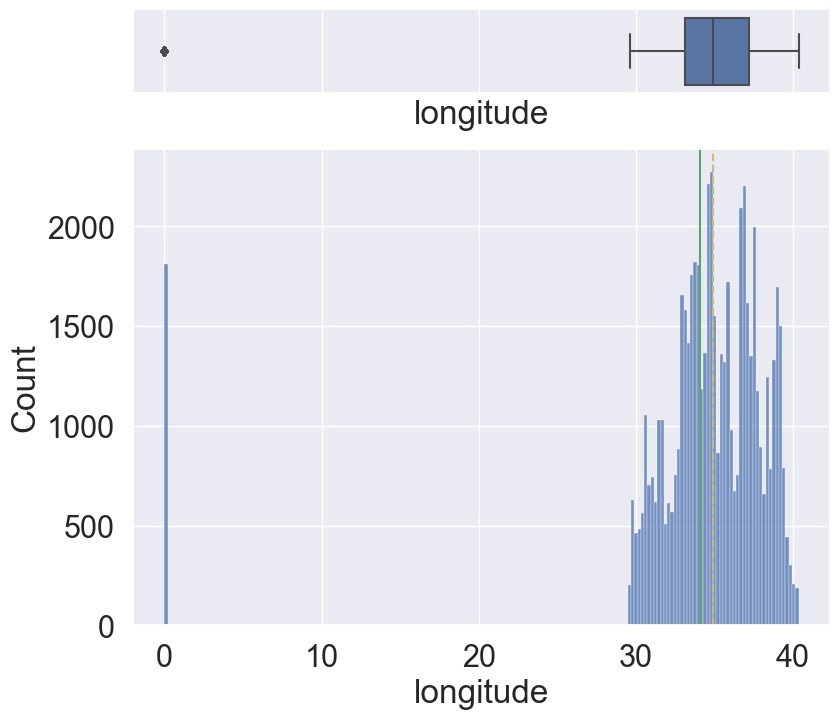

In [110]:
histogram_boxplot(df_mod_2.longitude)

Gran cantidad de datos agruapdos en 0.

In [111]:
print(df_mod_2['longitude'].describe())
print('median: ',df_mod_2['longitude'].median())

count    59400.000000
mean        34.077427
std          6.567432
min          0.000000
25%         33.090347
50%         34.908743
75%         37.178387
max         40.345193
Name: longitude, dtype: float64
median:  34.90874343


In [112]:
df_mod_2['longitude'].value_counts(normalize=True) * 100

longitude
0.000000     3.050505
37.375717    0.003367
38.340501    0.003367
39.086183    0.003367
33.005032    0.003367
               ...   
35.885754    0.001684
36.626541    0.001684
37.333530    0.001684
38.970078    0.001684
38.104048    0.001684
Name: proportion, Length: 57516, dtype: float64

Un 3 % de los valores están agrupados en 0, la longitud 0 no existe, es un valor imposible en términos de cartografía. Por ello vamos a eliminar los valores con 0, y los vamos a imputar con knn imputer, que busca los k vecinos más cercanos, es decir, indentifica registros parecidos e imputa los valores de estos vecinos. 

*https://github.com/PacktPublishing/Python-Feature-Engineering-Cookbook-Second-Edition/blob/main/ch01-missing-data-imputation/Recipe-08-Estimating-missing-data-with-K-nearest-neighbours.ipynb*

In [113]:
imputer = KNNImputer(
    n_neighbors=5,
    weights="distance",
)

In [114]:
#Tomamos los registros con valor 0 y los convertimos en nulo
df_mod_2.loc[df_mod_2.longitude == 0,'longitude'] =np.nan
df_mod_2['longitude'] = imputer.fit_transform(df_mod_2[['longitude']])

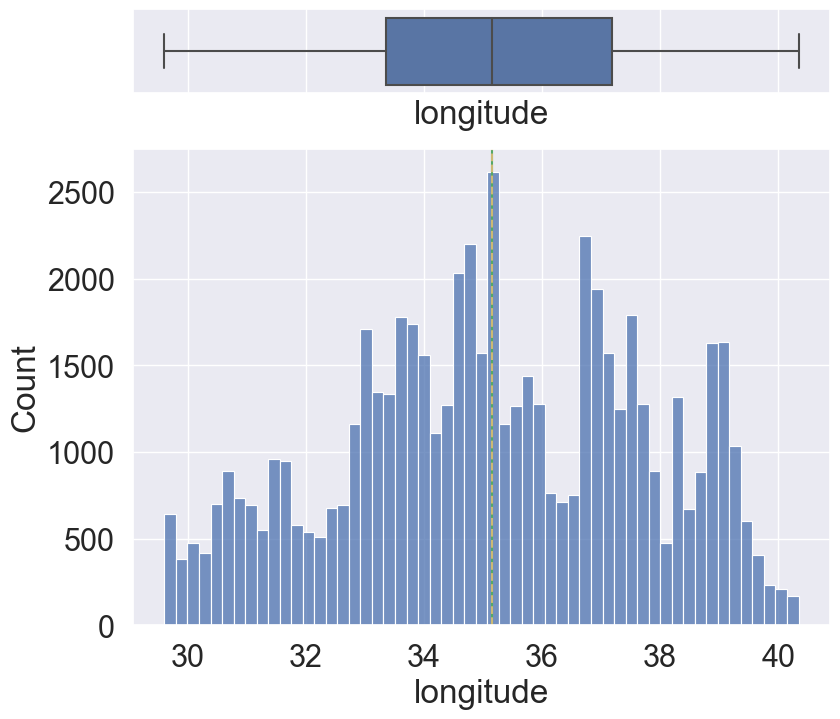

In [115]:
histogram_boxplot(df_mod_2.longitude)

Con esta transformación no disponemos de valores atípicos, en este mismo apartado la tramificaremos.

In [116]:
def tramos(varib, varib_destino, tamanio, df):
    df[varib_destino] = (df[varib] // tamanio)

In [117]:
tramos('longitude', 'longitude_tramificado', tamanio=5, df=df_mod_2)

Tramificamos la variable en 5 tramos.

In [118]:
df_mod_2['longitude_tramificado'].value_counts()

longitude_tramificado
7.0    30331
6.0    27709
5.0     1029
8.0      331
Name: count, dtype: int64

In [119]:
corr = abs(df_mod_2.corr())
corr[['status_group']].sort_values(by = 'status_group',ascending = False)

,status_group
status_group,1.000000
waterpoint_type_new,0.210044
extraction_type_class_new,0.209448
waterpoint_type,0.206507
waterpoint_type_group,0.206431
waterpoint_type_group_new,0.196340
quantity_new,0.184209
extraction_type_class,0.175338
quality_group,0.153163
quantity,0.131425


Mejora escasamente la correlación al tramificarla.

##### latitude

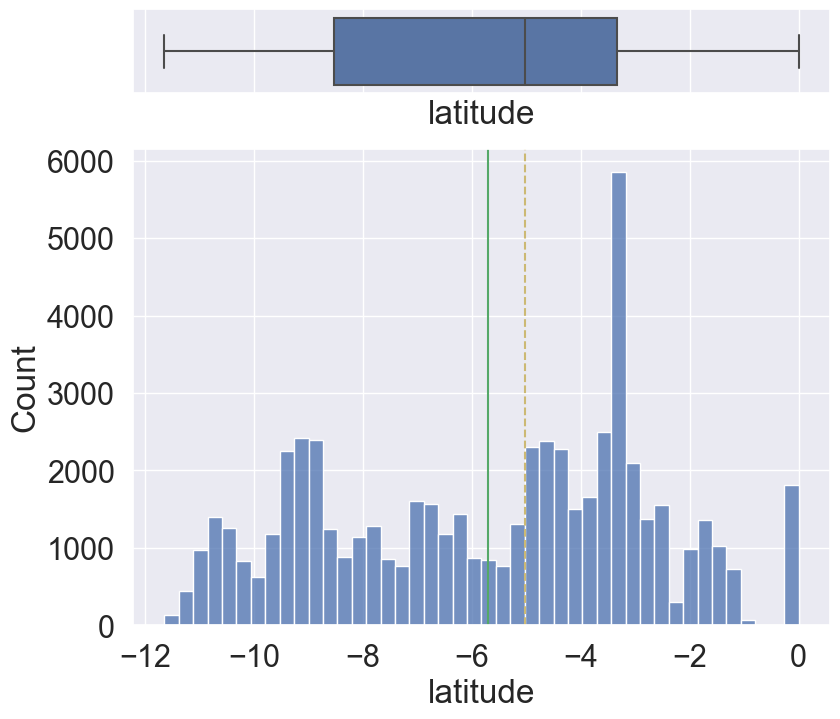

In [120]:
histogram_boxplot(df_mod_2.latitude)

In [121]:
print(df_mod_2['latitude'].describe())
print('median: ',df_mod_2['latitude'].median())

count    5.940000e+04
mean    -5.706033e+00
std      2.946019e+00
min     -1.164944e+01
25%     -8.540621e+00
50%     -5.021597e+00
75%     -3.326156e+00
max     -2.000000e-08
Name: latitude, dtype: float64
median:  -5.021596649999999


In [122]:
df_mod_2['latitude'].value_counts(normalize=True) * 100

latitude
-2.000000e-08    3.050505
-6.985842e+00    0.003367
-6.980220e+00    0.003367
-2.476680e+00    0.003367
-6.978263e+00    0.003367
                   ...   
-3.287619e+00    0.001684
-8.234989e+00    0.001684
-3.268579e+00    0.001684
-1.146053e+01    0.001684
-6.747464e+00    0.001684
Name: proportion, Length: 57517, dtype: float64

El valor -2.000000e-08 no es posible, lo eliminamos e imputamos mediante knn.

In [123]:
df_mod_2.loc[df_mod_2.latitude == -2.000000e-08,'latitude'] =np.nan
df_mod_2['latitude'] = imputer.fit_transform(df_mod_2[['latitude']])

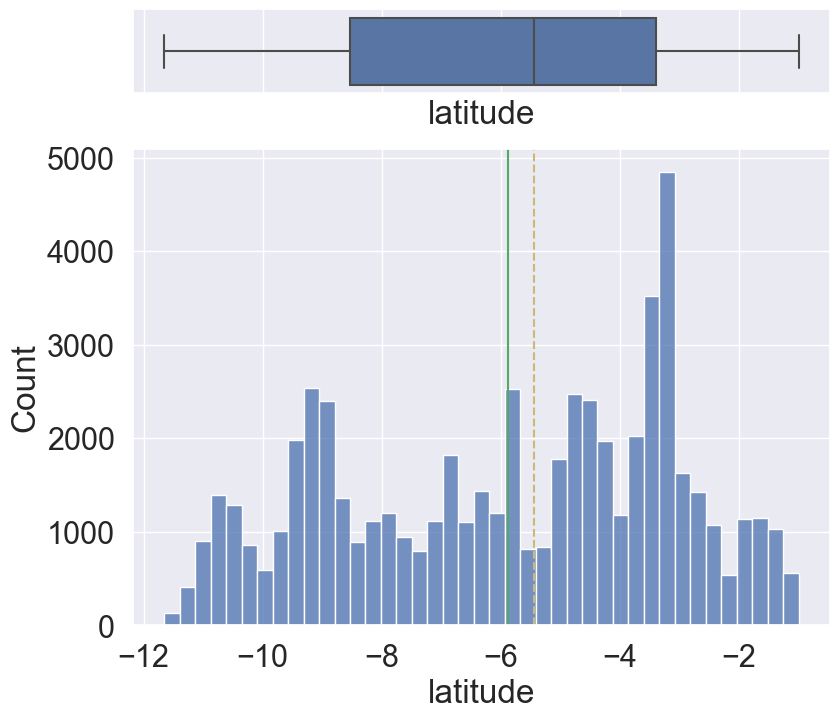

In [124]:
histogram_boxplot(df_mod_2.latitude)

Tramificamos en 5.

In [125]:
tramos('latitude', 'latitude_tramificado', tamanio=5, df=df_mod_2)

In [126]:
corr = abs(df_mod_2.corr())
corr[['status_group']].sort_values(by = 'status_group',ascending = False)

,status_group
status_group,1.000000
waterpoint_type_new,0.210044
extraction_type_class_new,0.209448
waterpoint_type,0.206507
waterpoint_type_group,0.206431
waterpoint_type_group_new,0.196340
quantity_new,0.184209
extraction_type_class,0.175338
quality_group,0.153163
quantity,0.131425


Mejora sensiblemente la correlación.

##### amount_tsh

In [127]:
print(df_mod_2['amount_tsh'].describe())
print('median: ',df_mod_2['amount_tsh'].median())

count     59400.000000
mean        317.650385
std        2997.574558
min           0.000000
25%           0.000000
50%           0.000000
75%          20.000000
max      350000.000000
Name: amount_tsh, dtype: float64
median:  0.0


Valores incongruentes.. mediana en 0, pero media de 318. El valor máximo de 350000 distorsiona las métricas.

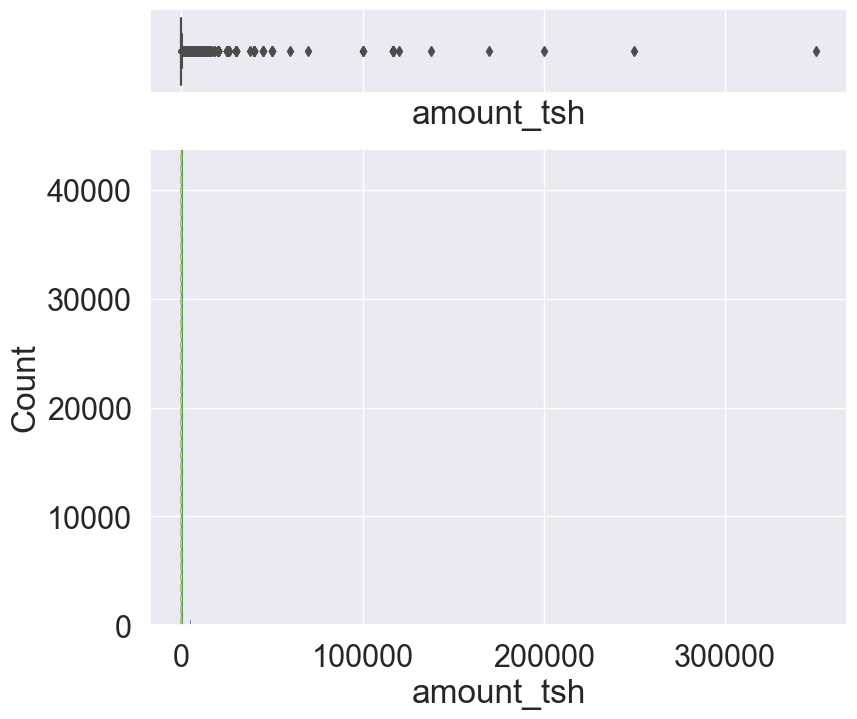

In [128]:
histogram_boxplot(df_mod_2.amount_tsh)

In [129]:
df_mod_2['amount_tsh'].value_counts(normalize=True) * 100

amount_tsh
0.0         70.099327
500.0        5.222222
50.0         4.161616
1000.0       2.505051
20.0         2.462963
              ...    
6300.0       0.001684
120000.0     0.001684
138000.0     0.001684
350000.0     0.001684
59.0         0.001684
Name: proportion, Length: 98, dtype: float64

Gran cantidad de valores 0, como es posible tomar el valor 0 vamos a clasificar por tramos. Tramificamos en 5.

In [130]:
tramos('amount_tsh', 'amount_tsh_tramificado', tamanio=5, df=df_mod_2)

In [131]:
corr = abs(df_mod_2.corr())
corr[['status_group']].sort_values(by = 'status_group',ascending = False)

,status_group
status_group,1.000000
waterpoint_type_new,0.210044
extraction_type_class_new,0.209448
waterpoint_type,0.206507
waterpoint_type_group,0.206431
waterpoint_type_group_new,0.196340
quantity_new,0.184209
extraction_type_class,0.175338
quality_group,0.153163
quantity,0.131425


##### construction_year

In [132]:
print(df_mod_2['construction_year'].describe())
print('median: ',df_mod_2['construction_year'].median())

count    59400.000000
mean      1300.652475
std        951.620547
min          0.000000
25%          0.000000
50%       1986.000000
75%       2004.000000
max       2013.000000
Name: construction_year, dtype: float64
median:  1986.0


Valor medio de 1300, es imposible. Eliminamos los valores 0 e imputamos mediante knn.

In [133]:
df_mod_2['construction_year'].value_counts(normalize=True) * 100

construction_year
0       34.863636
2010     4.452862
2008     4.398990
2009     4.264310
2000     3.520202
2007     2.671717
2006     2.476431
2003     2.164983
2011     2.114478
2004     1.890572
2012     1.824916
2002     1.809764
1978     1.745791
1995     1.707071
2005     1.702020
1999     1.648148
1998     1.626263
1990     1.606061
1985     1.590909
1980     1.365320
1996     1.365320
1984     1.311448
1982     1.252525
1994     1.242424
1972     1.191919
1974     1.138047
1997     1.084175
1992     1.077441
1993     1.023569
2001     0.909091
1988     0.877104
1983     0.821549
1975     0.735690
1986     0.730640
1976     0.696970
1970     0.691919
1991     0.545455
1989     0.531987
1987     0.508418
1981     0.400673
1977     0.340067
1979     0.323232
1973     0.309764
2013     0.296296
1971     0.244108
1960     0.171717
1967     0.148148
1963     0.143098
1968     0.129630
1969     0.099327
1964     0.067340
1962     0.050505
1961     0.035354
1965     0.031987
1966     0

In [134]:
imputer = KNNImputer(
    n_neighbors=5,
    weights="distance",
)

In [135]:
# Reemplazar los valores de construcción igual a 0 por NaN
df_mod_2.loc[df_mod_2.construction_year == 0, 'construction_year'] = np.nan

# Crear un imputador KNN y ajustarlo a los datos
imputer = KNNImputer(
    n_neighbors=5,
    weights="distance"
)
df_mod_2['construction_year'] = imputer.fit_transform(df_mod_2[['construction_year']])
df_mod_2['construction_year'] = df_mod_2['construction_year'].round().astype(int)

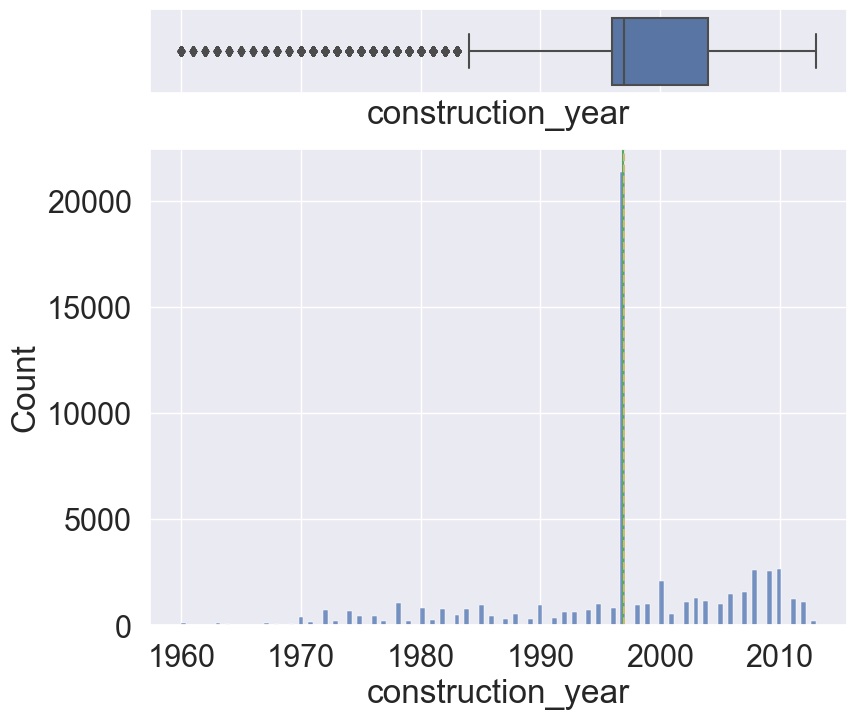

In [136]:
histogram_boxplot(df_mod_2.construction_year)

In [137]:
df_mod_2.construction_year.value_counts()

construction_year
1997    21353
2010     2645
2008     2613
2009     2533
2000     2091
2007     1587
2006     1471
2003     1286
2011     1256
2004     1123
2012     1084
2002     1075
1978     1037
1995     1014
2005     1011
1999      979
1998      966
1990      954
1985      945
1996      811
1980      811
1984      779
1982      744
1994      738
1972      708
1974      676
1992      640
1993      608
2001      540
1988      521
1983      488
1975      437
1986      434
1976      414
1970      411
1991      324
1989      316
1987      302
1981      238
1977      202
1979      192
1973      184
2013      176
1971      145
1960      102
1967       88
1963       85
1968       77
1969       59
1964       40
1962       30
1961       21
1965       19
1966       17
Name: count, dtype: int64

Gran cantidad de valores atípicos. Vamos a tramificar en función del año y ver cómo afecta al modelo.

In [138]:
df_mod_2['construction_year_decada_60'] = df_mod_2['construction_year'].apply(lambda x: 1 if x<=1969 else 0)
df_mod_2['construction_year_decada_70'] = df_mod_2['construction_year'].apply(lambda x: 1 if x<=1979 else 0)
df_mod_2['construction_year_decada_80'] = df_mod_2['construction_year'].apply(lambda x: 1 if x<=1989 else 0)
df_mod_2['construction_year_decada_90'] = df_mod_2['construction_year'].apply(lambda x: 1 if x<=1999 else 0)
df_mod_2['construction_year_decada_2000'] = df_mod_2['construction_year'].apply(lambda x: 1 if x<=2009 else 0)
df_mod_2['construction_year_2010'] = df_mod_2['construction_year'].apply(lambda x: 1 if x==2010 else 0)

In [139]:
corr = abs(df_mod_2.corr())
corr[['status_group']].sort_values(by = 'status_group',ascending = False)

,status_group
status_group,1.000000
construction_year,0.231496
waterpoint_type_new,0.210044
extraction_type_class_new,0.209448
waterpoint_type,0.206507
waterpoint_type_group,0.206431
waterpoint_type_group_new,0.196340
construction_year_decada_90,0.187082
quantity_new,0.184209
construction_year_decada_80,0.177178


In [140]:
#Función con todos los pasos realizados en este preprocesado.
def feature_engineering_2(data):
    data.loc[data.longitude == 0,'longitude'] =np.nan
    data['longitude'] = imputer.fit_transform(data[['longitude']])
    tramos('longitude', 'longitude_tramificado', tamanio=5, df=data)
    data.loc[data.latitude == -2.000000e-08,'latitude'] =np.nan
    data['latitude'] = imputer.fit_transform(data[['latitude']])
    tramos('latitude', 'latitude_tramificado', tamanio=5, df=data)
    tramos('amount_tsh', 'amount_tsh_tramificado', tamanio=10, df=data)
    data.loc[data.construction_year == 0, 'construction_year'] = np.nan
    data['construction_year'] = imputer.fit_transform(data[['construction_year']])
    data['construction_year'] = data['construction_year'].round().astype(int)
    data['construction_year_decada_60'] = data['construction_year'].apply(lambda x: 1 if x<=1969 else 0)
    data['construction_year_decada_70'] = data['construction_year'].apply(lambda x: 1 if x<=1979 else 0)
    data['construction_year_decada_80'] = data['construction_year'].apply(lambda x: 1 if x<=1989 else 0)
    data['construction_year_decada_90'] = data['construction_year'].apply(lambda x: 1 if x<=1999 else 0)
    data['construction_year_decada_2000'] = data['construction_year'].apply(lambda x: 1 if x<=2009 else 0)
    data['construction_year_2010'] = data['construction_year'].apply(lambda x: 1 if x==2010 else 0)
    return data

## Modelizamos

Vamos a probar los resultado de nuestra tramificación y ver si ha ayudan a mejorar el rendimiento de nuestro modelo.

In [141]:
X_train_3,X_test_3,y_train_3,y_test_3 = particion_datos(df_mod_2,'status_group',0.2,None)

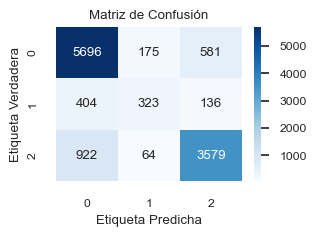

ACCURACY
Accuracy promedio: 
0.8079124579124579
PRECISION
Precisión por cada clase: 
[0.81116491 0.5747331  0.83310056]
Precisión promedio del modelo: 
0.8079124579124579
RECALL
Recall por cada clase: 
[0.88282703 0.37427578 0.78400876]
Recall promedio del modelo: 
0.8079124579124579
F1
F1 por cada clase: 
[0.84548018 0.45333333 0.8078095 ]
F1 promedio del modelo: 
0.8079124579124579


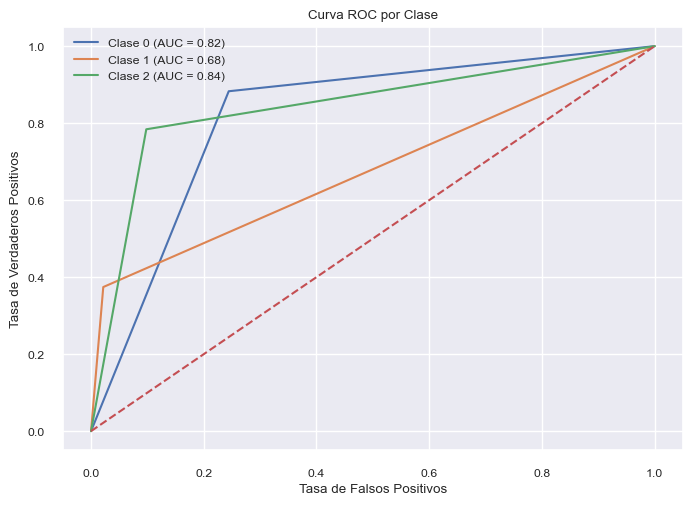

In [142]:
model_4_random = RandomForestClassifier()
model_4_random.fit(X_train_3,y_train_3)
random_predict_4 = model_4_random.predict(X_test_3)

saca_metricas(y_test_3, random_predict_4)

Ha bajado la media de accuracy de nuestro modelo, también observamos que ha bajado la predicibilidad de nuestra clase 1, vamos a hacer una prueba y, posteriormente probamos con hiperparámetros y balanceo para tratar de mejorar el score el el grupo 1.

In [143]:
df_test_3 = df_1.copy()
df_test_3 = preprocesado(df_test_3)
df_test_3 = numerico(df_test_3)
df_test_3 = feature_engineering(df_test_3)
df_test_3 = feature_engineering_2(df_test_3)
random_predict_test_4 = model_4_random.predict(df_test_3)
df_envio = pd.concat([df_1['id'],pd.Series(random_predict_test_4)], axis = 1)
#Cambiamos el nombre de la columna a status_group
df_envio.columns.values[1] = "status_group"
# Reemplazar los valores en la primera columna usando iloc
df_envio.iloc[:, 1] = df_envio.iloc[:, 1].replace({0:'functional', 1:'functional needs repair', 2: 'non functional'})
df_envio.to_csv('subida_random_4',index=False)

Obtenemos un score de 0.806. Como tenemos unos valores muy bajos para la clase 1, vamos a balancear los datos para mejorar el rendimiento de la clase 1.
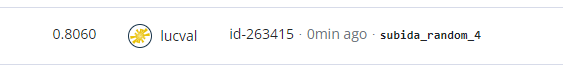

##### Balanceamos los datos

In [144]:
print('Distribución de las clases previa aplicación del SMOTE')
print("Before OverSampling, counts of label '1': {}".format(sum(df_mod_2.status_group==1)))
print("Before OverSampling, counts of label '0': {} \n".format(sum(df_mod_2.status_group==0)))
print("Before OverSampling, counts of label '2': {} \n".format(sum(df_mod_2.status_group==2)))

sampling_strategy = {0: 32259, 1: 6452, 2: 22824}#Establecemos la proporción de nuestros datos.
sm = SMOTE(random_state=2,sampling_strategy=sampling_strategy)
df_res, y_res = sm.fit_resample(df_mod_2, df_mod_2.status_group.ravel())

print('Distribución de las clases después de la aplicación de SMOTE')
print('After OverSampling, the shape of train_X: {}'.format(df_res.shape))
print('After OverSampling, the shape of train_y: {} \n'.format(y_res.shape))

print("After OverSampling, counts of label '1': {}".format(sum(y_res==1)))
print("After OverSampling, counts of label '0': {}".format(sum(y_res==0)))
print("After OverSampling, counts of label '2': {}".format(sum(y_res==2)))

Distribución de las clases previa aplicación del SMOTE
Before OverSampling, counts of label '1': 4317
Before OverSampling, counts of label '0': 32259 

Before OverSampling, counts of label '2': 22824 

Distribución de las clases después de la aplicación de SMOTE
After OverSampling, the shape of train_X: (61535, 53)
After OverSampling, the shape of train_y: (61535,) 

After OverSampling, counts of label '1': 6452
After OverSampling, counts of label '0': 32259
After OverSampling, counts of label '2': 22824


In [145]:
X_train_4,X_test_4,y_train_4,y_test_4 = particion_datos(df_res,'status_group',0.2,None)

##### Random Forest

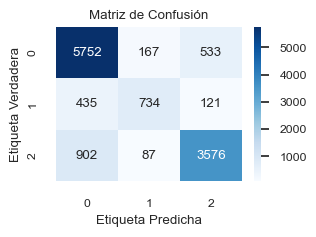

ACCURACY
Accuracy promedio: 
0.8175834890712602
PRECISION
Precisión por cada clase: 
[0.81139794 0.74291498 0.84539007]
Precisión promedio del modelo: 
0.8175834890712602
RECALL
Recall por cada clase: 
[0.89150651 0.56899225 0.78335159]
Recall promedio del modelo: 
0.8175834890712602
F1
F1 por cada clase: 
[0.84956798 0.64442493 0.81318931]
F1 promedio del modelo: 
0.8175834890712602


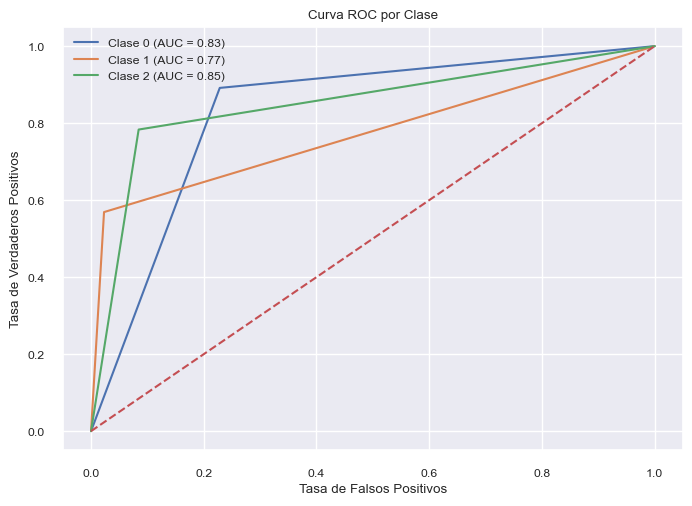

In [146]:
model_5_random = RandomForestClassifier()
model_5_random.fit(X_train_4,y_train_4)
random_predict_bal = model_5_random.predict(X_test_4)

saca_metricas(y_test_4, random_predict_bal)

El balanceo de los datos lo hacemos únicamente en los datos de entrenamiento.

Las métricas han mejorado en 0.04, hasta llegar a un 0.815 en accuracy. Esto es lógico, ya que, al tener más valores de entrenamiento en la clase 2, ha subido el AUC de la clase 1 de 0.67 a 0.76

Vamos a probar a subir el modelo a la plataforma, y ver si hemos incurrido en sobreajuste. 
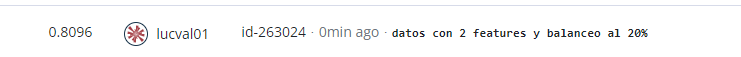

Buen resultado, hemos obtenido un 0.8096, tanto la tramificación como el balanceo a mejorado la predictibilidad.

*Hicimos la prueba de testear a un balanceo de 1/3 por cada clase, el resultado no era buena, ya que incurríamos en sobreajuste y, aunque predice mejor la clase 1, predice peor las dos clases mayoritarias, lo descartamos.*
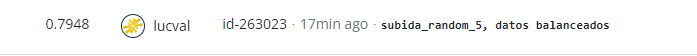 

Vamos a aplicar hiperparámetros y ver si, junto con el balanceo mejora el resultado.

In [147]:
grid_param = {
    'n_estimators': [1,1000],
    'max_depth': [1,500]
}

In [148]:
model_grid = GridSearchCV(estimator=model_5_random,
                     param_grid=grid_param,
                     scoring='f1_micro',
                     cv=5,
                     n_jobs=-1)

In [149]:
model_grid.fit(X_train_4, y_train_4)
print(model_grid.best_params_)
print(model_grid.best_score_)

{'max_depth': 500, 'n_estimators': 1000}
0.8108393320105758


##### Voting

In [150]:
#Definimos los clasificadores
clf1 = ExtraTreesClassifier(n_estimators=500, random_state=42)
clf2 = RandomForestClassifier(n_estimators=1000, max_depth=500, random_state=42)
clf3 = XGBClassifier()

voting_clf = VotingClassifier(
    estimators=[('lr', clf1), ('rf', clf2), ('et', clf3)],
    voting='soft'  # Voto suave (voto ponderado por las probabilidades de clase)
)

voting_clf.fit(X_train_4, y_train_4)

# Evaluamos el rendimiento
y_pred_clf_2 = voting_clf.predict(X_test_4)

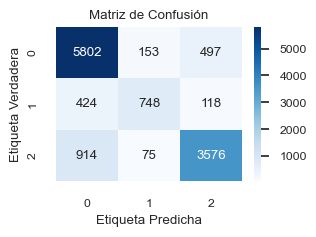

ACCURACY
Accuracy promedio: 
0.8227837815877143
PRECISION
Precisión por cada clase: 
[0.81260504 0.76639344 0.85325698]
Precisión promedio del modelo: 
0.8227837815877143
RECALL
Recall por cada clase: 
[0.89925604 0.57984496 0.78335159]
Recall promedio del modelo: 
0.8227837815877143
F1
F1 por cada clase: 
[0.85373749 0.66019417 0.81681133]
F1 promedio del modelo: 
0.8227837815877143


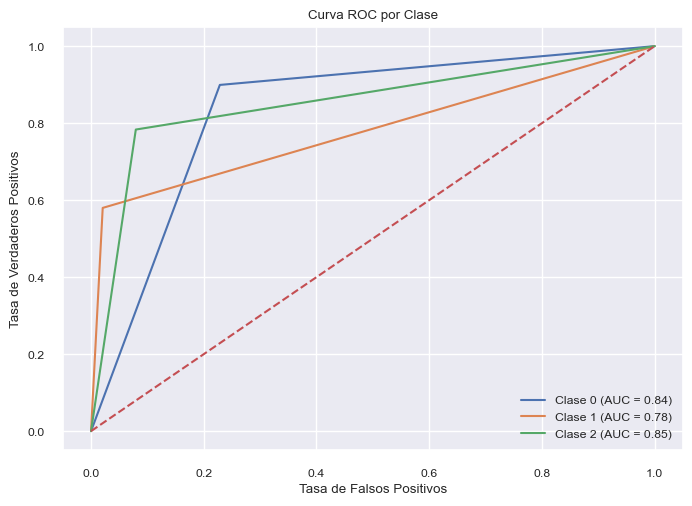

In [151]:
saca_metricas(y_test_4, y_pred_clf_2)

Mejoramos en 0.05 respecto a lo obtenido con RandomForest, en general las tres clases han subido en sus métricas.

In [152]:
clf_test_2 = voting_clf.predict(df_test_3)
df_envio = pd.concat([df_1['id'],pd.Series(clf_test_2)], axis = 1)
#Cambiamos el nombre de la columna a status_group
df_envio.columns.values[1] = "status_group"
# Reemplazar los valores en la primera columna usando iloc
df_envio.iloc[:, 1] = df_envio.iloc[:, 1].replace({0:'functional', 1:'functional needs repair', 2: 'non functional'})
df_envio.to_csv('subida_clf_2',index=False)

Sin duda, el mejor resultado tanto en fase de training como testeo. El balanceo de la clase 2 ha mejorado los resultados.

*En este primero probamos sin hiperparámetros*
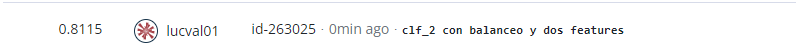

Aplicando tanto el modelo voting , como los hiperparámetros obtenidos con GridSearchCv.
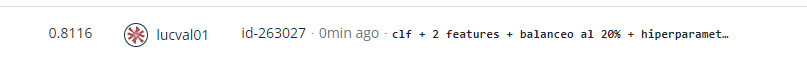

Para concluir el modelo, probaremos a transformar y tramificar las últimas variables que tenemos pendientes.

## Feature engineering 3

In [153]:
# Inicializa un diccionario para almacenar las importancias de las características
feature_importances = {}

# Determina el número máximo de características entre todos los clasificadores
max_features = min(len(df_mod_2.columns), max(len(clf.feature_importances_) for clf in voting_clf.estimators_))

# Itera sobre cada estimador en el clasificador de votación
for clf in voting_clf.estimators_:
    # Verifica si el estimador tiene el atributo feature_importances_
    if hasattr(clf, "feature_importances_"):
        # Itera sobre cada característica y su importancia
        for i in range(max_features):
            # Verifica que el índice de la característica sea válido
            if i < len(clf.feature_importances_):
                # Obtiene el nombre de la característica
                feature_name = df_mod_2.columns[i]  # Reemplaza df con tu DataFrame
                # Agrega la importancia de la característica al diccionario
                if feature_name in feature_importances:
                    feature_importances[feature_name].append(clf.feature_importances_[i])
                else:
                    feature_importances[feature_name] = [clf.feature_importances_[i]]

# Calcula el promedio de las importancias de cada característica
average_importances = {}
for feature, importances in feature_importances.items():
    average_importance = np.mean(importances)
    average_importances[feature] = average_importance

# Ordena el diccionario de importancias por valor en orden descendente
sorted_importances = sorted(average_importances.items(), key=lambda x: x[1], reverse=True)

# Imprime las variables en orden descendente de importancia
for feature, importance in sorted_importances:
    print(f"{feature}, Promedio de Importancia: {importance}")


record_duration, Promedio de Importancia: 0.10807431998634358
installer, Promedio de Importancia: 0.04863531725932838
longitude, Promedio de Importancia: 0.0476707440094129
quality_group, Promedio de Importancia: 0.046953878537731884
quantity_new, Promedio de Importancia: 0.04204986876045206
latitude, Promedio de Importancia: 0.035763061055497834
basin, Promedio de Importancia: 0.033023906328965326
construction_year_decada_70, Promedio de Importancia: 0.029683156276258612
waterpoint_type_group, Promedio de Importancia: 0.028865601157591816
funder, Promedio de Importancia: 0.027857264206422743
extraction_type_new, Promedio de Importancia: 0.026735484747518554
source_class, Promedio de Importancia: 0.024106737307302534
permit, Promedio de Importancia: 0.02224802341409028
lga, Promedio de Importancia: 0.022106216368753057
payment_new, Promedio de Importancia: 0.021853432855594362
ward, Promedio de Importancia: 0.01993450948518528
amount_tsh, Promedio de Importancia: 0.01948748775105627
wa

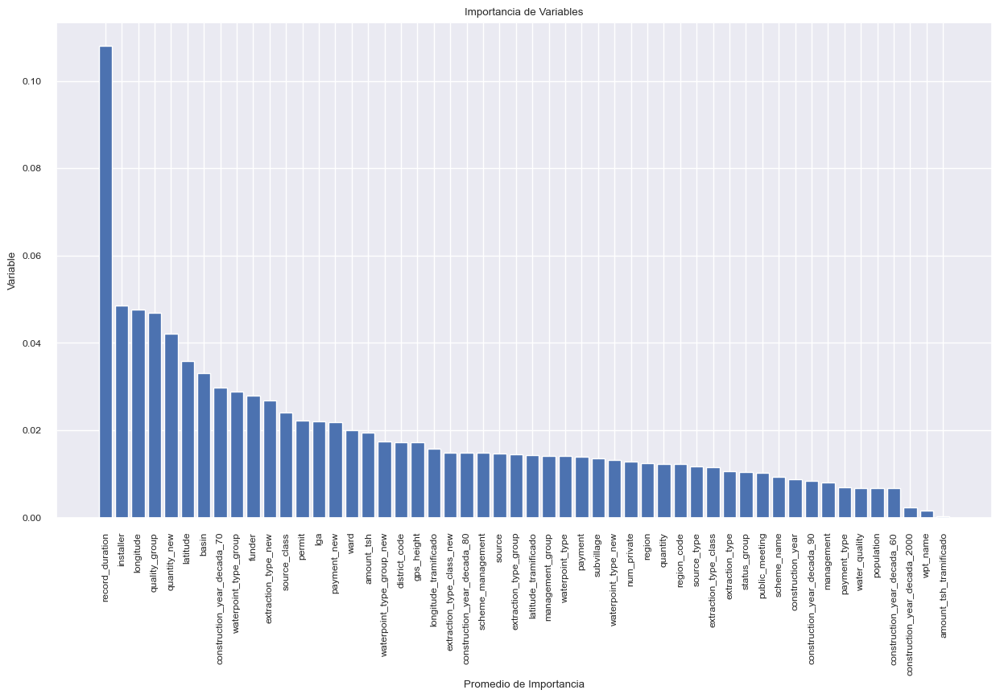

In [154]:
# Extrae las variables y sus promedios de importancia ordenados
variables = [item[0] for item in sorted_importances]
importancias = [item[1] for item in sorted_importances]

# Crea el gráfico de barras
plt.figure(figsize=(15, 8))
plt.bar(variables, importancias)
plt.xlabel('Promedio de Importancia')
plt.ylabel('Variable')
plt.title('Importancia de Variables')
plt.xticks(rotation=90) 
plt.show()


In [155]:
for i in df_mod_2.columns:
    print(i)
    print(df_mod_2[i].value_counts())

status_group
status_group
0    32259
2    22824
1     4317
Name: count, dtype: int64
amount_tsh
amount_tsh
0.0         41639
500.0        3102
50.0         2472
1000.0       1488
20.0         1463
            ...  
6300.0          1
120000.0        1
138000.0        1
350000.0        1
59.0            1
Name: count, Length: 98, dtype: int64
funder
funder
456     9084
1896    3637
261     3114
513     2202
1415    1374
        ... 
1311       1
640        1
1041       1
30         1
1439       1
Name: count, Length: 1897, dtype: int64
gps_height
gps_height
 0       20438
-15         60
-16         55
-13         55
 1290       52
         ...  
 2378        1
-54          1
 2057        1
 2332        1
 2366        1
Name: count, Length: 2428, dtype: int64
installer
installer
390     17402
2131     3656
571      1825
1474     1206
297      1060
        ...  
1305        1
192         1
1871        1
1938        1
1566        1
Name: count, Length: 2145, dtype: int64
longitude
longitude

##### record_duration

In [156]:
df_mod_3 = df_mod_2.copy()

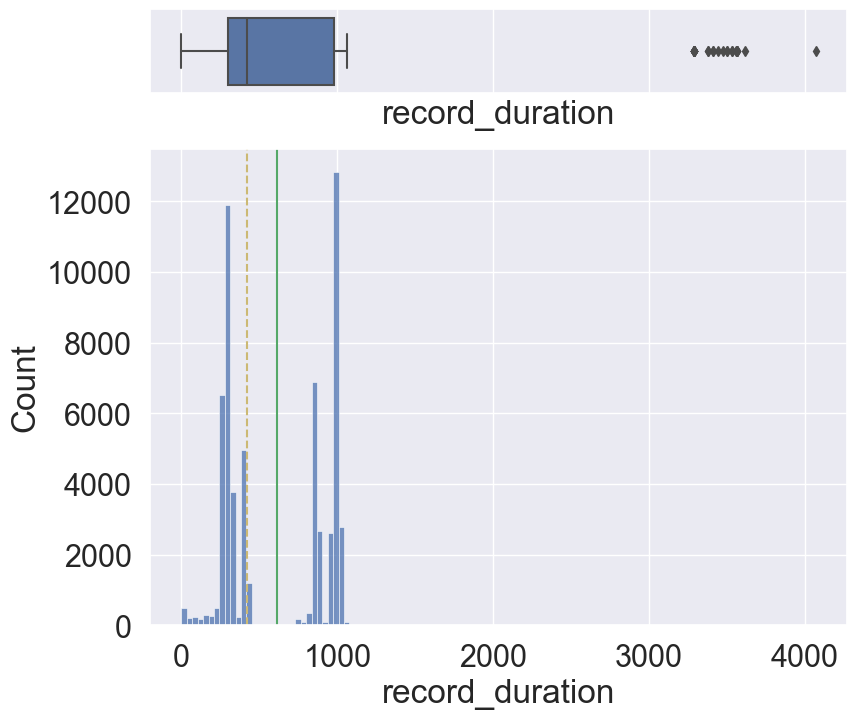

count    59400.000000
mean       613.616970
std        334.216374
min          0.000000
25%        297.000000
50%        419.000000
75%        977.000000
max       4068.000000
Name: record_duration, dtype: float64
419.0


In [157]:
histogram_boxplot(df_mod_3.record_duration)
print(df_mod_3['record_duration'].describe())
print(df_mod_3['record_duration'].median())

Datos distorsiandos, tiene valores atípicos elevados, lo que hace distorsionar la media. Esta variable fue la generada al inicio del preprocesado por nosotros, en la que restamos los el valor máximo con el día más pronto en el que se registro. Al ser una variable tan importante en la modelización, vamos a tramificarla.

In [158]:
df_mod_3['record_duration'].sort_values()

id
51681       0
27574       0
61352       0
33259       0
3010        0
         ... 
5971     3564
3358     3564
9195     3564
53086    3618
14428    4068
Name: record_duration, Length: 59400, dtype: int64

In [159]:
df_mod_3['record_duration'].value_counts().sort_values() 

record_duration
2         1
3533      1
820       1
800       1
810       1
       ... 
993     513
995     520
303     546
992     558
994     572
Name: count, Length: 356, dtype: int64

Lo vamos a agrupar en 3 tramos como new,median y old.

In [160]:
df_mod_3['record_duration_new'] = df_mod_3['record_duration'].apply(lambda x: 1 if x<=614 else 0)
df_mod_3['record_duration_median'] = df_mod_3['record_duration'].apply(lambda x: 1 if x>614 and x<=1500 else 0)
df_mod_3['record_duration_old'] = df_mod_3['record_duration'].apply(lambda x: 1 if x>1500 else 0)

Vamos a aislar las décadas y probar a la correlación. Antes habíamos imputado valores a < de la fecha y , en este paso, aislaremos por década.

In [161]:
df_mod_3['construction_year_decada_60'] = df_mod_3['construction_year'].apply(lambda x: 1 if x<=1969 else 0)
df_mod_3['construction_year_decada_70'] = df_mod_3['construction_year'].apply(lambda x: 1 if x>1969 and x<=1979 else 0)
df_mod_3['construction_year_decada_80'] = df_mod_3['construction_year'].apply(lambda x: 1 if x>1979 and x<=1989 else 0)
df_mod_3['construction_year_decada_90'] = df_mod_3['construction_year'].apply(lambda x: 1 if x>1989 and x<=1999 else 0)
df_mod_3['construction_year_decada_2000'] = df_mod_3['construction_year'].apply(lambda x: 1 if x>1999 and x<=2009 else 0)
df_mod_3['construction_year_2010'] = df_mod_3['construction_year'].apply(lambda x: 1 if x==2010 else 0)

Eliminamos las variables duplicadas.

In [162]:
df_mod_3.drop(['construction_year','record_duration'],axis = 1,inplace=True)

Queremos ver si alguna de las dummies que hemos generado correla de una forma elevada con la objetivo, ya que son las dos variables asociadas a tiempo y tendría sentido que pudieran tener una elevada correlación con el estatus del pozo.

In [163]:
corr = abs(df_mod_3.corr())
corr[['status_group']].sort_values(by = 'status_group',ascending = False)

,status_group
status_group,1.000000
waterpoint_type_new,0.210044
extraction_type_class_new,0.209448
waterpoint_type,0.206507
waterpoint_type_group,0.206431
waterpoint_type_group_new,0.196340
quantity_new,0.184209
extraction_type_class,0.175338
quality_group,0.153163
construction_year_decada_70,0.131614


**installer**

In [164]:
print(df_mod_3.installer.value_counts())

installer
390     17402
2131     3656
571      1825
1474     1206
297      1060
        ...  
1305        1
192         1
1871        1
1938        1
1566        1
Name: count, Length: 2145, dtype: int64


<Axes: xlabel='installer', ylabel='Density'>

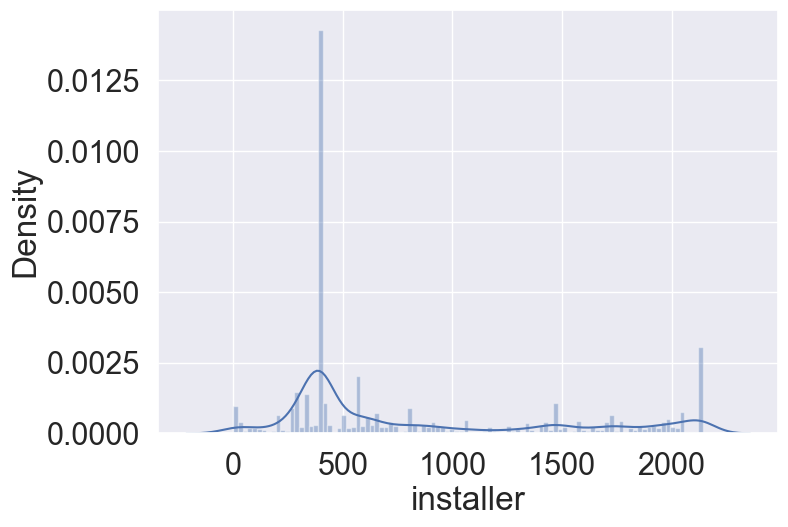

In [165]:
sns.distplot(df_mod_3['installer'], bins=100)

Hay instaladores con valores muy agrupados, y otras empresas que tan solo han hecho una instalación. Vamos a agrupar en una sola categoría a aquellas empresas que han realizado menos de 50 instalaciones.

In [166]:
df_mod_3['installer'].sort_values()

id
10873       0
42616       0
21336       0
7617        1
69018       1
         ... 
61381    2142
8660     2142
12416    2142
44667    2143
39014    2144
Name: installer, Length: 59400, dtype: int32

Generamos la clasificación 2145 para todos aquellos que tengan installer count_values<50

In [167]:
# Calculamos los recuentos de valores en la columna "installer"
installer_counts = df_mod_3['installer'].value_counts()

# Obtenemos los índices de los valores que tienen un recuento menor que 50
replace_indices = installer_counts[installer_counts < 50].index

# Reemplazamos los valores en la columna "installer" que cumplen con la condición
df_mod_3.loc[df_mod_3['installer'].isin(replace_indices), 'installer'] = 2145

<Axes: xlabel='installer', ylabel='Density'>

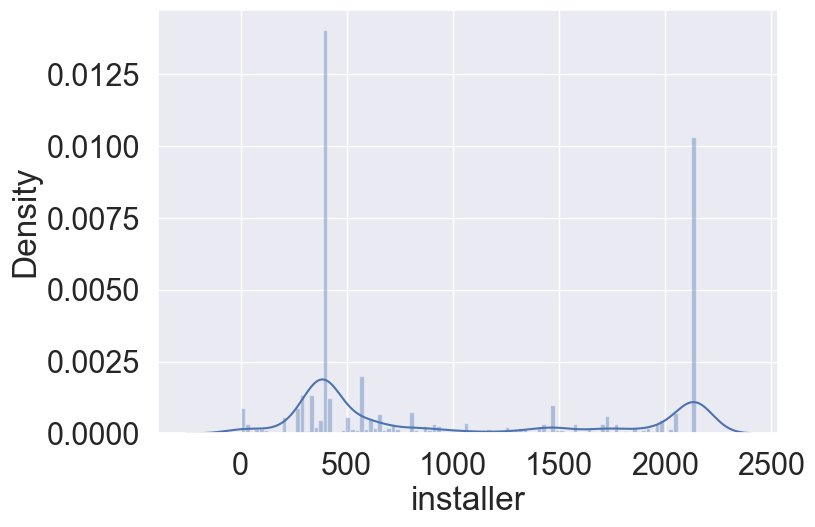

In [168]:
sns.distplot(df_mod_3['installer'], bins=100)

In [169]:
print(df_mod_3.installer.value_counts())

installer
390     17402
2145     9302
2131     3656
571      1825
1474     1206
        ...  
2136       52
1434       52
1479       52
952        52
197        50
Name: count, Length: 146, dtype: int64


In [170]:
df_mod_2.installer.nunique()

2145

Teníamos 2145 y pasamos a tener 146.

In [171]:
df_mod_3.installer.nunique()

146

##### gps_height	

In [172]:
df_mod_3['gps_height']

id
69572    1390
8776     1399
34310     686
67743     263
19728       0
         ... 
60739    1210
27263    1212
37057       0
31282       0
26348     191
Name: gps_height, Length: 59400, dtype: int64

En este caso, gps_height representa la altitud del pozo. Por ello, vamos a tramificar la variable.

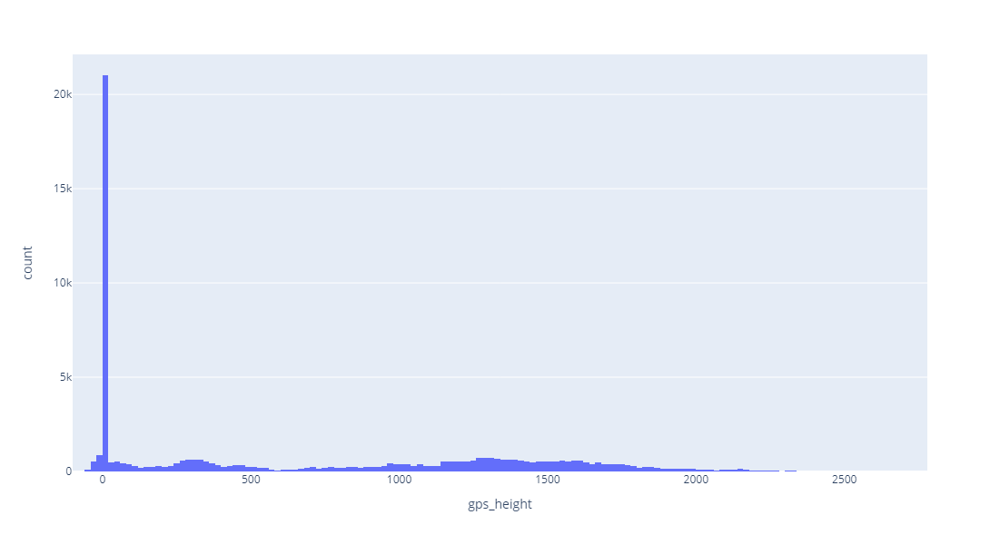

In [173]:
import plotly.express as px

# Crear el histograma interactivo con Plotly
fig = px.histogram(df_mod_3, x='gps_height', nbins=200)

# Configurar el tamaño del gráfico
fig.update_layout(width=900, height=600)

# Mostrar el gráfico interactivo de Plotly
fig.show()


No podemos indicar si el valor 0 no es válido. Vamos a evaluar su comportamiento en función del estado del pozo.

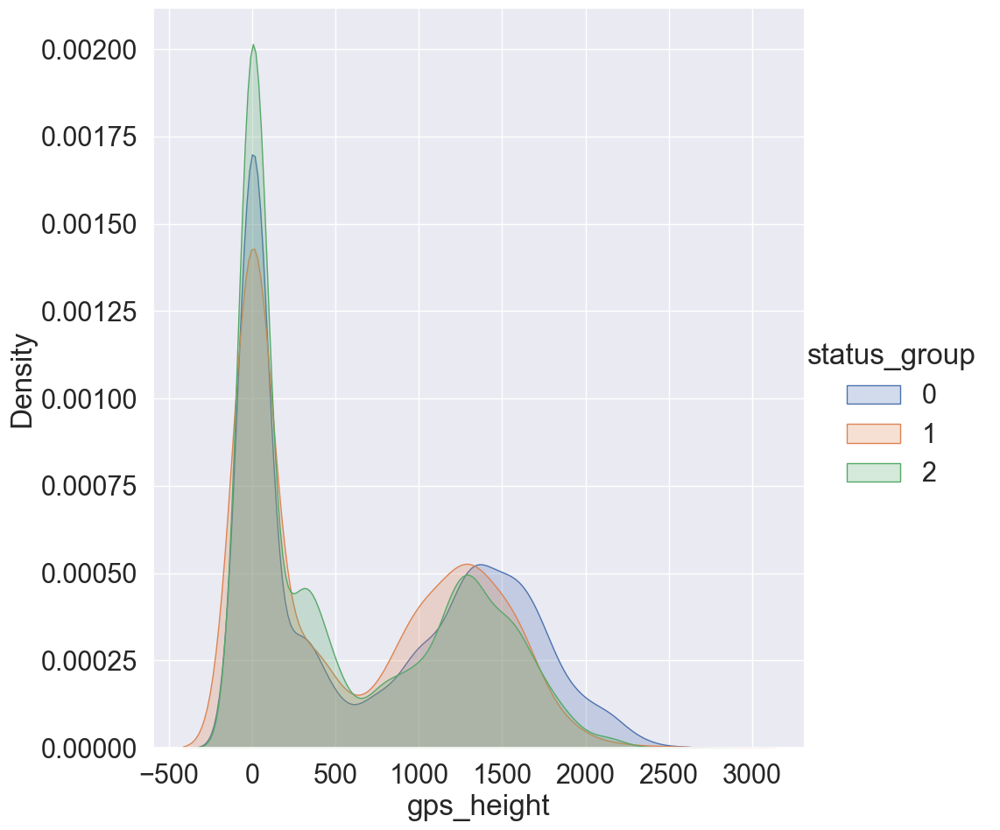

In [174]:
sns.FacetGrid(data=df_mod_3,hue='status_group',height=10).map(sns.kdeplot, 'gps_height', shade=True).add_legend()

Parece que sigue una distribución similar para las 3 clases. En ese caso, vamos a tramificar los datos en base a lo visto en pyplot.

In [175]:
df_mod_3['gps_height_new']=df_mod_3['gps_height'].apply(lambda x: 0 if x<0 else (1 if x==0 else (2 if x>1 and x<650 else (3 if x>=650 and x<2000 else 4))))

In [176]:
corr = abs(df_mod_3.corr())
corr[['status_group']].sort_values(by = 'status_group',ascending = False)

,status_group
status_group,1.000000
waterpoint_type_new,0.210044
extraction_type_class_new,0.209448
waterpoint_type,0.206507
waterpoint_type_group,0.206431
waterpoint_type_group_new,0.196340
quantity_new,0.184209
extraction_type_class,0.175338
quality_group,0.153163
construction_year_decada_70,0.131614


Correlaciona ligeramente peor.

##### region_code

Vamos a evaluar las variables relacionadas con la ubicación y ver cómo correlacionan.

In [177]:
lista_ubi = ['status_group','longitude','latitude','region','region_code','basin','subvillage','district_code','lga','ward']

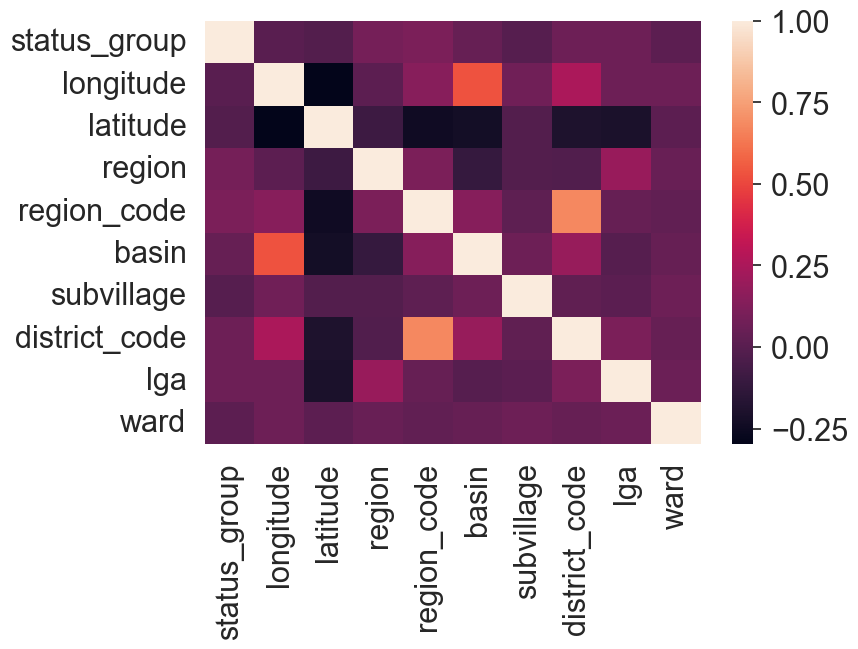

In [178]:
df_correlacion = df_mod_3[lista_ubi]
correlation_mat = df_correlacion.corr()
sns.heatmap(correlation_mat)
plt.show()


No parece que correlacionen demasiado con la objetivo, pero sí entre ellas, como puede ser basin y longitude o, como habíamos comentado previamente, region_code y distrcit_code. El tratamiento que daremos a las variables analizadas ahora las agruparemos en base a su %.

##### region_code

<Axes: xlabel='region_code', ylabel='Density'>

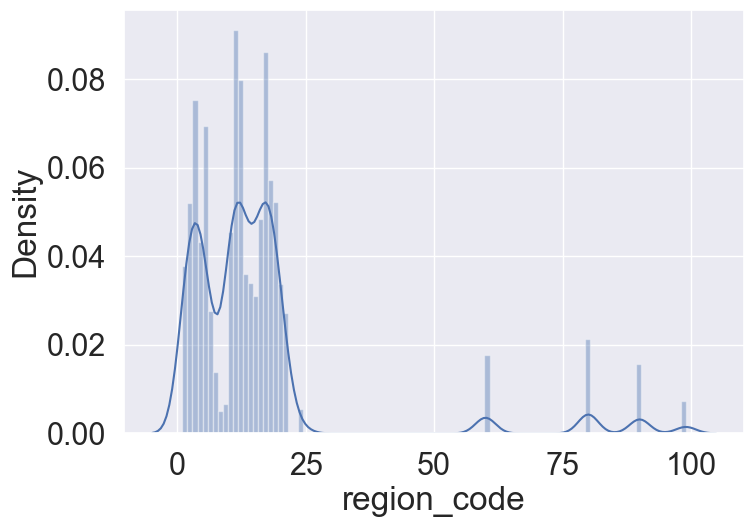

In [179]:
sns.distplot(df_mod_3['region_code'], bins=100)

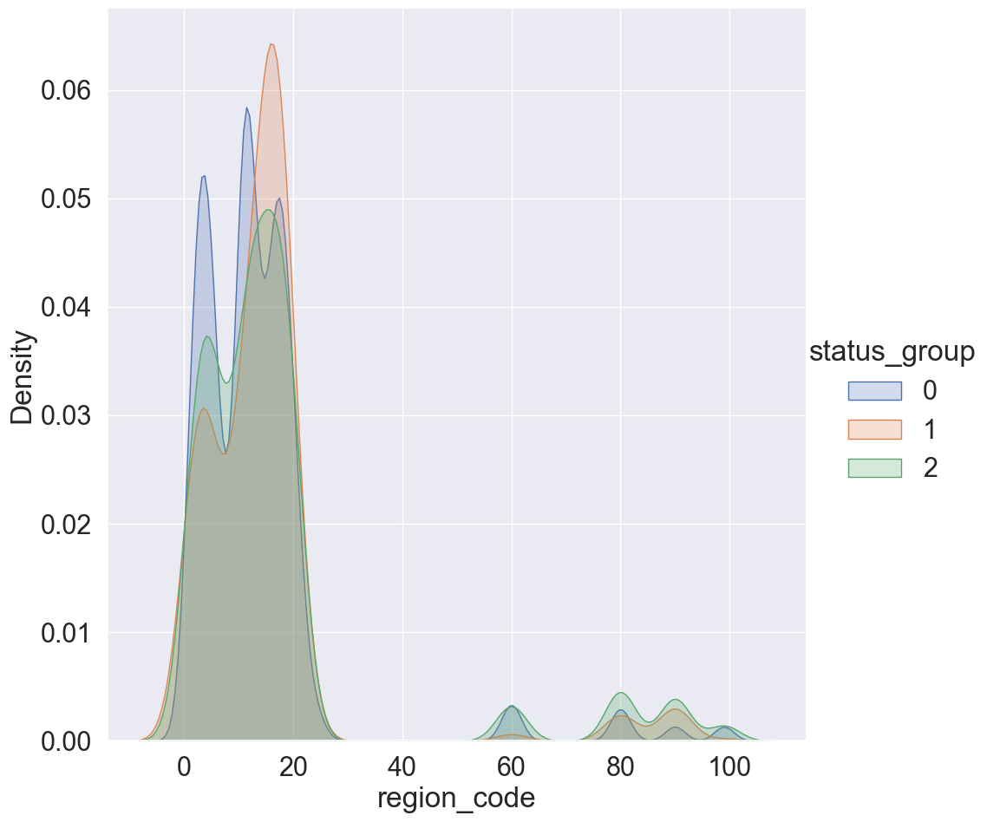

In [180]:
sns.FacetGrid(data=df_mod_3,hue='status_group',height=10).map(sns.kdeplot, 'region_code', shade=True).add_legend()

Vemos que las tres clases tienen comportamientos ligeramente diferentes.

region_code
11    8.922559
17    8.436027
12    7.809764
3     7.372054
5     6.801347
18    5.595960
19    5.129630
2     5.090909
16    4.740741
10    4.444444
4     4.230640
1     3.705387
13    3.523569
14    3.331650
20    3.314815
15    3.043771
6     2.708754
21    2.664983
80    2.084175
60    1.725589
90    1.543771
7     1.355219
99    0.712121
9     0.656566
24    0.548822
8     0.505051
40    0.001684
Name: proportion, dtype: float64


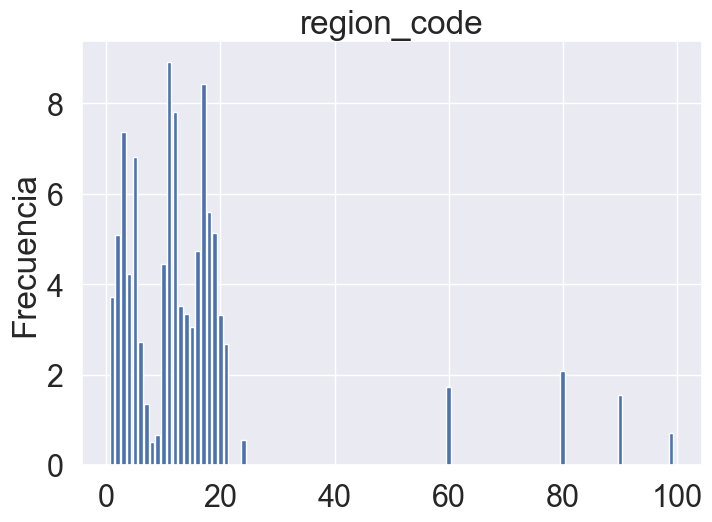

In [181]:
vis_var(df_mod_3,'region_code')

In [182]:
# Calcula el porcentaje de aparición de cada valor
value_counts = df_mod_3['region_code'].value_counts(normalize=True)

# Asigna clases según los porcentajes de aparición
def assign_class(percentage):
    if percentage > 0.07:
        return 0
    elif 0.06 < percentage <= 0.07:
        return 1
    elif 0.05 < percentage <= 0.06:
        return 2
    elif 0.04 < percentage <= 0.05:
        return 3
    elif 0.03 < percentage <= 0.04:
        return 4
    elif 0.02 < percentage <= 0.03:
        return 5
    elif 0.01 < percentage <= 0.02:
        return 5
    else:
        return 6

# Creamos un diccionario para mapear los porcentajes de aparición a las clases
percentage_to_class = {value: assign_class(percentage) for value, percentage in value_counts.items()}

# Asigna las clases a la columna 'region_code' utilizando el diccionario
df_mod_3['region_code_new'] = df_mod_3['region_code'].map(percentage_to_class)

In [183]:
corr = abs(df_mod_3.corr())
corr[['status_group']].sort_values(by = 'status_group',ascending = False)

,status_group
status_group,1.000000
waterpoint_type_new,0.210044
extraction_type_class_new,0.209448
waterpoint_type,0.206507
waterpoint_type_group,0.206431
waterpoint_type_group_new,0.196340
quantity_new,0.184209
extraction_type_class,0.175338
quality_group,0.153163
construction_year_decada_70,0.131614


Mejora en 0.02 la correlación.

##### region

region
3     8.912458
17    8.387205
10    7.809764
6     7.372054
11    6.744108
0     5.639731
4     5.582492
13    5.222222
5     4.740741
16    4.444444
14    4.436027
20    4.287879
2     3.705387
18    3.523569
9     3.314815
19    3.297980
15    3.043771
12    2.912458
8     2.664983
7     2.602694
1     1.355219
Name: proportion, dtype: float64


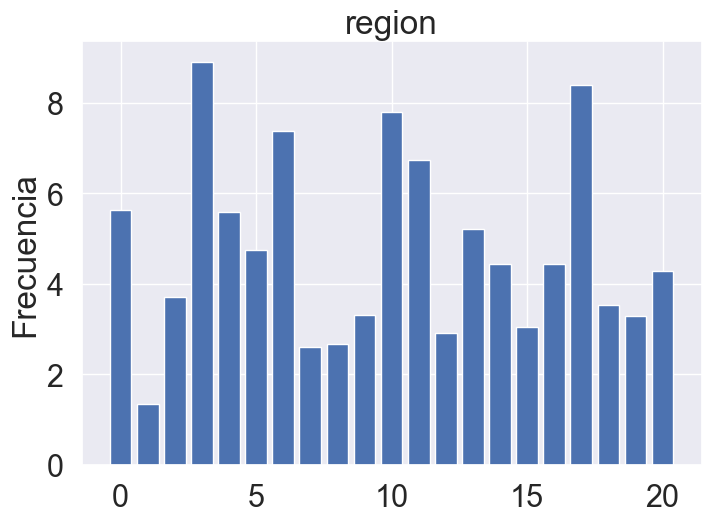

In [184]:
vis_var(df_mod_3,'region')

Tenemos una cantidad muy elevada de códigos de región, agruparemos por %.

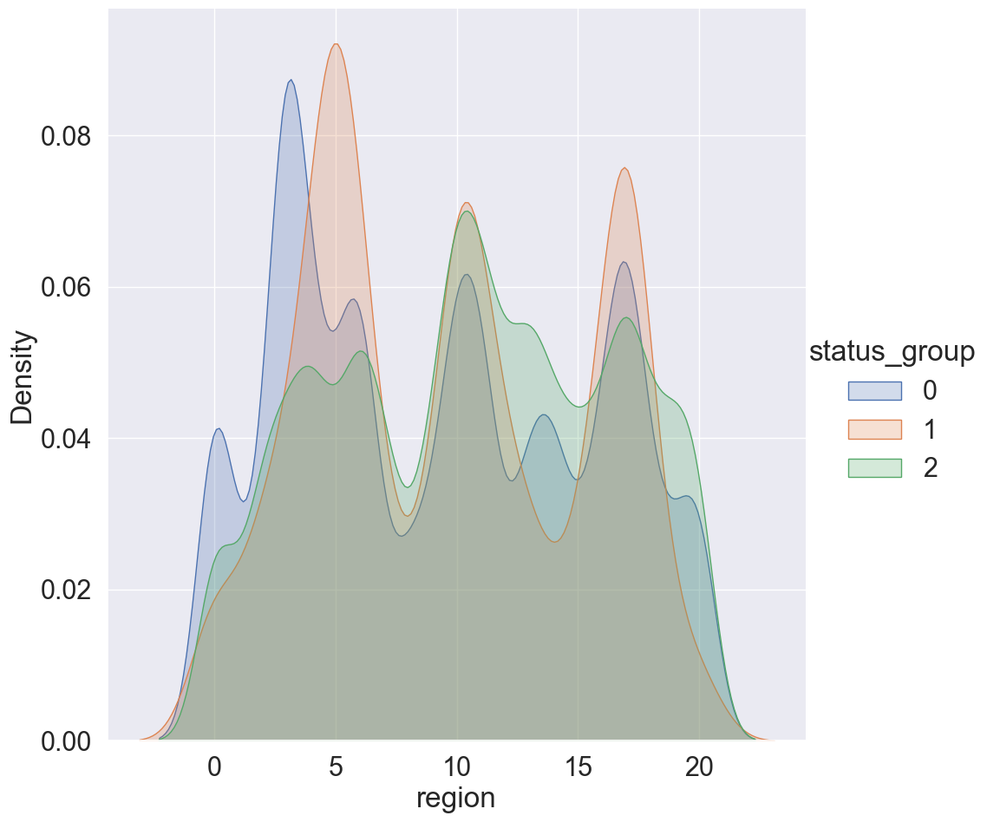

In [185]:
sns.FacetGrid(data=df_mod_3,hue='status_group',height=10).map(sns.kdeplot, 'region', shade=True).add_legend()

In [186]:
# Calcula el porcentaje de aparición de cada valor
value_counts = df_mod_3['region'].value_counts(normalize=True)

# Asigna clases según los porcentajes de aparición
def assign_class(percentage):
    if percentage > 0.08:
        return 0
    elif 0.07 < percentage <= 0.08:
        return 1
    elif 0.06 < percentage <= 0.07:
        return 2
    elif 0.05 < percentage <= 0.06:
        return 3
    elif 0.04 < percentage <= 0.05:
        return 4
    elif 0.03 < percentage <= 0.04:
        return 5
    elif 0.02 < percentage <= 0.03:
        return 6
    else:
        return 7

# Creamos un diccionario para mapear los porcentajes de aparición a las clases
percentage_to_class = {value: assign_class(percentage) for value, percentage in value_counts.items()}

# Asigna las clases a la columna 'region' utilizando el diccionario
df_mod_3['region_new'] = df_mod_3['region'].map(percentage_to_class)

In [187]:
corr = abs(df_mod_3.corr())
corr[['status_group']].sort_values(by = 'status_group',ascending = False)

,status_group
status_group,1.000000
waterpoint_type_new,0.210044
extraction_type_class_new,0.209448
waterpoint_type,0.206507
waterpoint_type_group,0.206431
waterpoint_type_group_new,0.196340
quantity_new,0.184209
extraction_type_class,0.175338
quality_group,0.153163
region_new,0.148222


Mejora ligeramente la correlación.

##### basin

basin
4    17.252525
5    15.050505
6    13.427609
0    13.106061
3    10.828283
8    10.079125
1     8.560606
7     7.563973
2     4.131313
Name: proportion, dtype: float64


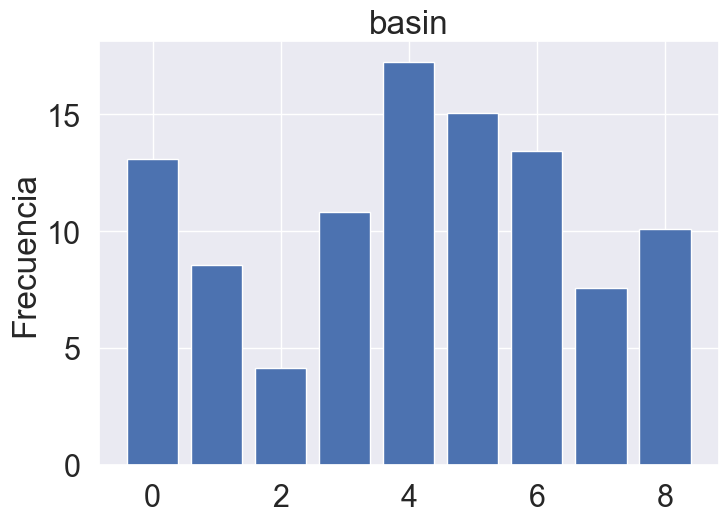

In [188]:
vis_var(df_mod_3,'basin')

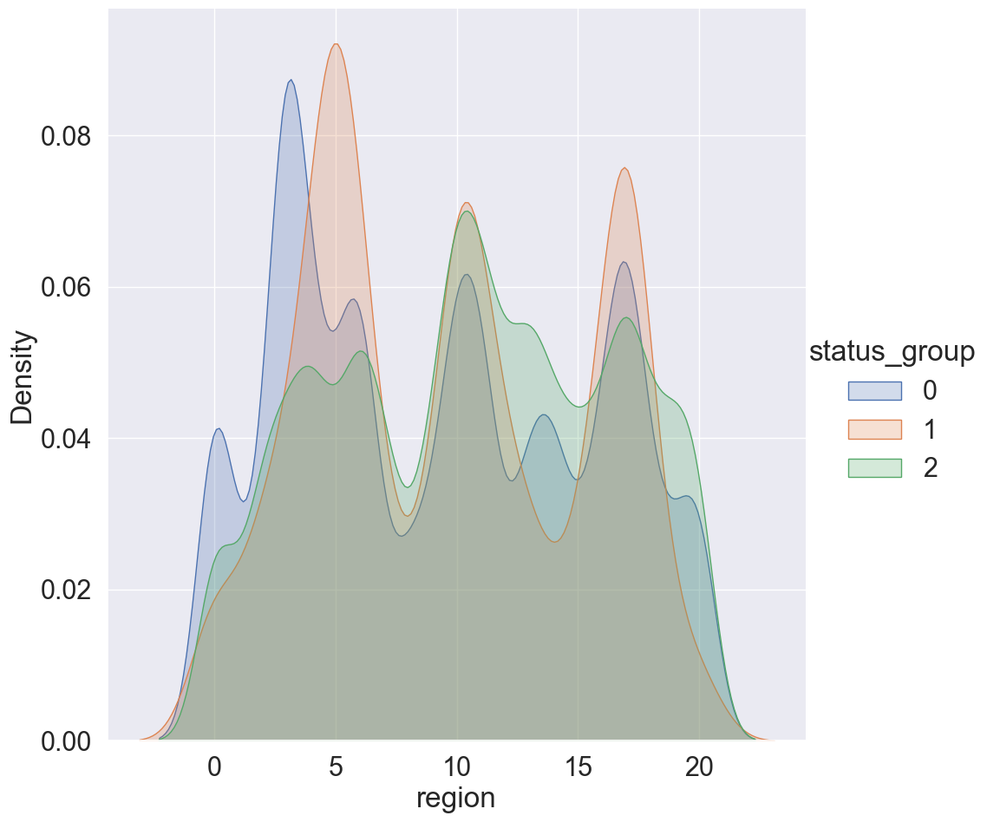

In [189]:
sns.FacetGrid(data=df_mod_3,hue='status_group',height=10).map(sns.kdeplot, 'region', shade=True).add_legend()

In [190]:
# Calcula el porcentaje de aparición de cada valor
value_counts = df_mod_3['basin'].value_counts(normalize=True)

# Asigna clases según los porcentajes de aparición
def assign_class(percentage):
    if percentage > 0.07:
        return 0
    elif 0.05 < percentage <= 0.07:
        return 1
    elif 0.03 < percentage <= 0.05:
        return 2
    else:
        return 3

# Creamos un diccionario para mapear los porcentajes de aparición a las clases
percentage_to_class = {value: assign_class(percentage) for value, percentage in value_counts.items()}

# Asigna las clases a la columna 'region_code' utilizando el diccionario
df_mod_3['basin_new'] = df_mod_3['basin'].map(percentage_to_class)

In [191]:
corr = abs(df_mod_3.corr())
corr[['status_group']].sort_values(by = 'status_group',ascending = False)

,status_group
status_group,1.000000
waterpoint_type_new,0.210044
extraction_type_class_new,0.209448
waterpoint_type,0.206507
waterpoint_type_group,0.206431
waterpoint_type_group_new,0.196340
quantity_new,0.184209
extraction_type_class,0.175338
quality_group,0.153163
region_new,0.148222


Mejora la correlación en 0.04

##### subvillage

In [192]:
df_mod_3.subvillage.nunique()

19288

Muchas clases... vamos a tramificar para buscar un patrón en los datos.

<Axes: xlabel='subvillage', ylabel='Density'>

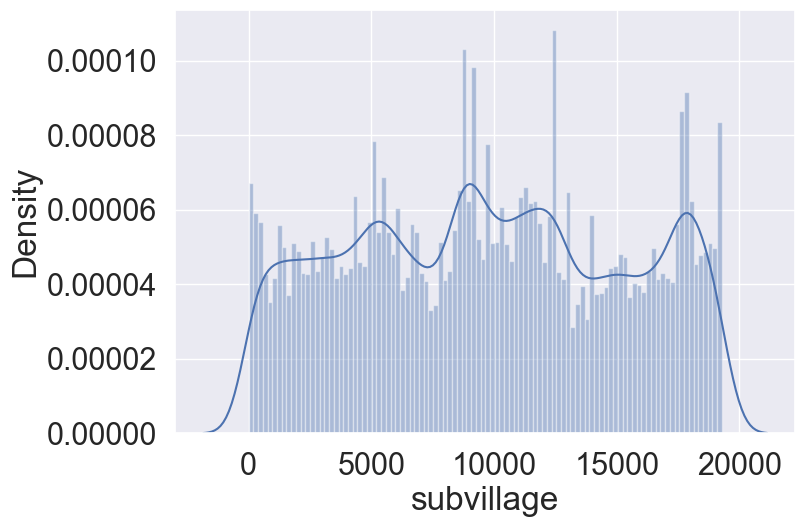

In [193]:
sns.distplot(df_mod_3['subvillage'], bins=100)

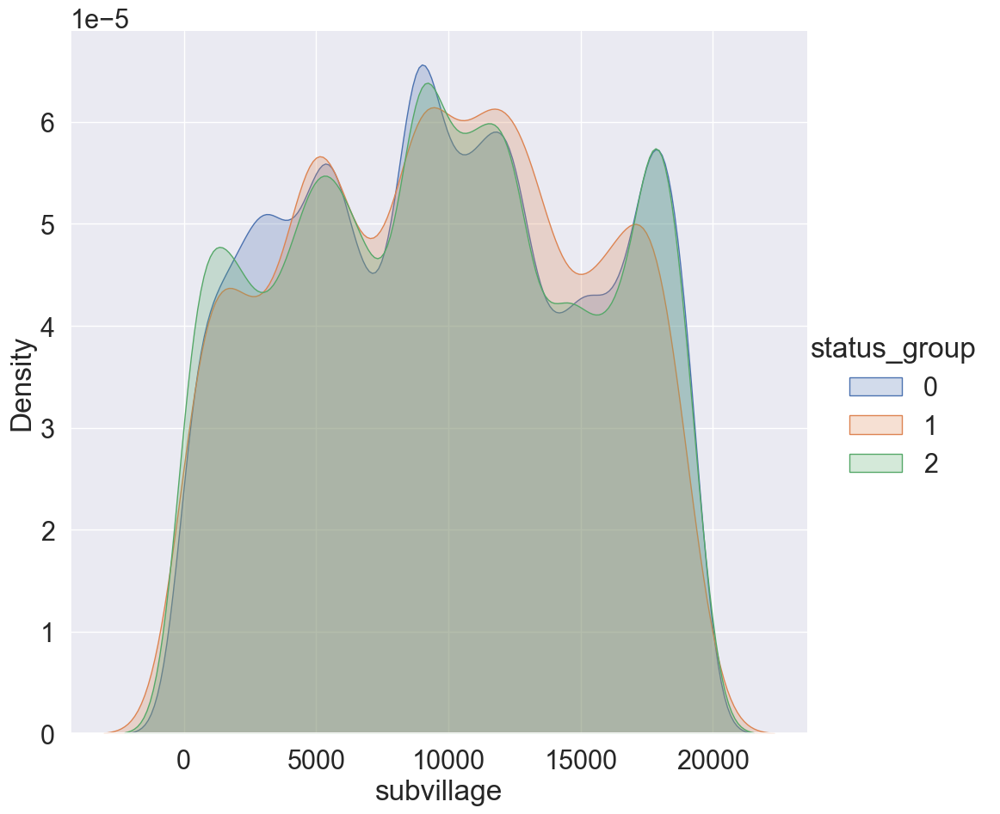

In [194]:
sns.FacetGrid(data=df_mod_3,hue='status_group',height=10).map(sns.kdeplot, 'subvillage', shade=True).add_legend()

Tenemos muchos grupos con una baja representatividad, es por ello agruparemos las variable siguiendo cantidad. Hay poblaciones con un número elevado de pozos, y algunos que, apenas, tienen 1, marcando la diferencia entre ciudades y aldeas.

In [195]:
df_mod_3.subvillage.value_counts()

subvillage
8768     508
17684    506
9074     502
5185     373
19287    371
        ... 
6431       1
1458       1
3093       1
5358       1
5892       1
Name: count, Length: 19288, dtype: int64

In [196]:
# Calcula el porcentaje de aparición de cada valor
value_counts = df_mod_3['subvillage'].value_counts()

# Asigna clases según los porcentajes de aparición
def assign_class(percentage):
    if percentage > 400:
        return 0
    elif 300< percentage <400:
        return 1
    elif 200 < percentage <= 300:
        return 2
    elif 100 < percentage <= 200:
        return 3
    elif 50 < percentage <= 100:
        return 4
    elif 10 < percentage <= 50:
        return 5
    elif 1 < percentage <= 10:
        return 6
    else:
        return 7

# Creamos un diccionario para mapear los porcentajes de aparición a las clases
percentage_to_class = {value: assign_class(percentage) for value, percentage in value_counts.items()}

# Asigna las clases a la columna 'region_code' utilizando el diccionario
df_mod_3['subvillage_new'] = df_mod_3['subvillage'].map(percentage_to_class)

In [197]:
corr = abs(df_mod_3.corr())
corr[['status_group']].sort_values(by = 'status_group',ascending = False)

,status_group
status_group,1.000000
waterpoint_type_new,0.210044
extraction_type_class_new,0.209448
waterpoint_type,0.206507
waterpoint_type_group,0.206431
waterpoint_type_group_new,0.196340
quantity_new,0.184209
extraction_type_class,0.175338
quality_group,0.153163
region_new,0.148222


Mejora en un grado elevado la correlación, en 0.05.

##### ward

Ambas variables representan códigos de localización.

In [198]:
df_mod_3.ward.nunique()

2092

<Axes: xlabel='ward', ylabel='Density'>

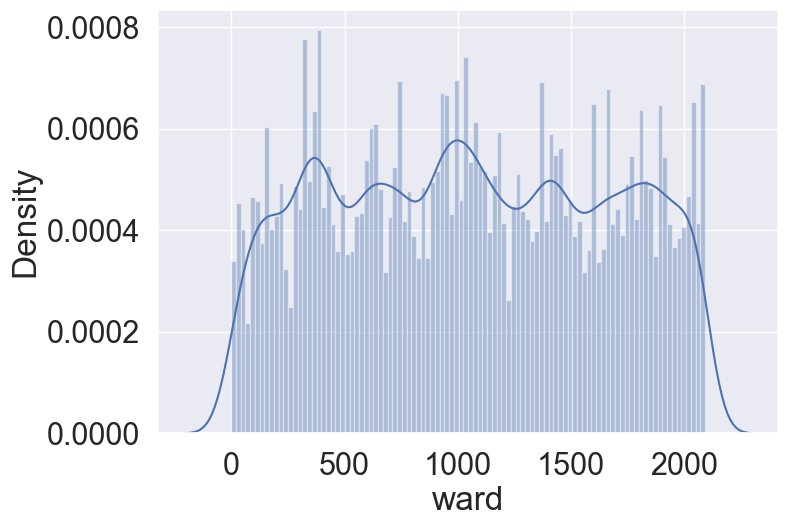

In [199]:
sns.distplot(df_mod_3['ward'], bins=100)

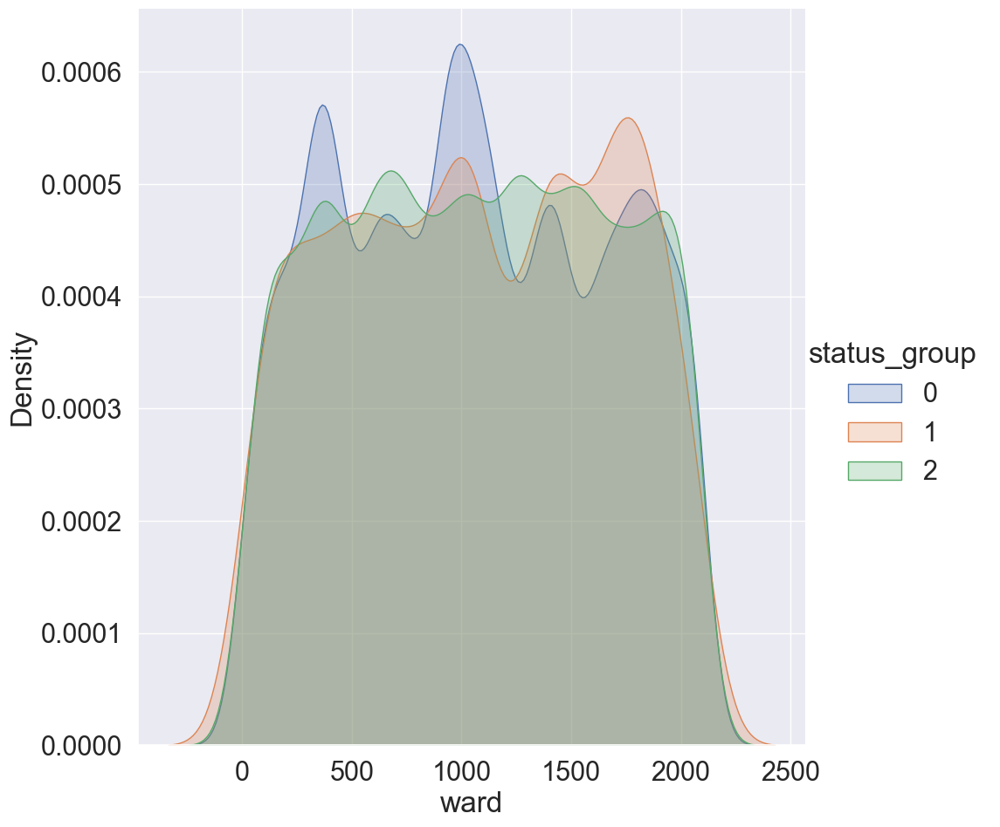

In [200]:
sns.FacetGrid(data=df_mod_3,hue='status_group',height=10).map(sns.kdeplot, 'ward', shade=True).add_legend()

La clase 0 se ve más afectada por la localización ward que las otras dos, en especial que la 1.

In [201]:
df_mod_3.ward.value_counts()

ward
324     307
386     252
1897    232
1183    231
1594    217
       ... 
1986      1
1961      1
2047      1
458       1
708       1
Name: count, Length: 2092, dtype: int64

Nos ocurre al igual que en el caso de la variable subvillage. Hay lozalizaciones con un número muy elevado de pozos, y otras con un número mucho más bajo.

In [202]:
# Calcula el porcentaje de aparición de cada valor
value_counts = df_mod_3['ward'].value_counts()

# Asigna clases según los porcentajes de aparición
def assign_class(percentage):
    if percentage > 200:
        return 0
    elif 150< percentage <200:
        return 1
    elif 100 < percentage <= 150:
        return 2
    elif 50 < percentage <= 100:
        return 3
    elif 25 < percentage <= 50:
        return 4
    elif 10 < percentage <= 25:
        return 5
    elif 1 < percentage <= 10:
        return 6
    else:
        return 7

# Creamos un diccionario para mapear los porcentajes de aparición a las clases
percentage_to_class = {value: assign_class(percentage) for value, percentage in value_counts.items()}

# Asigna las clases a la columna 'region_code' utilizando el diccionario
df_mod_3['ward_new'] = df_mod_3['ward'].map(percentage_to_class)

In [203]:
corr = abs(df_mod_3.corr())
corr[['status_group']].sort_values(by = 'status_group',ascending = False)

,status_group
status_group,1.000000
waterpoint_type_new,0.210044
extraction_type_class_new,0.209448
waterpoint_type,0.206507
waterpoint_type_group,0.206431
waterpoint_type_group_new,0.196340
quantity_new,0.184209
extraction_type_class,0.175338
quality_group,0.153163
ward_new,0.150986


Aumenta notablemente la correlación, a 0.15, lo cual nos muestra que es una variable importando para status.

##### lga

In [204]:
df_mod_3.lga.nunique()

125

Menor cantidad de variables que ward, veamos cómo podemos tramificarla.

<Axes: xlabel='lga', ylabel='Density'>

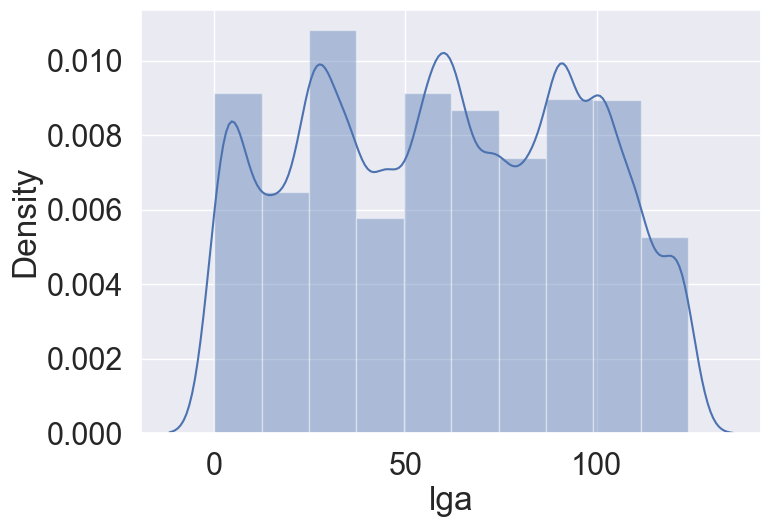

In [205]:
sns.distplot(df_mod_3['lga'], bins=10)

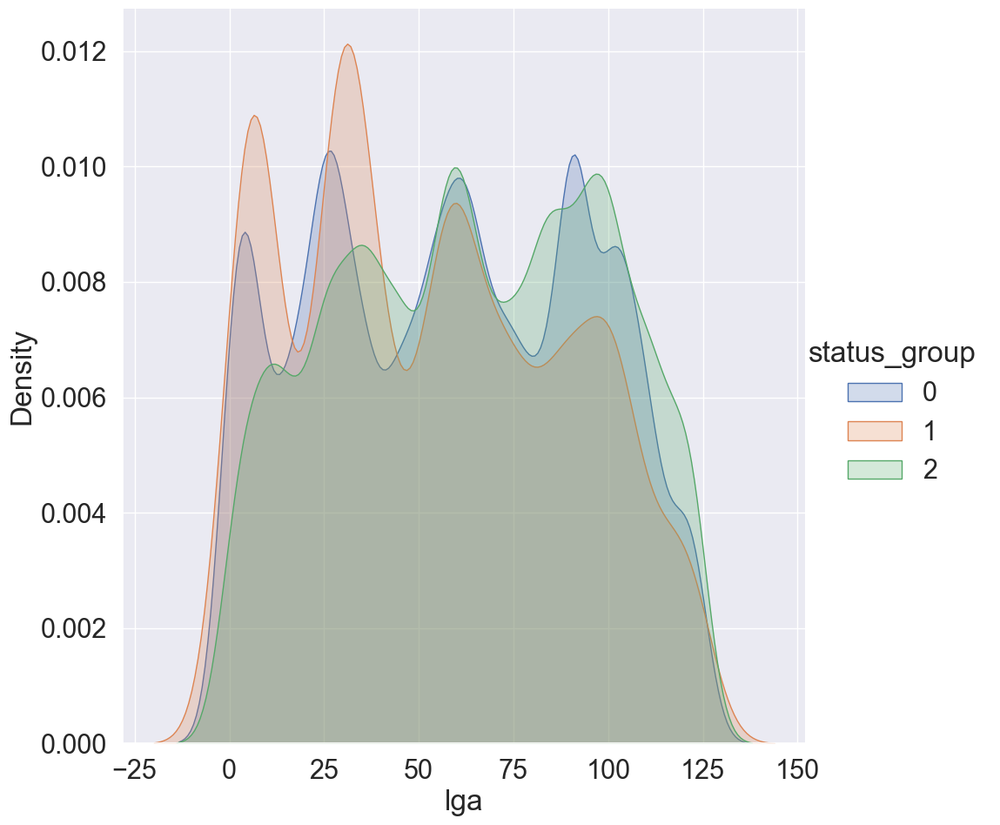

In [206]:
sns.FacetGrid(data=df_mod_3,hue='status_group',height=10).map(sns.kdeplot, 'lga', shade=True).add_legend()

Comportamientos ligeramente diferentes en función de la clase. Vamos que hay diferentes códigos de localización. Con muchos pozos y con pocos.

In [207]:
df_mod_3['lga'].value_counts()

lga
91     2503
0      1252
73     1251
5      1177
100    1106
       ... 
74       79
32       71
1        63
48       21
93        1
Name: count, Length: 125, dtype: int64

In [208]:
value_counts = df_mod_3['lga'].value_counts()

def assign_class(percentage):
    if percentage > 2000:
        return 0
    elif 1000< percentage <2000:
        return 1
    elif 500 < percentage <= 1000:
        return 2
    elif 250 < percentage <= 500:
        return 3
    elif 100 < percentage <= 250:
        return 4
    elif 50 < percentage <= 100:
        return 5
    else:
        return 6

percentage_to_class = {value: assign_class(percentage) for value, percentage in value_counts.items()}

df_mod_3['lga_new'] = df_mod_3['lga'].map(percentage_to_class)


In [209]:
corr = abs(df_mod_3.corr())
corr[['status_group']].sort_values(by = 'status_group',ascending = False)

,status_group
status_group,1.000000
waterpoint_type_new,0.210044
extraction_type_class_new,0.209448
waterpoint_type,0.206507
waterpoint_type_group,0.206431
...,...
subvillage,0.006562
longitude_tramificado,0.005364
num_private,0.005021
longitude,0.004814


Mejora notablemente la correlación, prácticamente en 0.07.

##### district_code

In [210]:
df_mod_3.district_code.nunique()

20

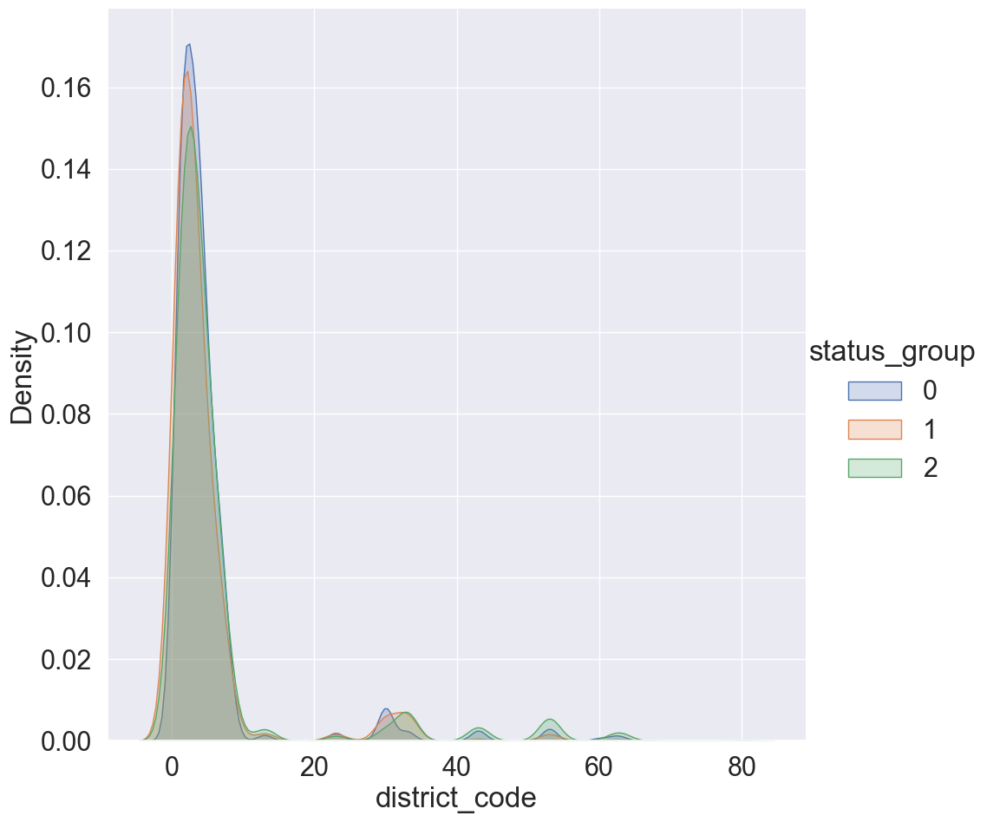

In [211]:
sns.FacetGrid(data=df_mod_3,hue='status_group',height=10).map(sns.kdeplot, 'district_code', shade=True).add_legend()

Comportamiento muy similar en los tres status.

In [212]:
df_mod_3['district_code'].value_counts()

district_code
1     12203
2     11173
3      9998
4      8999
5      4356
6      4074
7      3343
8      1043
30      995
33      874
53      745
43      505
13      391
23      293
63      195
62      109
60       63
0        23
80       12
67        6
Name: count, dtype: int64

In [213]:
value_counts = df_mod_3['district_code'].value_counts()

# Asigna clases según los porcentajes de aparición
def assign_class(percentage):
    if percentage > 10000:
        return 0
    elif 5000< percentage <10000:
        return 1
    elif 1000 < percentage <= 5000:
        return 2
    elif 500 < percentage <= 1000:
        return 3
    elif 50 < percentage <= 100:
        return 4
    else:
        return 5

# Creamos un diccionario para mapear los porcentajes de aparición a las clases
percentage_to_class = {value: assign_class(percentage) for value, percentage in value_counts.items()}

# Asigna las clases a la columna 'region_code' utilizando el diccionario
df_mod_3['district_code_new'] = df_mod_3['district_code'].map(percentage_to_class)


In [214]:
#pd.set_option('display.max_rows', None)
corr = abs(df_mod_3.corr())
corr[['status_group']].sort_values(by = 'status_group',ascending = False)

,status_group
status_group,1.000000
waterpoint_type_new,0.210044
extraction_type_class_new,0.209448
waterpoint_type,0.206507
waterpoint_type_group,0.206431
...,...
subvillage,0.006562
longitude_tramificado,0.005364
num_private,0.005021
longitude,0.004814


No aporta demasido esta tramificación, tiene una correlación en 0.02 menor a la original

In [215]:
#Función con todo el procesado realizado.
def feature_engineering_3(data):
    #record_duration:
    data['record_duration_new'] = data['record_duration'].apply(lambda x: 1 if x<=614 else 0)
    data['record_duration_median'] = data['record_duration'].apply(lambda x: 1 if x>614 and x<=1500 else 0)
    data['record_duration_old'] = data['record_duration'].apply(lambda x: 1 if x>1500 else 0)
    #construction_year
    data['construction_year_decada_60'] = data['construction_year'].apply(lambda x: 1 if x<=1969 else 0)
    data['construction_year_decada_70'] = data['construction_year'].apply(lambda x: 1 if x>1969 and x<=1979 else 0)
    data['construction_year_decada_80'] = data['construction_year'].apply(lambda x: 1 if x>1979 and x<=1989 else 0)
    data['construction_year_decada_90'] = data['construction_year'].apply(lambda x: 1 if x>1989 and x<=1999 else 0)
    data['construction_year_decada_2000'] = data['construction_year'].apply(lambda x: 1 if x>1999 and x<=2009 else 0)
    data['construction_year_2010'] = data['construction_year'].apply(lambda x: 1 if x==2010 else 0)
    data.drop(['construction_year','record_duration'],axis = 1,inplace=True)
    #installer
    installer_counts = data['installer'].value_counts()
    replace_indices = installer_counts[installer_counts < 50].index
    data.loc[data['installer'].isin(replace_indices), 'installer'] = 2145
    #gps_height
    data['gps_height_new']=data['gps_height'].apply(lambda x: 0 if x<0 else (1 if x==0 else (2 if x>1 and x<650 else (3 if x>=650 and x<2000 else 4))))
    #region_code
    value_counts = data['region_code'].value_counts(normalize=True)
    def assign_class(percentage):
        if percentage > 0.07:
            return 0
        elif 0.06 < percentage <= 0.07:
            return 1
        elif 0.05 < percentage <= 0.06:
            return 2
        elif 0.04 < percentage <= 0.05:
            return 3
        elif 0.03 < percentage <= 0.04:
            return 4
        elif 0.02 < percentage <= 0.03:
            return 5
        elif 0.01 < percentage <= 0.02:
            return 5
        else:
            return 6
    percentage_to_class = {value: assign_class(percentage) for value, percentage in value_counts.items()}
    data['region_code_new'] = data['region_code'].map(percentage_to_class)
    #region
    value_counts = data['region'].value_counts(normalize=True)
    def assign_class(percentage):
        if percentage > 0.08:
            return 0
        elif 0.07 < percentage <= 0.08:
            return 1
        elif 0.06 < percentage <= 0.07:
            return 2
        elif 0.05 < percentage <= 0.06:
            return 3
        elif 0.04 < percentage <= 0.05:
            return 4
        elif 0.03 < percentage <= 0.04:
            return 5
        elif 0.02 < percentage <= 0.03:
            return 6
        else:
            return 7
    percentage_to_class = {value: assign_class(percentage) for value, percentage in value_counts.items()}
    data['region_new'] = data['region'].map(percentage_to_class)
    #basin
    value_counts = data['basin'].value_counts(normalize=True)
    def assign_class(percentage):
        if percentage > 0.07:
            return 0
        elif 0.05 < percentage <= 0.07:
            return 1
        elif 0.03 < percentage <= 0.05:
            return 2
        else:
            return 3
    percentage_to_class = {value: assign_class(percentage) for value, percentage in value_counts.items()}
    data['basin_new'] = data['basin'].map(percentage_to_class)
    #subvillage
    value_counts = data['subvillage'].value_counts()
    def assign_class(percentage):
        if percentage > 400:
            return 0
        elif 300< percentage <400:
            return 1
        elif 200 < percentage <= 300:
            return 2
        elif 100 < percentage <= 200:
            return 3
        elif 50 < percentage <= 100:
            return 4
        elif 10 < percentage <= 50:
            return 5
        elif 1 < percentage <= 10:
            return 6
        else:
            return 7
    percentage_to_class = {value: assign_class(percentage) for value, percentage in value_counts.items()}
    data['subvillage_new'] = data['subvillage'].map(percentage_to_class)
    #ward
    value_counts = data['ward'].value_counts()
    def assign_class(percentage):
        if percentage > 200:
            return 0
        elif 150< percentage <200:
            return 1
        elif 100 < percentage <= 150:
            return 2
        elif 50 < percentage <= 100:
            return 3
        elif 25 < percentage <= 50:
            return 4
        elif 10 < percentage <= 25:
            return 5
        elif 1 < percentage <= 10:
            return 6
        else:
            return 7
    percentage_to_class = {value: assign_class(percentage) for value, percentage in value_counts.items()}
    data['ward_new'] = data['ward'].map(percentage_to_class)
    #lga
    value_counts = data['lga'].value_counts()
    def assign_class(percentage):
        if percentage > 2000:
            return 0
        elif 1000< percentage <2000:
            return 1
        elif 500 < percentage <= 1000:
            return 2
        elif 250 < percentage <= 500:
            return 3
        elif 100 < percentage <= 250:
            return 4
        elif 50 < percentage <= 100:
            return 5
        else:
            return 6    
    percentage_to_class = {value: assign_class(percentage) for value, percentage in value_counts.items()}
    data['lga_new'] = data['lga'].map(percentage_to_class)
    #district_code:
    value_counts = data['district_code'].value_counts()
    def assign_class(percentage):
        if percentage > 10000:
            return 0
        elif 5000< percentage <10000:
            return 1
        elif 1000 < percentage <= 5000:
            return 2
        elif 500 < percentage <= 1000:
            return 3
        elif 50 < percentage <= 100:
            return 4
        else:
            return 5
    percentage_to_class = {value: assign_class(percentage) for value, percentage in value_counts.items()}
    data['district_code_new'] = data['district_code'].map(percentage_to_class)
    return data

#### Modelización

Con toda estas modificaciones, vamos a ver si nos aportan rendimiento al modelo, probaremos, en este caso, tanto RandomForest como voting, posteriormente aplicaremos hiperparámetros y balanceado de datos.

##### RandomForest

In [216]:
X_train_4,X_test_4,y_train_4,y_test_4 = particion_datos(df_mod_3,'status_group',0.2,None)

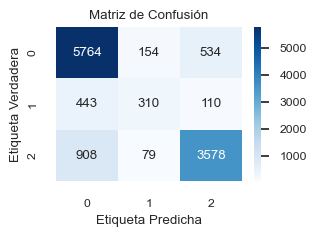

ACCURACY
Accuracy promedio: 
0.8124579124579124
PRECISION
Precisión por cada clase: 
[0.81011947 0.57090239 0.84746566]
Precisión promedio del modelo: 
0.8124579124579124
RECALL
Recall por cada clase: 
[0.8933664  0.35921205 0.7837897 ]
Recall promedio del modelo: 
0.8124579124579124
F1
F1 por cada clase: 
[0.84970885 0.44096728 0.81438489]
F1 promedio del modelo: 
0.8124579124579124


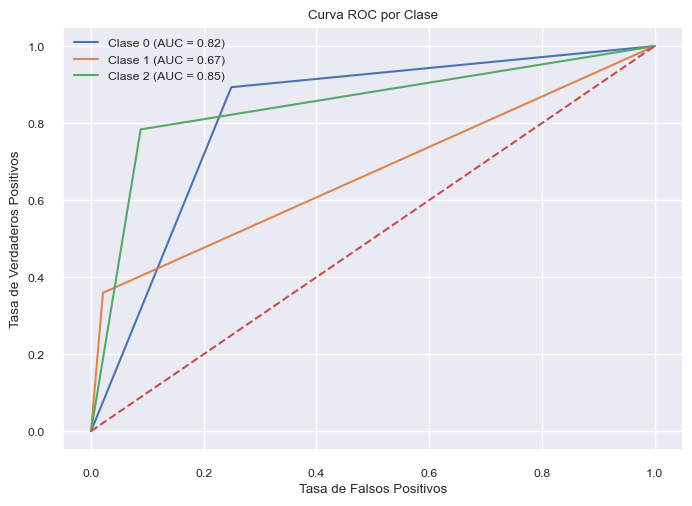

In [217]:
model_6_random = RandomForestClassifier()
model_6_random.fit(X_train_4,y_train_4)
random_predict_6 = model_6_random.predict(X_test_4)

saca_metricas(y_test_4, random_predict_6)

Mejoramos las métricas en 0.08 respecto a las obtenidas con la anterior tramificación. Vamos a probar el modelo den la fase de test en la plataforma.

No ha dado tan buen resultado en el testeo. Probaremos balanceando los datos, con hiperparámetros, y, posteriormente con voting.
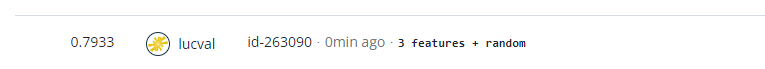

##### Balanceamos los datos

In [218]:
print('Distribución de las clases previa aplicación del SMOTE')
print("Before OverSampling, counts of label '1': {}".format(sum(df_mod_3.status_group==1)))
print("Before OverSampling, counts of label '0': {} \n".format(sum(df_mod_3.status_group==0)))
print("Before OverSampling, counts of label '2': {} \n".format(sum(df_mod_3.status_group==2)))

sampling_strategy = {0: 32259, 1: 6452, 2: 22824}#Establecemos la proporción de nuestros datos.
sm = SMOTE(random_state=2,sampling_strategy=sampling_strategy)
df_res, y_res = sm.fit_resample(df_mod_3, df_mod_3.status_group.ravel())

print('Distribución de las clases después de la aplicación de SMOTE')
print('After OverSampling, the shape of train_X: {}'.format(df_res.shape))
print('After OverSampling, the shape of train_y: {} \n'.format(y_res.shape))

print("After OverSampling, counts of label '1': {}".format(sum(y_res==1)))
print("After OverSampling, counts of label '0': {}".format(sum(y_res==0)))
print("After OverSampling, counts of label '2': {}".format(sum(y_res==2)))

Distribución de las clases previa aplicación del SMOTE
Before OverSampling, counts of label '1': 4317
Before OverSampling, counts of label '0': 32259 

Before OverSampling, counts of label '2': 22824 

Distribución de las clases después de la aplicación de SMOTE
After OverSampling, the shape of train_X: (61535, 62)
After OverSampling, the shape of train_y: (61535,) 

After OverSampling, counts of label '1': 6452
After OverSampling, counts of label '0': 32259
After OverSampling, counts of label '2': 22824


In [219]:
X_train_5,X_test_5,y_train_5,y_test_5 = particion_datos(df_res,'status_group',0.2,None)

##### Random Forest

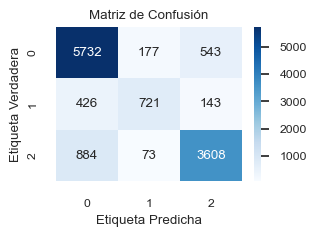

ACCURACY
Accuracy promedio: 
0.8175022345006907
PRECISION
Precisión por cada clase: 
[0.8139733  0.74253347 0.8402422 ]
Precisión promedio del modelo: 
0.8175022345006907
RECALL
Recall por cada clase: 
[0.8884067  0.55891473 0.79036145]
Recall promedio del modelo: 
0.8175022345006907
F1
F1 por cada clase: 
[0.84956277 0.6377709  0.81453889]
F1 promedio del modelo: 
0.8175022345006907


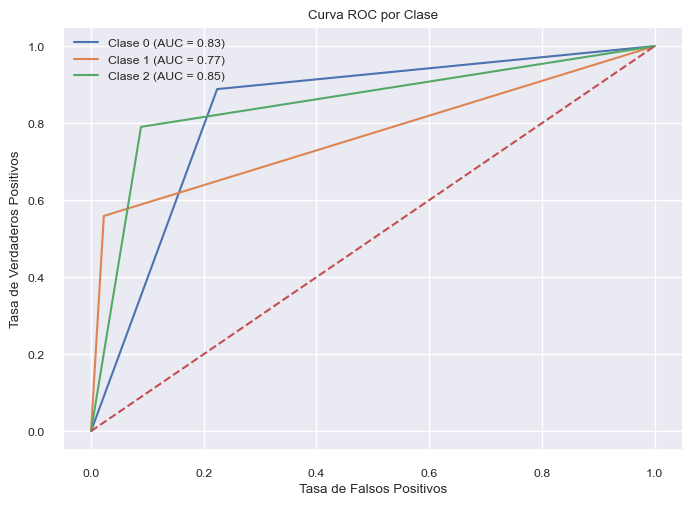

In [220]:
model_7_random = RandomForestClassifier(n_estimators=1000, max_depth=500)
model_7_random.fit(X_train_5,y_train_5)
random_predict_bal_2 = model_7_random.predict(X_test_5)

saca_metricas(y_test_5, random_predict_bal_2)

El balanceo de los datos he mejorado las métricas generales en 0.07. Probaremos el modelo voting.

##### voting balanceado

Evaluamos los hiperparámetros para aplicar voting con balanceo e hiperparámetros.

In [221]:
grid_param = {
    'n_estimators': [1,1000],
    'max_depth': [1,500]
}

In [222]:
model_grid = GridSearchCV(estimator=model_7_random,
                     param_grid=grid_param,
                     scoring='f1_micro',
                     cv=5,
                     n_jobs=-1)

In [223]:
model_grid.fit(X_train_5, y_train_5)
print(model_grid.best_params_)
print(model_grid.best_score_)

{'max_depth': 500, 'n_estimators': 1000}
0.8077109497433662


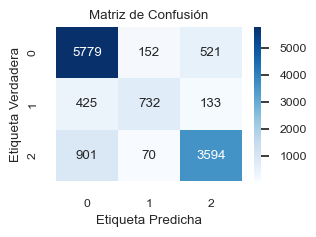

ACCURACY
Accuracy promedio: 
0.8210774356057529
PRECISION
Precisión por cada clase: 
[0.81337087 0.7672956  0.8460452 ]
Precisión promedio del modelo: 
0.8210774356057529
RECALL
Recall por cada clase: 
[0.89569126 0.56744186 0.78729463]
Recall promedio del modelo: 
0.8210774356057529
F1
F1 por cada clase: 
[0.8525485  0.65240642 0.8156133 ]
F1 promedio del modelo: 
0.8210774356057529


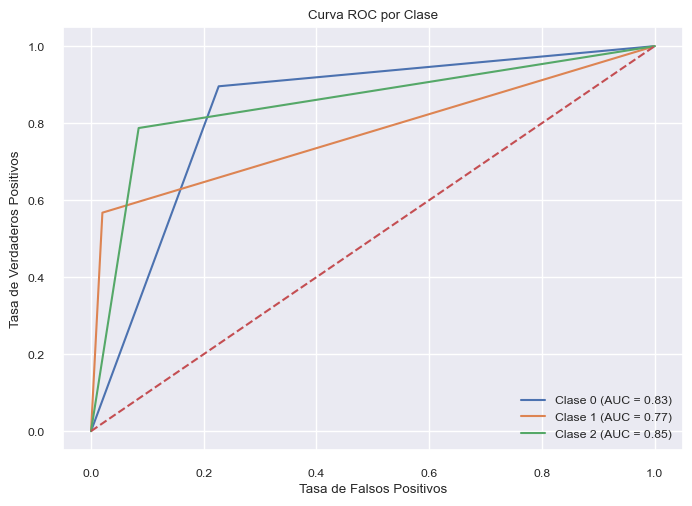

In [224]:
#Definimos los clasificadores
clf1 = ExtraTreesClassifier(n_estimators=1000, random_state=42)
clf2 = RandomForestClassifier(n_estimators=1000, max_depth=500, random_state=42)
clf3 = XGBClassifier()

voting_clf = VotingClassifier(
    estimators=[('lr', clf1), ('rf', clf2), ('et', clf3)],
    voting='soft'  # Voto suave (voto ponderado por las probabilidades de clase)
)

voting_clf.fit(X_train_5, y_train_5)

# Evaluamos el rendimiento
y_pred_clf_3 = voting_clf.predict(X_test_5)

saca_metricas(y_test_5, y_pred_clf_3)

In [226]:
df_test_5 = df_1.copy()
df_test_5 = preprocesado(df_test_5)
df_test_5 = numerico(df_test_5)
df_test_5 = feature_engineering(df_test_5)
df_test_5 = feature_engineering_2(df_test_5)
df_test_5 = feature_engineering_3(df_test_5)

In [227]:
clf_test_3 = voting_clf.predict(df_test_5)
df_envio = pd.concat([df_1['id'],pd.Series(clf_test_3)], axis = 1)
#Cambiamos el nombre de la columna a status_group
df_envio.columns.values[1] = "status_group"
# Reemplazar los valores en la primera columna usando iloc
df_envio.iloc[:, 1] = df_envio.iloc[:, 1].replace({0:'functional', 1:'functional needs repair', 2: 'non functional'})
df_envio.to_csv('subida_clf_3',index=False)

No funciona tan bien en términos de testeo, hemos incurrido en sobreajuste, da peor resultado que Random solamente, además de bajar el rendimiento del modelo visto en la anterior tramificación.

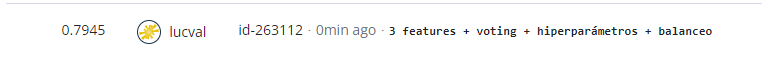

## Feature_engineering_ 4

Vamos a ordenar por orden de importancia nuestras variables tramificadas para el modelo, y haremos limpieza.

In [228]:
feature_importances = {}


max_features = min(len(df_mod_3.columns), max(len(clf.feature_importances_) for clf in voting_clf.estimators_))

# Itera sobre cada estimador en el clasificador de votación
for clf in voting_clf.estimators_:
    if hasattr(clf, "feature_importances_"):
        # Itera sobre cada característica y su importancia
        for i in range(max_features):
            # Verifica que el índice de la característica sea válido
            if i < len(clf.feature_importances_):
                # Obtiene el nombre de la característica
                feature_name = df_mod_3.columns[i]  # Reemplaza df con tu DataFrame
                # Agrega la importancia de la característica al diccionario
                if feature_name in feature_importances:
                    feature_importances[feature_name].append(clf.feature_importances_[i])
                else:
                    feature_importances[feature_name] = [clf.feature_importances_[i]]

# Calcula el promedio de las importancias de cada característica
average_importances = {}
for feature, importances in feature_importances.items():
    average_importance = np.mean(importances)
    average_importances[feature] = average_importance

# Ordena el diccionario de importancias por valor en orden descendente
sorted_importances = sorted(average_importances.items(), key=lambda x: x[1], reverse=True)

# Imprime las variables en orden descendente de importancia
for feature, importance in sorted_importances:
    print(f"{feature}, Promedio de Importancia: {importance}")

waterpoint_type_group, Promedio de Importancia: 0.09377900587677661
quality_group, Promedio de Importancia: 0.04737120180382515
installer, Promedio de Importancia: 0.04710337232973517
longitude, Promedio de Importancia: 0.04613863761722813
quantity_new, Promedio de Importancia: 0.03823061993177732
latitude, Promedio de Importancia: 0.03551499341599253
basin, Promedio de Importancia: 0.03206067837801273
extraction_type_new, Promedio de Importancia: 0.028056850552471622
funder, Promedio de Importancia: 0.027089031179122064
source_class, Promedio de Importancia: 0.025117338014813122
lga, Promedio de Importancia: 0.021502105059464593
payment_new, Promedio de Importancia: 0.020476410834460872
amount_tsh, Promedio de Importancia: 0.020120879216459848
ward, Promedio de Importancia: 0.019242398958566918
waterpoint_type_group_new, Promedio de Importancia: 0.017530779089153615
construction_year_2010, Promedio de Importancia: 0.016958110054765243
basin_new, Promedio de Importancia: 0.016660057643

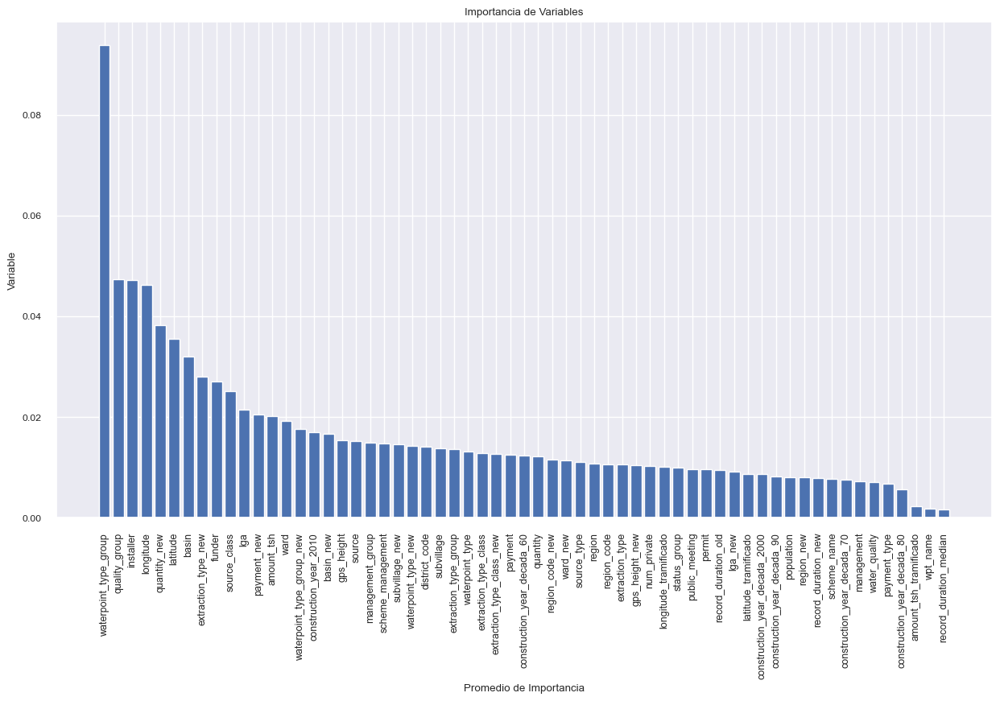

In [229]:
# Extrae las variables y sus promedios de importancia ordenados
variables = [item[0] for item in sorted_importances]
importancias = [item[1] for item in sorted_importances]

# Crea el gráfico de barras
plt.figure(figsize=(15, 8))
plt.bar(variables, importancias)
plt.xlabel('Promedio de Importancia')
plt.ylabel('Variable')
plt.title('Importancia de Variables')
plt.xticks(rotation=90,fontsize=9) 
plt.show()


##### waterpoint_type_group

Es la variable más importante de nuestro modelo y no la habíamos tramificado, por lo que vamos a tramificarla.

In [230]:
df_mod_4 = df_mod_3.copy()

In [231]:
df_mod_4.waterpoint_type_group.value_counts()

waterpoint_type_group
1    34625
3    17488
5     6380
4      784
0      116
2        7
Name: count, dtype: int64

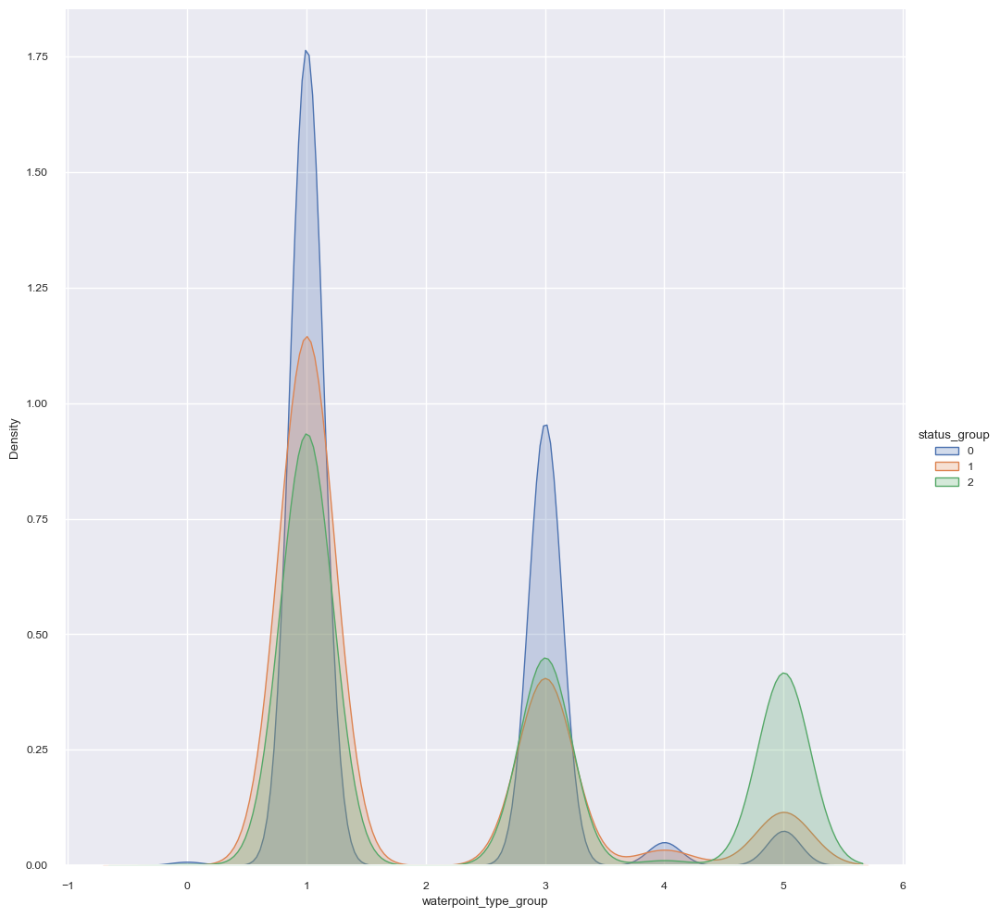

In [232]:
sns.FacetGrid(data=df_mod_4,hue='status_group',height=10).map(sns.kdeplot, 'waterpoint_type_group', shade=True).add_legend()

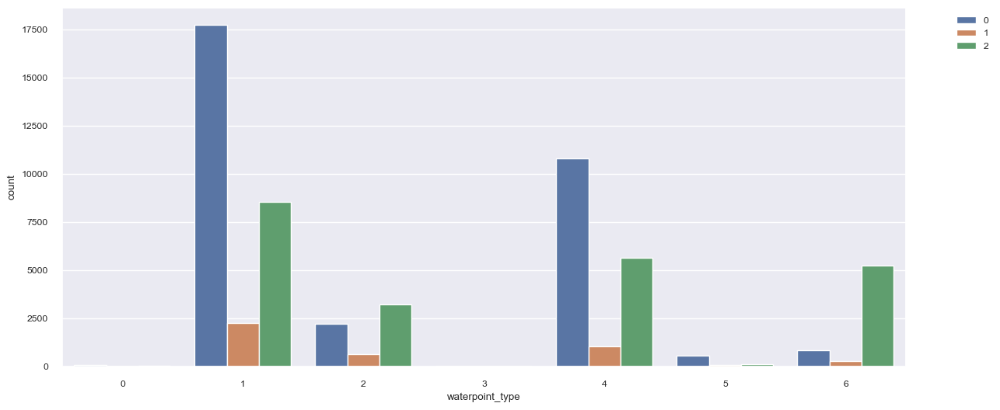

In [233]:
plt.figure(figsize=(14,6))
sns.countplot(data=df_mod_4,x='waterpoint_type',hue='status_group')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

Agruparemos las 7 clases en 3.

In [234]:
df_mod_4['waterpoint_type_new']=df_mod_4['waterpoint_type'].apply(lambda x: 1 if x==1 or x==4 or x== 5 else (2 if x==2 or x==6 else 3))

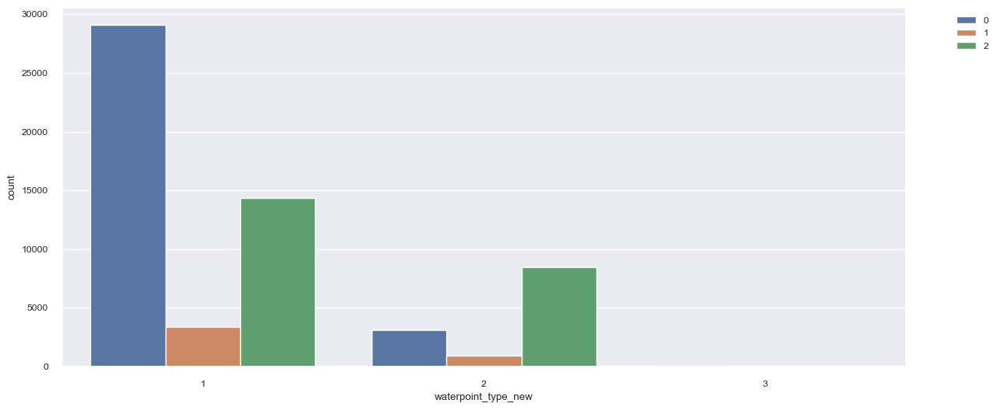

In [235]:
plt.figure(figsize=(14,6))
sns.countplot(data=df_mod_4,x='waterpoint_type_new',hue='status_group')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

##### quality_group

In [236]:
df_mod_4.quality_group.value_counts()

quality_group
2    50818
4     5195
5     1876
3      804
0      490
1      217
Name: count, dtype: int64

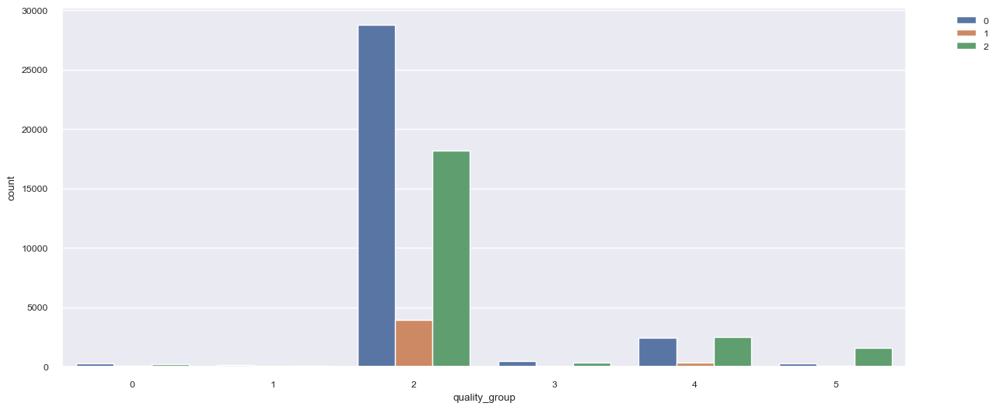

In [237]:
plt.figure(figsize=(14,6))
sns.countplot(data=df_mod_3,x='quality_group',hue='status_group')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

Agruparemos las 6 clases en 3 en función de % y comportamiento en función del estado del pozo.

In [238]:
df_mod_4['quality_group_new']=df_mod_4['quality_group'].apply(lambda x: 2 if x==2 else (3 if x==3 or x==4 or x==0 else 5))

In [239]:
corr = abs(df_mod_4.corr())
corr[['status_group']].sort_values(by = 'status_group',ascending = False)

,status_group
status_group,1.000000
waterpoint_type_new,0.311353
extraction_type_class_new,0.209448
waterpoint_type,0.206507
waterpoint_type_group,0.206431
...,...
subvillage,0.006562
longitude_tramificado,0.005364
num_private,0.005021
longitude,0.004814


##### installer

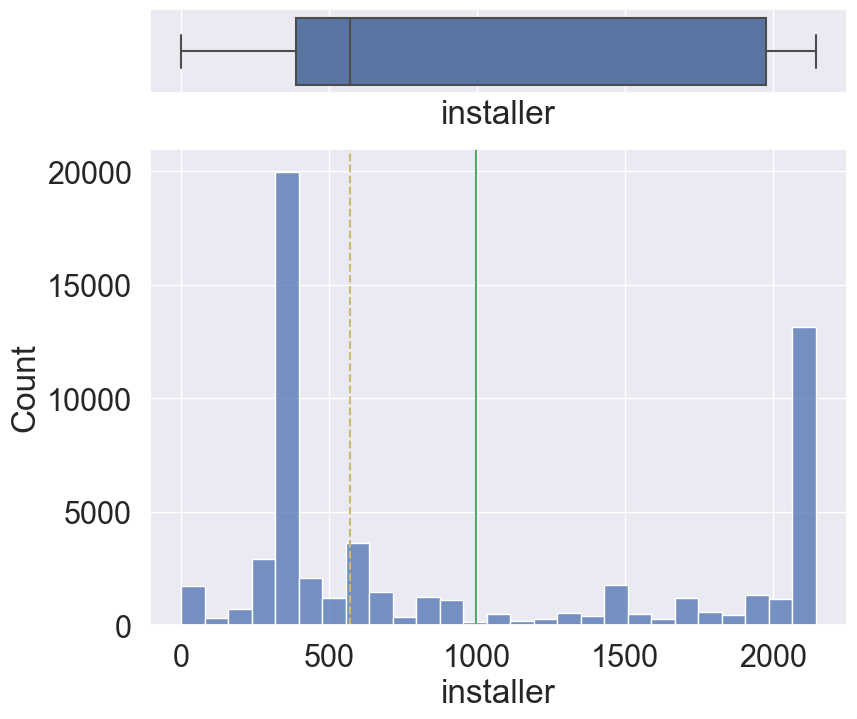

In [240]:
histogram_boxplot(df_mod_4.installer)

In [241]:
df_mod_4['installer'].value_counts(normalize=True)*100

installer
390     29.296296
2145    15.659933
2131     6.154882
571      3.072391
1474     2.030303
          ...    
2136     0.087542
1434     0.087542
1479     0.087542
952      0.087542
197      0.084175
Name: proportion, Length: 146, dtype: float64

In [254]:
value_counts = df_mod_4['installer'].value_counts(normalize=True)
def assign_class(percentage):
    if percentage > 0.25:
        return 0
    elif 0.1 < percentage <= 0.25:
        return 1
    elif 0.05 < percentage <= 0.1:
        return 2
    elif 0.02 < percentage <= 0.05:
        return 3
    elif 0.01 < percentage <= 0.02:
        return 4
    else:
        return 7
percentage_to_class = {value: assign_class(percentage) for value, percentage in value_counts.items()}
df_mod_4['installer_new'] = df_mod_4['installer'].map(percentage_to_class)

Muchas clases con poco % de representatividad. Haremos un grupo con aquellos que tengan representatividad inferior al 1 %, agrupando el ototal en 6 grupos.

In [255]:
corr = abs(df_mod_4.corr())
corr[['status_group']].sort_values(by = 'status_group',ascending = False)

,status_group
status_group,1.000000
waterpoint_type_new,0.311353
extraction_type_class_new,0.209448
waterpoint_type,0.206507
waterpoint_type_group,0.206431
...,...
subvillage,0.006562
longitude_tramificado,0.005364
num_private,0.005021
longitude,0.004814


In [256]:
def feature_engineering_4(data):
    data['waterpoint_type_new']=data['waterpoint_type'].apply(lambda x: 1 if x==1 or x==4 or x== 5 else (2 if x==2 or x==6 else 3))
    data['quality_group_new']=data['quality_group'].apply(lambda x: 2 if x==2 else (3 if x==3 or x==4 or x==0 else 5))
    value_counts = data['installer'].value_counts(normalize=True)
    def assign_class(percentage):
        if percentage > 0.25:
            return 0
        elif 0.1 < percentage <= 0.25:
            return 1
        elif 0.05 < percentage <= 0.1:
            return 2
        elif 0.02 < percentage <= 0.05:
            return 3
        elif 0.01 < percentage <= 0.02:
            return 4
        else:
            return 7
    percentage_to_class = {value: assign_class(percentage) for value, percentage in value_counts.items()}
    data['installer_new'] = data['installer'].map(percentage_to_class)
    return data   

### Random Forest

In [258]:
X_train_5,X_test_5,y_train_5,y_test_5 = particion_datos(df_mod_4,'status_group',0.2,None)

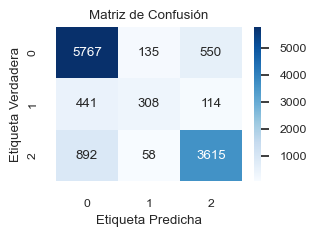

ACCURACY
Accuracy promedio: 
0.8156565656565656
PRECISION
Precisión por cada clase: 
[0.81225352 0.61477046 0.84482356]
Precisión promedio del modelo: 
0.8156565656565656
RECALL
Recall por cada clase: 
[0.89383137 0.35689455 0.79189485]
Recall promedio del modelo: 
0.8156565656565656
F1
F1 por cada clase: 
[0.85109209 0.4516129  0.81750339]
F1 promedio del modelo: 
0.8156565656565656


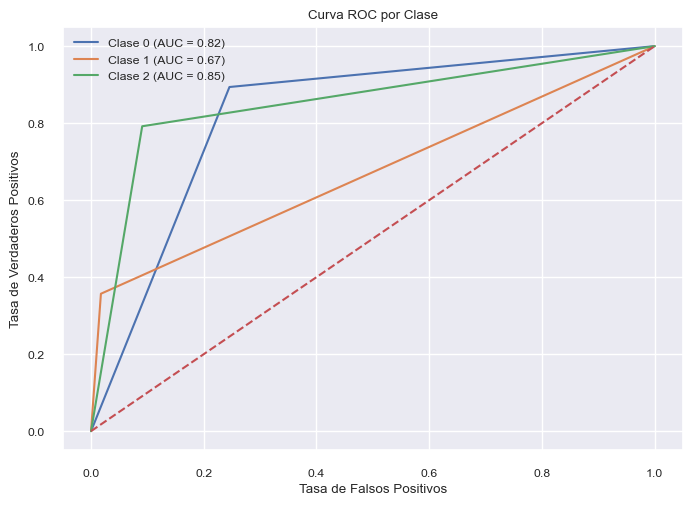

In [259]:
model_8_random = RandomForestClassifier(n_estimators=1000, max_depth=500)
model_8_random.fit(X_train_5,y_train_5)
random_predict_8 = model_8_random.predict(X_test_5)

saca_metricas(y_test_5, random_predict_8)

In [260]:
df_test_6 = df_1.copy()
df_test_6 = preprocesado(df_test_6)
df_test_6 = numerico(df_test_6)
df_test_6 = feature_engineering(df_test_6)
df_test_6 = feature_engineering_2(df_test_6)
df_test_6 = feature_engineering_3(df_test_6)
df_test_6 = feature_engineering_4(df_test_6)

In [261]:
random_predict_test_4 = model_8_random.predict(df_test_6)
df_envio = pd.concat([df_1['id'],pd.Series(random_predict_test_4)], axis = 1)
#Cambiamos el nombre de la columna a status_group
df_envio.columns.values[1] = "status_group"
# Reemplazar los valores en la primera columna usando iloc
df_envio.iloc[:, 1] = df_envio.iloc[:, 1].replace({0:'functional', 1:'functional needs repair', 2: 'non functional'})
df_envio.to_csv('subida_random_8',index=False)

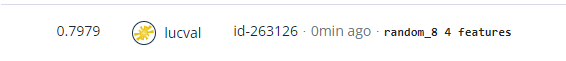

Esta última tramificación nos ha hecho bajar las medias generales del modelo. Probaremos con voting e hiperparámetros, ya que en la segunda transformación nos ha dado muy buen resultado.

##### Voting

In [262]:
clf1 = ExtraTreesClassifier(n_estimators=1000, random_state=42)
clf2 = RandomForestClassifier(n_estimators=1000, max_depth=500, random_state=42)
clf3 = XGBClassifier()

voting_clf = VotingClassifier(
    estimators=[('lr', clf1), ('rf', clf2), ('et', clf3)],
    voting='soft'  # Voto suave (voto ponderado por las probabilidades de clase)
)

voting_clf.fit(X_train_5, y_train_5)

VotingClassifier(estimators=[('lr',
                              ExtraTreesClassifier(bootstrap=False,
                                                   ccp_alpha=0.0,
                                                   class_weight=None,
                                                   criterion='gini',
                                                   max_depth=None,
                                                   max_features='sqrt',
                                                   max_leaf_nodes=None,
                                                   max_samples=None,
                                                   min_impurity_decrease=0.0,
                                                   min_samples_leaf=1,
                                                   min_samples_split=2,
                                                   min_weight_fraction_leaf=0.0,
                                                   monotonic_cst=None,
                                                   n_estimators=1000,
                                                   n_jobs=None, oob_score=Fals...
                                            learning_rate=None, max_bin=None,
                                            max_cat_threshold=None,
                                            max_cat_to_onehot=None,
                                            max_delta_step=None, max_depth=None,
                                            max_leaves=None,
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=None, n_jobs=None,
                                            num_parallel_tree=None,
                                            objective='binary:logistic', ...))],
                 flatten_transform=True, n_jobs=None, verbose=False,
                 voting='soft', weights=None)

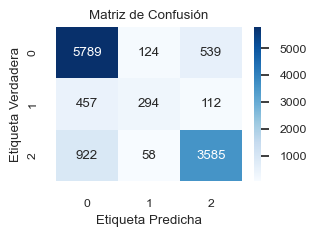

ACCURACY
Accuracy promedio: 
0.8138047138047138
PRECISION
Precisión por cada clase: 
[0.80761719 0.61764706 0.84631728]
Precisión promedio del modelo: 
0.8138047138047138
RECALL
Recall por cada clase: 
[0.89724117 0.34067207 0.78532311]
Recall promedio del modelo: 
0.8138047138047138
F1
F1 por cada clase: 
[0.85007342 0.43913368 0.81468015]
F1 promedio del modelo: 
0.8138047138047138


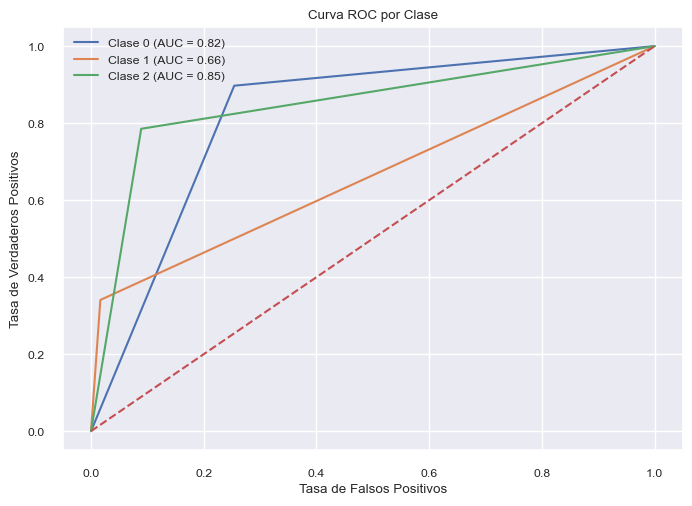

In [263]:
y_pred_clf_4 = voting_clf.predict(X_test_5)

saca_metricas(y_test_5, y_pred_clf_4)

In [264]:
clf_test_4 = voting_clf.predict(df_test_6)
df_envio = pd.concat([df_1['id'],pd.Series(clf_test_4)], axis = 1)
#Cambiamos el nombre de la columna a status_group
df_envio.columns.values[1] = "status_group"
# Reemplazar los valores en la primera columna usando iloc
df_envio.iloc[:, 1] = df_envio.iloc[:, 1].replace({0:'functional', 1:'functional needs repair', 2: 'non functional'})
df_envio.to_csv('subida_clf_4',index=False)

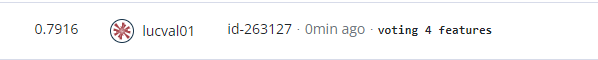

Valores más elevados en nuestro dataset, pero en el test de la plataforma más bajos que los obtenidos con RandomForest.

##### balanceamos los datos

In [265]:
sampling_strategy = {0: 32259, 1: 6452, 2: 22824}#Establecemos la proporción de nuestros datos.
sm = SMOTE(random_state=2,sampling_strategy=sampling_strategy)
df_res, y_res = sm.fit_resample(df_mod_4, df_mod_4.status_group.ravel())

In [266]:
X_train_7,X_test_7,y_train_7,y_test_7 = particion_datos(df_res,'status_group',0.2,None)

In [267]:
voting_clf.fit(X_train_7, y_train_7)
clf_test_5 = voting_clf.predict(df_test_6)
df_envio = pd.concat([df_1['id'],pd.Series(clf_test_5)], axis = 1)
#Cambiamos el nombre de la columna a status_group
df_envio.columns.values[1] = "status_group"
# Reemplazar los valores en la primera columna usando iloc
df_envio.iloc[:, 1] = df_envio.iloc[:, 1].replace({0:'functional', 1:'functional needs repair', 2: 'non functional'})
df_envio.to_csv('subida_clf_5',index=False)

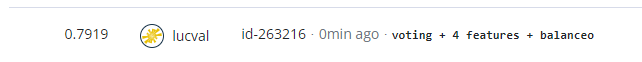

Mejoramos ligeramente al valor obtenido sin balancear los datos, pero por debajo en 0.2 en la segunda tramificación que realizamos. Probamos con Random Forest.

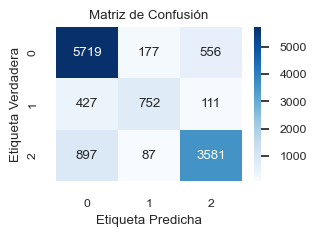

ACCURACY
Accuracy promedio: 
0.8167709433655643
PRECISION
Precisión por cada clase: 
[0.81201193 0.74015748 0.84298493]
Precisión promedio del modelo: 
0.8167709433655643
RECALL
Recall por cada clase: 
[0.88639182 0.58294574 0.78444688]
Recall promedio del modelo: 
0.8167709433655643
F1
F1 por cada clase: 
[0.84757318 0.65221162 0.81266311]
F1 promedio del modelo: 
0.8167709433655643


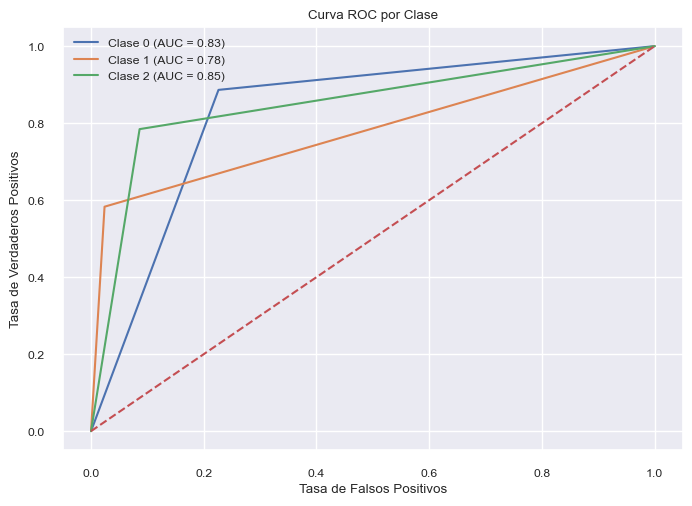

In [268]:
model_9_random = RandomForestClassifier(n_estimators=1000, max_depth=500)
model_9_random.fit(X_train_7,y_train_7)
random_predict_9 = model_9_random.predict(X_test_7)

saca_metricas(y_test_7, random_predict_9)

In [269]:
random_predict_test_5 = model_9_random.predict(df_test_6)
df_envio = pd.concat([df_1['id'],pd.Series(random_predict_test_5)], axis = 1)
#Cambiamos el nombre de la columna a status_group
df_envio.columns.values[1] = "status_group"
# Reemplazar los valores en la primera columna usando iloc
df_envio.iloc[:, 1] = df_envio.iloc[:, 1].replace({0:'functional', 1:'functional needs repair', 2: 'non functional'})
df_envio.to_csv('subida_random_9',index=False)

Conseguimos aumentar las métricas, pero por debajo de los valores obtenidos en la segunda tramificación.

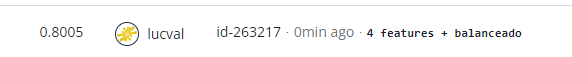

### Limpieza de variables

Una vez realizadas las transformaciones, con el fin limpiar nuestro dataframe de variables, vamos a identificar cuáles son las variables qué más afectan a nuestro modelo y cuáles son las que más afectan a nuestros modelo, y, con ello, limpiar aquellas variables duplicadas durante la transformación de variables. En primer lugar, veamos la importancia de las variables en nuestro modelo, y, en segundo y tercer lugar, la V de Cramer y correlación con nuestra objetivo.

**Importancia en nuestro modelo**

In [270]:
feature_importance = model_9_random.feature_importances_

Importancia de las características:
1. longitude: 0.0722717196440402
2. latitude: 0.07007719424538189
3. quantity: 0.05992783291302507
4. quantity_new: 0.05940779314353203
5. wpt_name: 0.053064740692257285
6. subvillage: 0.048638392970500925
7. gps_height: 0.03962463612871423
8. ward: 0.032404498917670756
9. funder: 0.02829860792589145
10. population: 0.02809919595548059
11. scheme_name: 0.02003389776358294
12. waterpoint_type: 0.01986770944803078
13. subvillage_new: 0.019528845479242354
14. waterpoint_type_new: 0.019424498671732328
15. lga: 0.018894404978637515
16. installer: 0.017719067223625335
17. waterpoint_type_group: 0.017293832621992414
18. ward_new: 0.01666054836512547
19. payment_new: 0.013415970421240861
20. payment: 0.01333415157101845
21. amount_tsh: 0.013329513788628898
22. amount_tsh_tramificado: 0.013161884800189538
23. extraction_type_class_new: 0.012706391402300954
24. district_code: 0.012278758649644003
25. extraction_type_class: 0.012154306324462768
26. region: 0.01

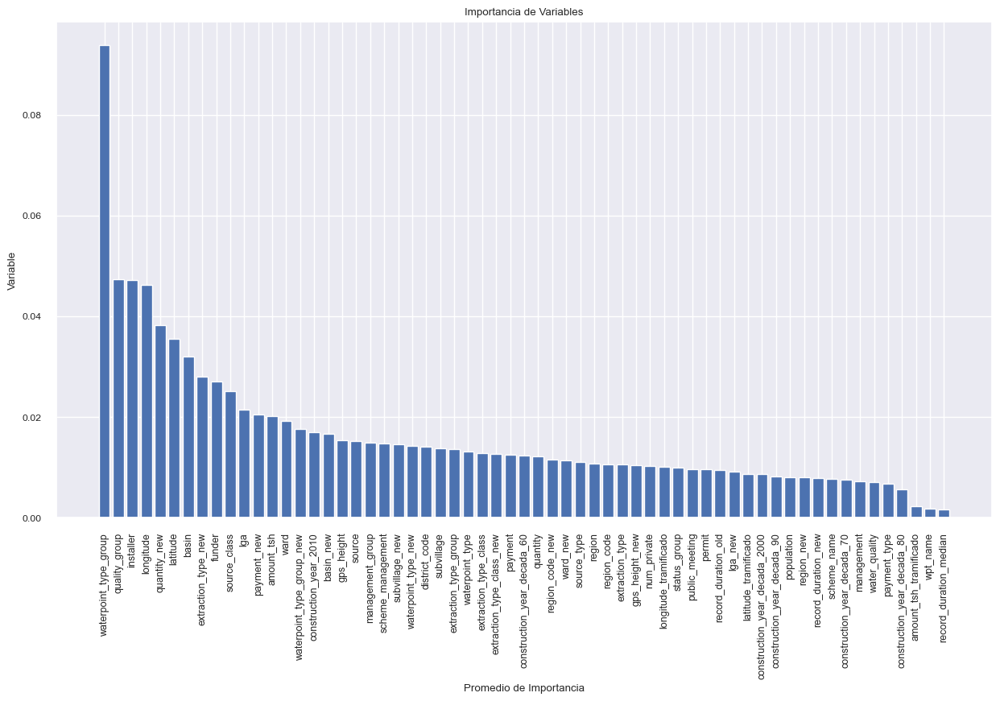

In [271]:
sorted_indices = feature_importance.argsort()[::-1]

# Imprime la importancia de las características
print("Importancia de las características:")
for i, idx in enumerate(sorted_indices):
    print(f"{i+1}. {X_train_7.columns[idx]}: {feature_importance[idx]}")

# Extrae las variables y sus promedios de importancia ordenados
variables = [item[0] for item in sorted_importances]
importancias = [item[1] for item in sorted_importances]

# Crea el gráfico de barras
plt.figure(figsize=(15, 8))
plt.bar(variables, importancias)
plt.xlabel('Promedio de Importancia')
plt.ylabel('Variable')
plt.title('Importancia de Variables')
plt.xticks(rotation=90,fontsize=9) 
plt.show()

**V de Cramer**

In [272]:
varObjCat = df_mod_4.status_group
imputdf = df_mod_4.drop(['status_group'],axis=1)
varObjCat.describe()

count    59400.000000
mean         0.841162
std          0.949794
min          0.000000
25%          0.000000
50%          0.000000
75%          2.000000
max          2.000000
Name: status_group, dtype: float64

In [273]:
imputdf['aleatorio'] = np.random.uniform(0,1,size=df.shape[0])
imputdf['aleatorio2'] = np.random.uniform(0,1,size=df.shape[0])

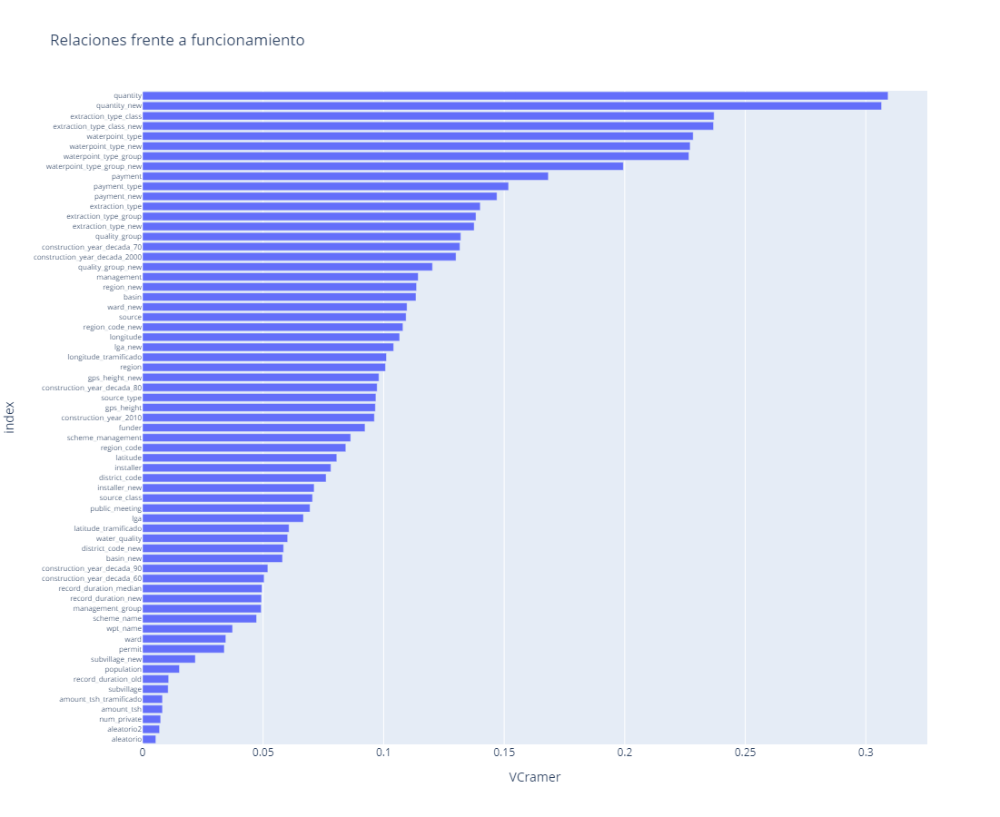

In [274]:
# Función para calcular VCramer
def cramers_v(var1, varObj):
    
    if not var1.dtypes.name == 'category':
        #bins = min(5,var1.value_counts().count())
        var1 = pd.cut(var1, bins = 5)
    if not varObj.dtypes == 'category': #np.issubdtype(varObj, np.number):
        #bins = min(5,varObj.value_counts().count())
        varObj = pd.cut(varObj, bins = 5)
        
    data = pd.crosstab(var1, varObj).values
    vCramer = stats.contingency.association(data, method = 'cramer')
    return vCramer


# Aplicar la función al input completo contra la objetivo
tablaCramer = pd.DataFrame(imputdf.apply(lambda x: cramers_v(x,varObjCat)),columns=['VCramer'])

# Obtener el gráfico de importancia de las variables frente a la objetivo continua según vcramer
import plotly.express as px
fig = px.bar(tablaCramer,x=tablaCramer.VCramer,title='Relaciones frente a funcionamiento').update_yaxes(categoryorder="total ascending")

# Ajustar el tamaño de la figura
fig.update_layout(
    width=1000,
    height=900,
)

fig.update_yaxes(tickfont=dict(size=8))  # Puedes ajustar el tamaño de la fuente según tus preferencias


# Mostrar el gráfico
fig.show()

Todas las variables tienen más relación que las expurias.

**Correlación**

In [275]:
corr = abs(df_mod_4.corr())
corr[['status_group']].sort_values(by = 'status_group',ascending = False)

,status_group
status_group,1.000000
waterpoint_type_new,0.311353
extraction_type_class_new,0.209448
waterpoint_type,0.206507
waterpoint_type_group,0.206431
...,...
subvillage,0.006562
longitude_tramificado,0.005364
num_private,0.005021
longitude,0.004814


#### Eliminación de variables

Únicamente hemos eliminado las variables originales en las que la transformada aporte significativamente más o menos que la original.

##### quantity y quantity_new 

A nivel de comportamiento de la variable quantity y su transformada, vemos que quatinty_new tiene mayor grado de correlación, pero menor grado de importancia en el modelo y en V de Cramer que la original .

En ese sentido, para nostros es relevante la importancia en el modelo, por lo que vamos a eliminar la transformada.

In [276]:
df_mod_5 =df_mod_4.copy()

In [277]:
df_mod_5.drop('quantity_new',axis=1,inplace=True)

##### waterpoint_type + waterpoint_type new

En este caso vemos una mayor influencia en el modelo de la variable transformada, y un grado de correlación más elevado. Eliminamos la variable original.

In [278]:
df_mod_5.drop('waterpoint_type',axis=1,inplace=True)

##### longitude + latitude

En ambos casos la variable transformada correlaciona peor e influencia peor en el modelo.

In [279]:
df_mod_5.drop(['longitude','latitude'],axis=1,inplace=True)

##### extraction_type_class + extraction_type_class_new

Mayor influencia en el modelo y correlación de la variable transformada, eliminamos la original.

In [280]:
df_mod_5.drop('extraction_type_class',axis=1,inplace=True)

##### waterpoint_type_group + waterpoint_type_group_new

La transformación de la variable da peores resultados en modelización, correlación y V de Cramer. Eliminamos la transformada.

In [281]:
df_mod_5.drop('waterpoint_type_group_new',axis=1,inplace=True)

##### payment + payment_new

Peores valores en la variable transformada.

In [282]:
df_mod_5.drop('payment_new',axis=1,inplace=True)

In [283]:
def limpieza(data):
    data.drop(['quantity_new','waterpoint_type','longitude','latitude','extraction_type_class','waterpoint_type_group_new','payment_new'],
               axis=1,inplace=True)
    return data


### Modelización

In [284]:
X_train_8,X_test_8,y_train_8,y_test_8 = particion_datos(df_mod_5,'status_group',0.2,None)

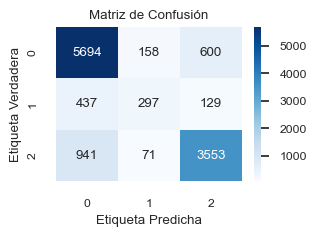

ACCURACY
Accuracy promedio: 
0.8033670033670034
PRECISION
Precisión por cada clase: 
[0.80514706 0.56463878 0.82975245]
Precisión promedio del modelo: 
0.8033670033670034
RECALL
Recall por cada clase: 
[0.88251705 0.34414832 0.77831325]
Recall promedio del modelo: 
0.8033670033670034
F1
F1 por cada clase: 
[0.84205856 0.42764579 0.80321013]
F1 promedio del modelo: 
0.8033670033670034


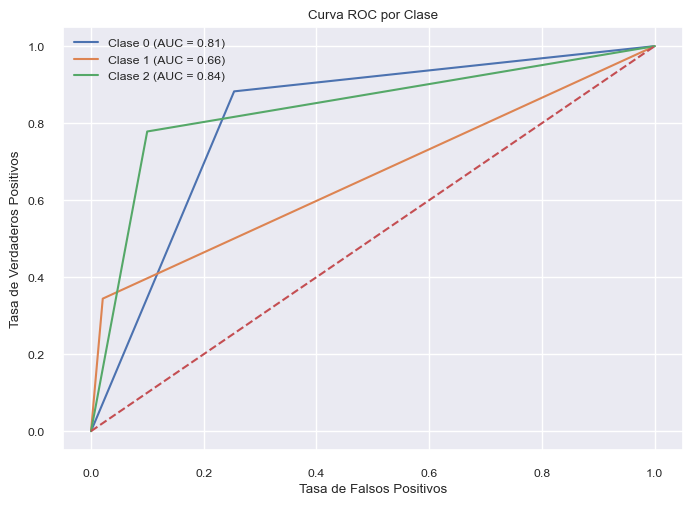

In [285]:
model_9_random = RandomForestClassifier(n_estimators=1000, max_depth=500)
model_9_random.fit(X_train_8,y_train_8)
random_predict_9 = model_9_random.predict(X_test_8)

saca_metricas(y_test_8, random_predict_9)

In [286]:
df_test_7 = df_1.copy()
df_test_7 = preprocesado(df_test_7)
df_test_7 = numerico(df_test_7)
df_test_7 = feature_engineering(df_test_7)
df_test_7 = feature_engineering_2(df_test_7)
df_test_7 = feature_engineering_3(df_test_7)
df_test_7 = feature_engineering_4(df_test_7)
df_test_7 = limpieza(df_test_7)

In [287]:
random_predict_test_5 = model_9_random.predict(df_test_7)
df_envio = pd.concat([df_1['id'],pd.Series(random_predict_test_5)], axis = 1)
#Cambiamos el nombre de la columna a status_group
df_envio.columns.values[1] = "status_group"
# Reemplazar los valores en la primera columna usando iloc
df_envio.iloc[:, 1] = df_envio.iloc[:, 1].replace({0:'functional', 1:'functional needs repair', 2: 'non functional'})
df_envio.to_csv('subida_random_9',index=False)

Este último paso no ha aportado certidumbre a nuestro modelo y hemos perdido información. Por lo que, tras haber realizado la prueba, volveríamos al dataframe anterior y eliminariamos este paso, hemos eliminado información que le aporta certidumbre a nuestro modelo.
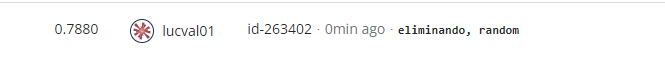

# Resumen y Conclusiones

Haremos un breve resumen de los pasos realizados en las transformacion, los modelos empleados y cuál es la valoración de cada uno de ellos. Como punto y final tomaremos las conclusiones del modelo más productivo obtenido y futuros pasos en la mejora del modelo.

## Pasos realizados 

##### 1. Preprocesado

1.1- Generamos un DataFrame único con todos los valores que emplearemos en el traning.

1.2- Tranformación de las variables tiempo: Generamos la variabel record_duration en días, como resta de la fecha máximo menos día indicado de registro.

1.3- Imputación de valores nulos: Las variables booleandas las realizaremos mediante la moda y las variables categóricas generaremos una nuevo campo denominado unknown para estos valores nulos.

1.4- Transformación a valores numéricos: Las booleanas las cambiamos a tipo int y las categóricas las transformamos también a numéricas mediante LabelEncoder().

##### 2. Modelización

2.1- Primera aproximación: Lanzamos pycaret: Los tres modelos más adecuados para nuestros datos en relación a la variable objetivo son Random Forest Classifier, Extreme Gradient Boosting y Extra Trees Classifier. 

2.2 - Importancia de las variables: Las variables más importantes para nuestro modelo, en orden serán: longitude, latitude, quantity_group, quantity, wpt_name, subvillagre, record_duration, gps_height, construction_year y ward.

2.3 - RandomForest: Lanzamos un primer modelo RandomForest, accuracy general del modelo de 0.811 y en el testo 0.8044.

2.4 - xgbooster: Segundo modelo más adecuado mostrado por pycaret. Accuracy general del modelo de 0.804 y obtenido en el testo muy similar 0.8044.

2.5 - DecissionTreeClasiffier: Métricas muy bajas, 0.744 de accuracy general y 0.6538 en la fase de testeo. En futuros pasos no volveremos a este algoritmo ya que no nos da buenas métricas en comparación con los otros dos.

##### 3. Transformación y tramificación de variables

A lo largo de la modelización iremos realizando diferentes transformaciones a nuestras variables. El objetivo es mejorar el rendimiento de nuestro modelo y testear cómo se comporta frente a la modificación de estas variables. Para definir la prioridad de las variables a transformar emplearemos V de Cramer.

Como resultado vemos que las variables que más se relacionan con nuestro objetivo son: quantity_group, quantity,extraction_type_class,waterpoint_type:class,waterpoint_type_group,payment,payment_type.. etc


##### 4. Feature engineering

Con el objeto de poder monitorizar el impacto de nuestras trasnformaciones en las variables, realizaremos la modificación de las variables gradualmente, e iremos modelizando intermitentemente para ver si mejora o disminuye el rendimiento de nuestro modelo. Modificaciones realizadas en esta primera fase:

- quantity + quantity_group: Ambas variables son iguales, eliminamos quantity_group de nuestro data set. Tramificamos nuestra variable quantity a 4 grupos en vez de 5.
- waterpoint_type + waterpoint_type_class: Tramificamos la variable waterpoint_type de 7 clases a 4.
- extraction_type: Al ser una variable con muchas clases con valores en términos de % pequeños, agrupamos los valores con un % menor al 4 en una nueva clase.
- extraction_type_class: Agrupamos las clases en 3, en vez de 6 como indicaba e dataset original.
- payment:  Agrupamos en 4, en vez de las 7 clases originales.
- recorded_by : Es una variable con un único valor en todo el dataset, no influye en nuestro modelo, por ello la vamos a eliminar.

##### 5. Modelización

Una vez realizada la transformación de variables, lanzaremos dos modelos y evaluaremos la eficacia de las transforamaciones previas.

5.1 - RandomForest: Al ser el modelo con mejor rendimiento obtenido en la modelización previa lo testeamos. El accuracy ha bajado en 0.06 (0.8059) a lo obtenido en la primera modelización sin transformación de variables, sin embargo, en la fase de testeo, nos da un mejor resultado, obtenido un 0.81 al subirlo a la plataforma.

5.2 - Hiperparámetros: Con el fin de mejorar el rendimiento de nuestro algoritmo, queremos saber cuál es el número de árboles y profundidad óptimo en nuestro RandomForest. Por ello, aplicamos GridSearchCV.

5.3 - RandomForest: Aplicamos estos hiperparámetros. Realmente sube el rendimiento de nuestro modelo en la fase de training y test de jupyter, pero, al subirlo a la plataforma, no mejora, si no que empeora la capacidad predictiva bajando a 0.8067.

5.4 - Modelos ensemble: Con estos modelos pretendemos combinar varios algoritmos y mejorar el rendimiento del modelo. Probaremos dos:

- xgboost: Este algoritmo se centra en minimizar el error. Para nuestro modelo en particular no nos está dando un buen resultado, ya que baja la accuracy general a 0.8 y en la plataforma obtenemos un 0.7798 frente a lo obtenido en RandomForest (0.81)
    
- voting: Combina los algoritmos que le indiquemos y la predicción final es la más votada. En nuestro caso empleamos los tres algoritmos prioritarios indicados por pycaret : Random Forest, Extra Trees Classififer y XGBClassifier. Obtenemos con ello un reaultado de accuracy promedio de 0.808 y en la plataforma muy similar, de 0.8081.

En esta fase de modelización el modelo que mejor rendimiento nos ofrece es el RandomForest, con un 0.81 obtenido en la plataforma.

##### 6. Feature_engineering 2

Buscamos seguir tratando y tramificando nuestras variables y observar qué impacto obtenemos con ello en el rendimiento de nuestro modelo. Para obtener el orden de tratamiento de nuestras variables sacamos la importancia de las variables en nuestro modelo Random Forest. 

- longitude: Observamos una concentración elevada de valores en 0, lo cual, por la naturaleza de nuestra variable, es imposible su existencia. Eliminamos estos valores y los imputamos mediante knn imputer. Posteriormente, tramificamos la variable en 5 tramos.

- latitude: un 3 % de lo valores agrupados en torno a 0, eliminamos estos valores y los imputamos mediante knn imputer, posteriormente tramificamos la variable en 5.

- amount_tsh: Gran cantidad de valroea atípicos, el 70 % de sus valores son 0, pero no conocemos la viabilidad de este valor, por lo que mantenemos el valor 0 y la tramificamos en 10.

- construction_year: Un 35 % de los valores son 0, lo cual es imposible, y nos hace tener una media de construcción en el año 1300 y una mediana de 1986. Eliminamos los valores 0 y los imputamos con knn imputer. Tramificamos la variable por décadas, generando una columna nueva para cada década.

##### 7 . Modelizamos

Observamos el rendimiento de nuestro modelo con estas transformaciones.

7.1 - RandomForest: Obtenemos un accuracy promedio de 0.803, más bajo que en los pasos previos, observamos que la clase 1 tiene una precisión muy baja, en torno al 0.37%, lo cual hace bajar el rendimiento general del modelo.

Tanto en pasos previos, como en la última modelización observamos que el grado de precisión para la clase 1 es muy bajo. Esto es algo natural, ya que contamos con una baja cantidad de datos en esta clase para el entrenamiento ( un 7 % aproximadamente del total). Por ello, vamos a balancear los datos y aumentar la cantidad de datos del la clase 1 ( pasaremos de un 7 % del total a un 10,5 % del total). Este paso lo realizaremos únicamente pare los datos de training, es decir, para entrenar el modelo.

7.2. RandomForest datos balanceados: Mejora sustancialmente los resultados, obteniendo un accuracy promedio de 0.815. Aumentamos en AUC de la clase 1 de 0.67 a 0.76. Lo subimos a la plataforma y obtenemos un resultado de 0.8096, muy cerca de el obtenido en la fase anterior de 0.81.

7.3 Aplicamos hiperparámetros: Queremos mejorar el rendimiento de nuestro modelo así que calculamos los hiperparámetros en nuestro modelo con datos balanceados.

7.4. Voting: Una vez calculado los hiperparámtros y, mediante un modelo voting obtenemos un accuracy de 0.819, el más elevado obtenido. Subimos a la plataforma y obtenemos un score de 0.8116, el más elevado.

##### 8. Feature Engineering 3

Continuaremos transformando las variables faltantes para buscar mejorar el rendimiento de nuestro modelo. En este caso, realizamos el siguiente tratamiento:

- record_duration: Variable generada por nosotros, con valores atípicos en torno a 3000-4000. Generamos tres tramos y columnas en función de estos valores observados graficamente.
- construction_year: Modificamos las variables para que tomen únicamente los valores de la decada.
- installer: Gran cantidad de clases con un único registro, agrupamos todas las clases con menos de 50 valores en una única clase, pasando de 2145 clases a 146.
- gps_height: Tramificamos la variable en 4.
- region_code: Tramificamos la variable en 7 clases, agrupamos las clases en función del % de presencia del total.
- region: Tramificamos la variable en 8 clases, agrupamos las clases en función del % de presencia del total.
- basin: Tramificamos la variable en 4 clases, agrupamos las clases en función del % de presencia del total.
- subvillagre: 19288 clases en total, tramificamos la variable en 8 clases, agrupamos las clases en función del % de presencia del total.
- ward: 2092 clases diferentes, tramificamos la variable en 8 clases, agrupamos las clases en función del % de presencia del total.
- lga: Agrupamos las clases en 7 en función de sus valores.
- district_code: Agrupamos las clases en 6, en función de su cantidad de valores por clase.

##### 9. Modelización

Evaluamos el rendimiento en el modelo de estas transformaciones.
- 8.1: RandomForest: Obtenemos un accuracy promedio de 0.812 y 0.7933 en el testeo. Vamos a probar si mejora el rendimiento balanceando los datos, aplicando hiperparámetros y con voting.
- 8.2: RandomForest con datos balanceados: Mejora en 0.05 el accuracy promedio .
- 8.3: Voting con datos balanceado: También aplicamos hiperparámetros, valores muy elevados en predicción en el testeo en jupyter, con un promdeio de 0.8212, cuando lo subimos a la plataforma, sin embargo, baja a 0.7914. 

##### 10. Feature Engineering 4

Última tramificación y tratamiento de variables en base al grado de importancia de las variables en el último modelo voting realizado.
- waterpoint_type_group: La tramificamos en función de los % respecto del total en 3 tramos.
- quality_group: Tramificamos de 6 grupos a 3 en función de sus valores.
- installer: Gran cantidad de datos con muy pocas instalaciones, agrupamos en función del % de representación en 6 grupos.

##### 11. Modelización

Aplicamos los siguientes modelos:
- RandomForest: Obtenemos un accuracy promedio de 0.817 pero, en la fase de la plataforma un 0.7979. Como ocurría con los anteriores modelos, el modelo predice mejor con los datos de entrenamiento que con los de testeo.
- Voting: Accuracy promedio de 0.819 y en test 0.7916. Aunque mejora el rendimiento en el training- test no mejora sus resultados en la plataforma.
- Voting balanceado: Mejoramos en 0.003 el resultado anterior, aun así muy por debajo del 0.819 obtenido en anteriores modelos.
- Random balancado y con hiperparámetros: Resultados más favorables en jupyter, con un 0.938 y una precisión en la clase 1  de 0.949.En el test de la plataforma subimos a 0.8005, aun así lejos de los obtenido en anteriores resultados.

##### 12. Limpieza de variables

En los diferentes momentos de transformación de variables hemos ido generando nuevas variables en base a las originales, vamos a eliminar las duplicidades y probar si esto mejora el rendimiento de nuestro modelo final.
- quantity : Eliminamos la variable transformada, ya que la variable original sigue teniendo un grado de importancia mayor para nuestro modelo.
- waterpoint_type: Eliminamos la variable original, la variable trasnformada posee un mayor grado de correlación e importancia en el modelo.
- longitude + latitude : Mayor importancia en el modelo y correlación de la variable original, eliminamos la transformada.
- extraction_type_class: Eliminamos la variable original.
- waterpoint_type_group: Peor comportamiento de la variable transformada, eliminamos la transformada.
- payment_new : Peor comportamiento de la variable transformada, eliminamos la transformada.

##### 13. Modelización
Probamos el modelo y tanto en la fase de training-test con un 0.8, como en la plataforma con un 0.788, bajamos el score y no le aporta valor a nuestro modelo. Con todo y con ello, entendemos que este último ha generado pérdida de información a nuestro modelo y disminuye la certidumbre, por lo que es un paso a eliminar y recurriríamos a DataFrames anteriores.

## Conclusiones

Hemos realizado diversas tramificaciones en nuestro DataFrame y testeos. 

La transformación que mejor resultado nos ha ofrecido ha sido la tramificación relizada en el paso 1 y 2.

- waterpoint_type + waterpoint_type_class: Tramificamos la variable waterpoint_type de 7 clases a 4.
- extraction_type: Al ser una variable con muchas clases con valores en términos de % pequeños, agrupamos los valores con un % menor al 4 en una nueva clase.
- extraction_type_class: Agrupamos las clases en 3, en vez de 6 como indicaba e dataset original.
- payment:  Agrupamos en 4, en vez de las 7 clases originales.
- recorded_by : Es una variable con un único valor en todo el dataset, no influye en nuestro modelo, por ello la vamos a eliminar.
- longitude: Observamos una concentración elevada de valores en 0, lo cual, por la naturaleza de nuestra variable, es imposible su existencia. Eliminamos estos valores y los imputamos mediante knn imputer. Posteriormente, tramificamos la variable en 5 tramos.

- latitude: un 3 % de lo valores agrupados en torno a 0, eliminamos estos valores y los imputamos mediante knn imputer, posteriormente tramificamos la variable en 5.

- amount_tsh: Gran cantidad de valroea atípicos, el 70 % de sus valores son 0, pero no conocemos la viabilidad de este valor, por lo que mantenemos el valor 0 y la tramificamos en 10.

- construction_year: Un 35 % de los valores son 0, lo cual es imposible, y nos hace tener una media de construcción en el año 1300 y una mediana de 1986. Eliminamos los valores 0 y los imputamos con knn imputer. Tramificamos la variable por décadas, generando una columna nueva para cada década.

En cuanto a la modelización empleada, hemos realizado mayoritariamente Random Forest y voting. Con Random Forest hemos obtenido puntuaciones de 0.81 y 0.8096, pero el score más elevado lo encontramos con el modelo voting, con ExtraTreesClassifier + RandomForest y XGBClassifier. 

Como la clase 1, únicamenye representa un 7 % de los datos hemos realizado un balanceo de los datos y aplicado hiperparámetros, con todo y con ello, obtenemos un score de 0.8116 en la plataforma y un 0.823 de accuracy promedio en nuestro modelo.

Para obtener este score hemos realizado diversas pruebas y un total de 25 + 11 submissions.
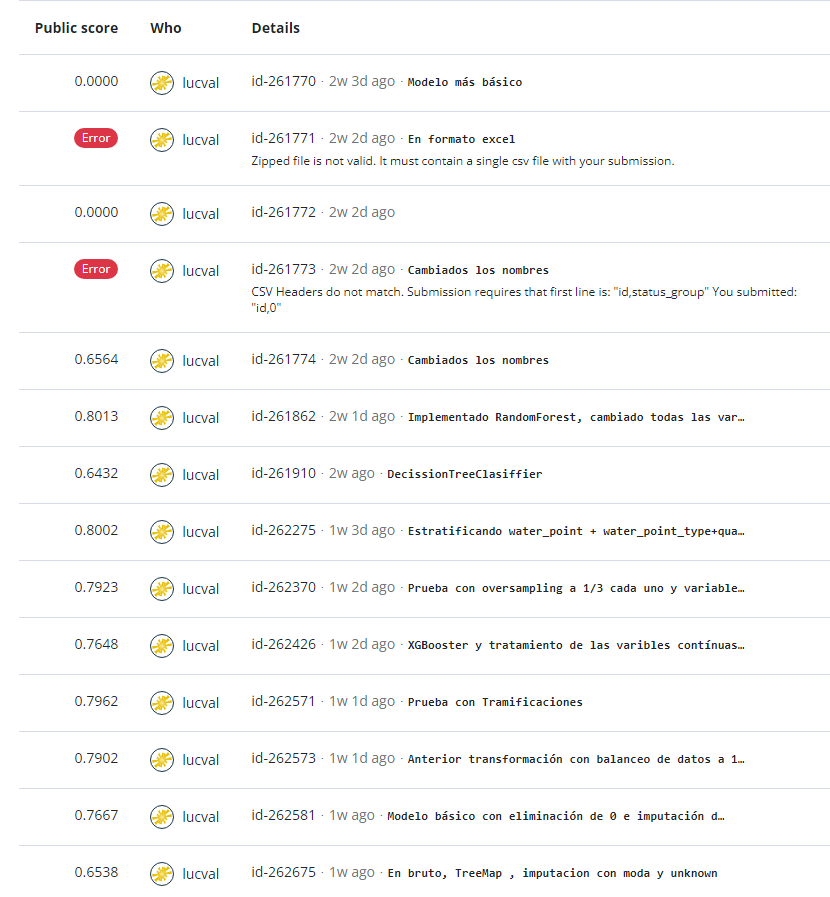
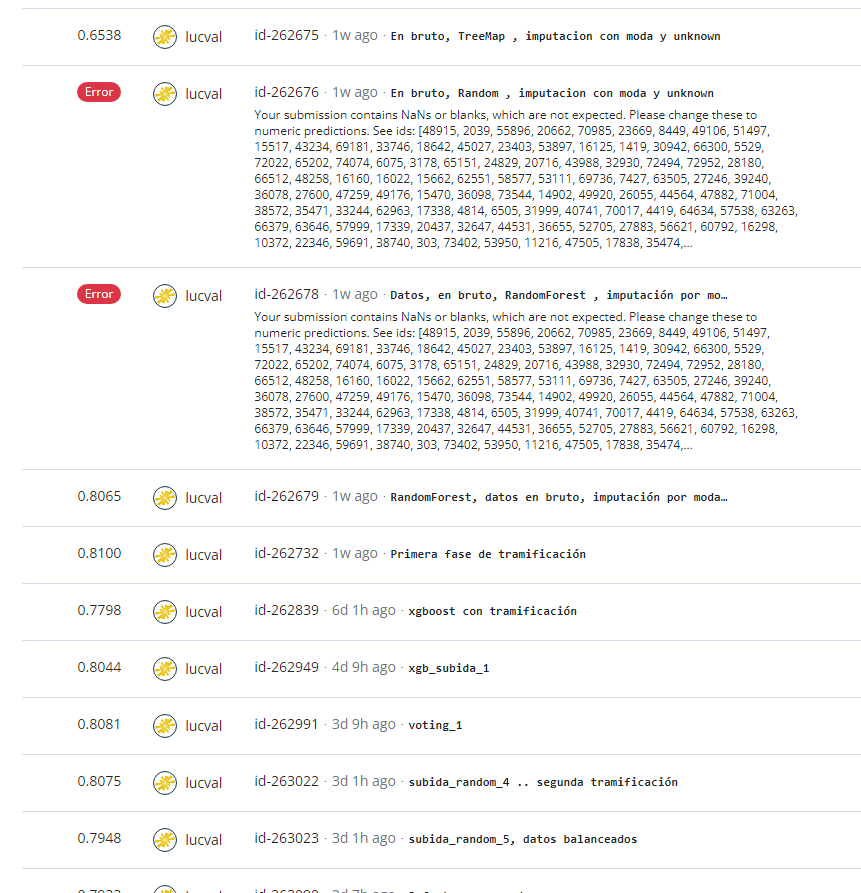
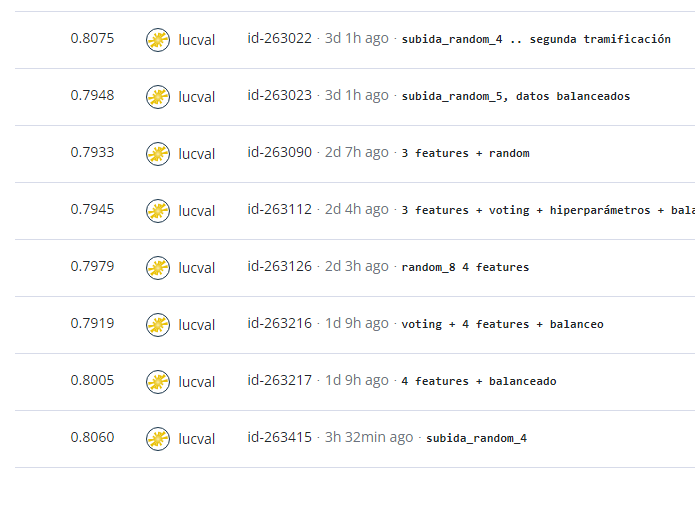
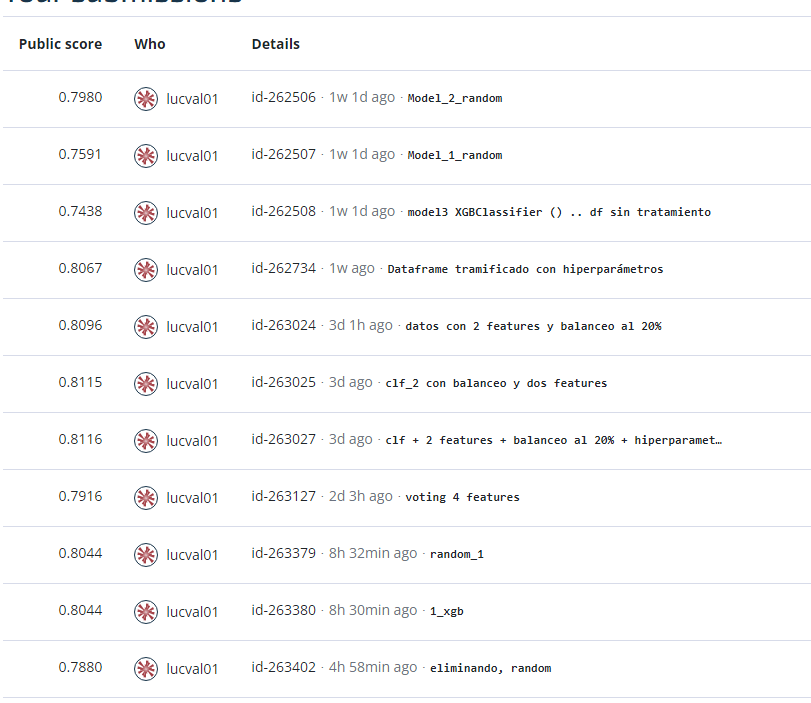
